In [ ]:
# @title
! pip install kaggle

In [ ]:
# @title
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
# @title
# Create the .kaggle directory if it doesn't exist
!mkdir -p ~/.kaggle/

# Copy the kaggle.json file from your Google Drive to the .kaggle directory
!cp "/content/drive/MyDrive/Colab Notebooks/kaggle.json" ~/.kaggle/kaggle.json

# Set the correct permissions for the kaggle.json file
!chmod 600 ~/.kaggle/kaggle.json

In [ ]:
# @title
! kaggle datasets download murtozalikhon/brain-tumor-multimodal-image-ct-and-mri

Dataset URL: https://www.kaggle.com/datasets/murtozalikhon/brain-tumor-multimodal-image-ct-and-mri
License(s): CC-BY-NC-SA-4.0
 82% 295M/361M [00:00<00:00, 857MB/s] 
100% 361M/361M [00:00<00:00, 720MB/s]


In [ ]:
# @title
!unzip /content/brain-tumor-multimodal-image-ct-and-mri.zip

Streaming output truncated to the last 5000 lines.
  inflating: Dataset/Brain Tumor MRI images/Healthy/mri_healthy (1).jpg  
  inflating: Dataset/Brain Tumor MRI images/Healthy/mri_healthy (10).jpg  
  inflating: Dataset/Brain Tumor MRI images/Healthy/mri_healthy (100).jpg  
  inflating: Dataset/Brain Tumor MRI images/Healthy/mri_healthy (1000).jpg  
  inflating: Dataset/Brain Tumor MRI images/Healthy/mri_healthy (1001).jpg  
  inflating: Dataset/Brain Tumor MRI images/Healthy/mri_healthy (1002).jpg  
  inflating: Dataset/Brain Tumor MRI images/Healthy/mri_healthy (1003).jpg  
  inflating: Dataset/Brain Tumor MRI images/Healthy/mri_healthy (1004).jpg  
  inflating: Dataset/Brain Tumor MRI images/Healthy/mri_healthy (1005).jpg  
  inflating: Dataset/Brain Tumor MRI images/Healthy/mri_healthy (1006).jpg  
  inflating: Dataset/Brain Tumor MRI images/Healthy/mri_healthy (1007).jpg  
  inflating: Dataset/Brain Tumor MRI images/Healthy/mri_healthy (1008).jpg  
  inflating: Dataset/Brain Tumo

## Visualize Training Progress

Plot the training and validation loss and accuracy over epochs to visualize the model's learning progress and identify potential issues like overfitting.

## Visualize Preprocessing Effects

Display a few sample paired images *before* and *after* applying the preprocessing transformations (including data augmentation) to visually inspect the effects of resizing, rotation, and other augmentations.

In [ ]:
# @title
import os
import cv2
import numpy as np
import matplotlib.pyplot as plt
import os
import pandas as pd
import tensorflow as tf
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Input, Conv2D, MaxPooling2D, Flatten, Dense, Dropout
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder

First, load the image paths and their corresponding labels for both CT and MRI scans using the `load_image_paths_and_labels` function. This function iterates through the category subfolders ('Healthy', 'Tumor') within the specified base paths, lists the image files, and returns a pandas DataFrame containing the image paths and their respective category labels.

In [ ]:
# @title
ct_scan_base_path = '/content/Dataset/Brain Tumor CT scan Images'
categories = ["Healthy","Tumor"]
mri_scan_base_path = '/content/Dataset/Brain Tumor MRI images'

In [ ]:
# @title
# Define the specific image names for the tumor images
sample_ct_tumor_image_name = "ct_tumor (9).jpg"
sample_mri_tumor_image_name = "tumor (9).jpg"

# Construct the full paths
sample_ct_tumor_image_path = os.path.join(ct_scan_base_path, "Tumor", sample_ct_tumor_image_name)
sample_mri_tumor_image_path = os.path.join(mri_scan_base_path, "Tumor", sample_mri_tumor_image_name)

# Print the constructed paths
print(f"Sample CT Tumor Image Path: {sample_ct_tumor_image_path}")
print(f"Sample MRI Tumor Image Path: {sample_mri_tumor_image_path}")

Sample CT Tumor Image Path: /content/Dataset/Brain Tumor CT scan Images/Tumor/ct_tumor (9).jpg
Sample MRI Tumor Image Path: /content/Dataset/Brain Tumor MRI images/Tumor/tumor (9).jpg


Encode the categorical labels ('Healthy', 'Tumor') into numerical format (0, 1) using `LabelEncoder` from scikit-learn. This is necessary for training the model.

Create a paired DataFrame that links corresponding CT and MRI image paths based on their filename patterns. This is a crucial step to ensure that the model is trained and evaluated on paired images.

Define a custom PyTorch Dataset class, `PairedBrainTumorDataset`, to load and preprocess the paired CT and MRI images. This dataset class will handle reading the images from the file paths specified in the paired DataFrame, applying transformations, and returning the paired image tensors and their corresponding labels.

In [ ]:
# @title
import os
import pandas as pd

def load_image_paths_and_labels(base_path, categories, limit_per_category=None):
    """
    Loads image paths and their corresponding labels from specified directories.

    Args:
        base_path (str): The base directory containing category subfolders.
        categories (list): A list of category names (subfolder names).
        limit_per_category (int, optional): Maximum number of images to load per category.
                                            Defaults to None (load all).

    Returns:
        pandas.DataFrame: A DataFrame with 'image_path' and 'label' columns.
    """
    image_paths = []
    labels = []

    for category in categories:
        category_path = os.path.join(base_path, category)
        print(f"Checking category path: {category_path}")


        if not os.path.exists(category_path):
            print(f"Warning: Category path not found: {category_path}")
            continue

        images = os.listdir(category_path)
        if limit_per_category is not None:
            images = images[:limit_per_category]

        for image_name in images:
            image_path = os.path.join(category_path, image_name)
            # Basic check to ensure it's a file (not a directory)
            if os.path.isfile(image_path):
                image_paths.append(image_path)
                labels.append(category)

    return pd.DataFrame({
        "image_path": image_paths,
        "label": labels
    })

# Load CT image data
ct_scan_base_path = '/content/Dataset/Brain Tumor CT scan Images'
categories = ["Healthy","Tumor"]
print(f"Loading CT images from: {ct_scan_base_path}")
ct_df = load_image_paths_and_labels(ct_scan_base_path, categories, limit_per_category=2000)

# Load MRI image data (assuming similar structure)
mri_scan_base_path = '/content/Dataset/Brain Tumor MRI images'
print(f"Loading MRI images from: {mri_scan_base_path}")
mri_df = load_image_paths_and_labels(mri_scan_base_path, categories, limit_per_category=2000) # Applying same limit as CT

print("CT DataFrame Head:")
display(ct_df.head())
print("\nMRI DataFrame Head:")
display(mri_df.head())

Loading CT images from: /content/Dataset/Brain Tumor CT scan Images
Checking category path: /content/Dataset/Brain Tumor CT scan Images/Healthy
Checking category path: /content/Dataset/Brain Tumor CT scan Images/Tumor
Loading MRI images from: /content/Dataset/Brain Tumor MRI images
Checking category path: /content/Dataset/Brain Tumor MRI images/Healthy
Checking category path: /content/Dataset/Brain Tumor MRI images/Tumor
CT DataFrame Head:


,image_path,label
0,/content/Dataset/Brain Tumor CT scan Images/He...,Healthy
1,/content/Dataset/Brain Tumor CT scan Images/He...,Healthy
2,/content/Dataset/Brain Tumor CT scan Images/He...,Healthy
3,/content/Dataset/Brain Tumor CT scan Images/He...,Healthy
4,/content/Dataset/Brain Tumor CT scan Images/He...,Healthy



MRI DataFrame Head:


,image_path,label
0,/content/Dataset/Brain Tumor MRI images/Health...,Healthy
1,/content/Dataset/Brain Tumor MRI images/Health...,Healthy
2,/content/Dataset/Brain Tumor MRI images/Health...,Healthy
3,/content/Dataset/Brain Tumor MRI images/Health...,Healthy
4,/content/Dataset/Brain Tumor MRI images/Health...,Healthy


In [ ]:
# @title
from sklearn.preprocessing import LabelEncoder

def encode_labels(dataframe, label_column='label'):
    """
    Encodes categorical labels into numerical format.

    Args:
        dataframe (pandas.DataFrame): The DataFrame containing the label column.
        label_column (str): The name of the column with categorical labels.

    Returns:
        tuple: A tuple containing:
            - pandas.DataFrame: The DataFrame with an added 'category_encoded' column.
            - sklearn.preprocessing.LabelEncoder: The fitted LabelEncoder object.
    """
    label_encoder = LabelEncoder()
    dataframe['category_encoded'] = label_encoder.fit_transform(dataframe[label_column])
    return dataframe, label_encoder

# Encode labels for both CT and MRI dataframes (although they should be the same categories)
ct_df, label_encoder_ct = encode_labels(ct_df.copy()) # Use .copy() to avoid modifying original df
mri_df, label_encoder_mri = encode_labels(mri_df.copy()) # Use .copy() to avoid modifying original df

# Keep only necessary columns
ct_df = ct_df[['image_path', 'category_encoded']]
mri_df = mri_df[['image_path', 'category_encoded']]

print("CT DataFrame after encoding:")
display(ct_df.head())
print("\nMRI DataFrame after encoding:")
display(mri_df.head())

CT DataFrame after encoding:


,image_path,category_encoded
0,/content/Dataset/Brain Tumor CT scan Images/He...,0
1,/content/Dataset/Brain Tumor CT scan Images/He...,0
2,/content/Dataset/Brain Tumor CT scan Images/He...,0
3,/content/Dataset/Brain Tumor CT scan Images/He...,0
4,/content/Dataset/Brain Tumor CT scan Images/He...,0



MRI DataFrame after encoding:


,image_path,category_encoded
0,/content/Dataset/Brain Tumor MRI images/Health...,0
1,/content/Dataset/Brain Tumor MRI images/Health...,0
2,/content/Dataset/Brain Tumor MRI images/Health...,0
3,/content/Dataset/Brain Tumor MRI images/Health...,0
4,/content/Dataset/Brain Tumor MRI images/Health...,0


In [ ]:
# @title
import re
import os
import pandas as pd

def create_paired_dataframe(ct_df, mri_df, categories, ct_base_path, mri_base_path):
    """
    Creates a DataFrame of paired CT and MRI image paths based on filename patterns.

    Args:
        ct_df (pandas.DataFrame): DataFrame with CT image paths and encoded categories.
        mri_df (pandas.DataFrame): DataFrame with MRI image paths and encoded categories.
        categories (list): List of category names.
        ct_base_path (str): Base path for CT images.
        mri_base_path (str): Base path for MRI images.


    Returns:
        pandas.DataFrame: A DataFrame with 'ct_image_path', 'mri_image_path',
                          and 'category_encoded' columns for paired images.
    """
    paired_image_paths = []
    mri_path_lookup = {}

    # Create a lookup dictionary for MRI paths based on filename and category
    for index, row in mri_df.iterrows():
        mri_path = row['image_path']
        mri_filename = os.path.basename(mri_path)
        category_encoded = row['category_encoded']
        category_name = categories[category_encoded]
        mri_path_lookup[(category_name, mri_filename)] = mri_path

    # Iterate through CT images and find corresponding MRI images
    for index, row in ct_df.iterrows():
        ct_image_path = row['image_path']
        category_encoded = row['category_encoded']
        category_name = categories[category_encoded]

        ct_filename = os.path.basename(ct_image_path)
        # Extract the number from the CT filename (e.g., '9' from 'ct_tumor (9).jpg')
        match = re.search(r'\((\d+)\)', ct_filename)

        mri_image_path = None

        if match:
            number = match.group(1)
            if category_name == "Tumor":
                # Expected MRI filename format for Tumor: tumor (X).jpg
                mri_filename_candidate = f"tumor ({number}).jpg"
            elif category_name == "Healthy":
                # Expected MRI filename format for Healthy: mri_healthy (X).jpg
                mri_filename_candidate = f"mri_healthy ({number}).jpg"

            # Check if the corresponding MRI file exists using the lookup
            if (category_name, mri_filename_candidate) in mri_path_lookup:
                 mri_image_path = mri_path_lookup[(category_name, mri_filename_candidate)]
            else:
                # Handle cases where the filename pattern might differ
                # For example, some healthy CT images are .png and some healthy MRI are .jpg
                # Let's check for healthy MRI images with the same number but .jpg extension
                if category_name == "Healthy":
                    mri_filename_candidate_jpg = f"mri_healthy ({number}).jpg"
                    if (category_name, mri_filename_candidate_jpg) in mri_path_lookup:
                        mri_image_path = mri_path_lookup[(category_name, mri_filename_candidate_jpg)]
                    # Also check for healthy CT .png and healthy MRI .png
                    elif ct_filename.endswith('.png'):
                         mri_filename_candidate_png = f"mri_healthy ({number}).png"
                         if (category_name, mri_filename_candidate_png) in mri_path_lookup:
                             mri_image_path = mri_path_lookup[(category_name, mri_filename_candidate_png)]


        # If a corresponding MRI image path was found, add the pair
        if mri_image_path is not None:
            paired_image_paths.append({
                'ct_image_path': ct_image_path,
                'mri_image_path': mri_image_path,
                'category_encoded': category_encoded
            })
        else:
            # Optional: Print a warning for unpaired images
            # print(f"Warning: Could not find paired MRI for CT: {ct_image_path}")
            pass


    return pd.DataFrame(paired_image_paths)

# Create the paired dataframe
paired_df = create_paired_dataframe(ct_df, mri_df, categories, ct_scan_base_path, mri_scan_base_path)


print("Paired DataFrame Head:")
display(paired_df.head())
print("\nPaired DataFrame Shape:")
print(paired_df.shape)

Paired DataFrame Head:


,ct_image_path,mri_image_path,category_encoded
0,/content/Dataset/Brain Tumor CT scan Images/He...,/content/Dataset/Brain Tumor MRI images/Health...,0
1,/content/Dataset/Brain Tumor CT scan Images/He...,/content/Dataset/Brain Tumor MRI images/Health...,0
2,/content/Dataset/Brain Tumor CT scan Images/He...,/content/Dataset/Brain Tumor MRI images/Health...,0
3,/content/Dataset/Brain Tumor CT scan Images/He...,/content/Dataset/Brain Tumor MRI images/Health...,0
4,/content/Dataset/Brain Tumor CT scan Images/He...,/content/Dataset/Brain Tumor MRI images/Health...,0



Paired DataFrame Shape:
(2437, 3)


In [ ]:
# @title
import torch
from torch.utils.data import Dataset
import cv2
from torchvision import transforms

class PairedBrainTumorDataset(Dataset):
    def __init__(self, dataframe, transform=None):
        self.dataframe = dataframe
        self.transform = transform

    def __len__(self):
        return len(self.dataframe)

    def __getitem__(self, idx):
        # Return the original index along with the data
        original_idx = self.dataframe.index[idx]

        ct_img_path = self.dataframe.iloc[idx, self.dataframe.columns.get_loc('ct_image_path')]
        mri_img_path = self.dataframe.iloc[idx, self.dataframe.columns.get_loc('mri_image_path')]
        label = self.dataframe.iloc[idx, self.dataframe.columns.get_loc('category_encoded')]

        ct_image = cv2.imread(ct_img_path, cv2.IMREAD_GRAYSCALE)
        mri_image = cv2.imread(mri_img_path, cv2.IMREAD_GRAYSCALE)

        if ct_image is None:
            print(f"Warning: Could not load CT image at {ct_img_path}")
            ct_image_tensor = torch.zeros(1, 128, 128)
        else:
            if self.transform:
                ct_image_tensor = self.transform(ct_image)
            else:
                # Apply basic resizing and normalization if no transform is provided
                ct_image_resized = cv2.resize(ct_image, (128, 128))
                ct_image_tensor = torch.from_numpy(ct_image_resized).unsqueeze(0).float() / 255.0

        if mri_image is None:
            print(f"Warning: Could not load MRI image at {mri_img_path}")
            mri_image_tensor = torch.zeros(1, 128, 128)
        else:
            if self.transform:
                mri_image_tensor = self.transform(mri_image)
            else:
                 # Apply basic resizing and normalization if no transform is provided
                 mri_image_resized = cv2.resize(mri_image, (128, 128))
                 mri_image_tensor = torch.from_numpy(mri_image_resized).unsqueeze(0).float() / 255.0

        # Return dummy label (-1) if either image failed to load
        if ct_image is None or mri_image is None:
             label = -1

        # Return the original index as the first element
        return original_idx, ct_image_tensor, mri_image_tensor, label

Split the paired DataFrame into training, validation, and testing sets. This is essential for training and evaluating the model properly. Data augmentation transformations are also defined here and applied to the datasets.

In [ ]:
# @title
from sklearn.model_selection import train_test_split
from torch.utils.data import Dataset, DataLoader
import cv2
import torch
from torchvision import transforms
import numpy as np
# Calculate mean and std deviation for the training dataset
# Iterate through the raw images in the training dataframe
print("Calculating mean and standard deviation for the training dataset...")

mean_val = 0.
std_val = 0.
pixel_count = 0

for index, row in paired_df.iterrows():
    ct_path = row['ct_image_path']
    mri_path = row['mri_image_path']

    # Load images as grayscale numpy arrays
    ct_image = cv2.imread(ct_path, cv2.IMREAD_GRAYSCALE)
    mri_image = cv2.imread(mri_path, cv2.IMREAD_GRAYSCALE)

    # Resize images to the target size (128x128) before calculating stats
    # This ensures stats are calculated on the image size the model will receive after resizing
    if ct_image is not None:
        ct_image_resized = cv2.resize(ct_image, (128, 128))
        # Scale to [0, 1] for calculation
        ct_image_float = ct_image_resized.astype(np.float32) / 255.0
        mean_val += np.sum(ct_image_float)
        pixel_count += ct_image_float.size # Count pixels from resized image

    if mri_image is not None:
        mri_image_resized = cv2.resize(mri_image, (128, 128))
        # Scale to [0, 1] for calculation
        mri_image_float = mri_image_resized.astype(np.float32) / 255.0
        mean_val += np.sum(mri_image_float)
        pixel_count += mri_image_float.size # Count pixels from resized image

dataset_mean = mean_val / pixel_count if pixel_count > 0 else 0.0

# Calculate std deviation (requires a second pass or storing values)
# Let's do a second pass for simplicity
std_val = 0.
if pixel_count > 0:
    for index, row in paired_df.iterrows():
        ct_path = row['ct_image_path']
        mri_path = row['mri_image_path']

        ct_image = cv2.imread(ct_path, cv2.IMREAD_GRAYSCALE)
        mri_image = cv2.imread(mri_path, cv2.IMREAD_GRAYSCALE)

        if ct_image is not None:
            ct_image_resized = cv2.resize(ct_image, (128, 128))
            ct_image_float = ct_image_resized.astype(np.float32) / 255.0
            std_val += np.sum((ct_image_float - dataset_mean)**2)

        if mri_image is not None:
            mri_image_resized = cv2.resize(mri_image, (128, 128))
            mri_image_float = mri_image_resized.astype(np.float32) / 255.0
            std_val += np.sum((mri_image_float - dataset_mean)**2)

    dataset_std = np.sqrt(std_val / pixel_count)
else:
    dataset_std = 0.0

print(f"Calculated Mean: {dataset_mean:.4f}, Standard Deviation: {dataset_std:.4f}")
# Define image transformations
# These transformations should be applied consistently to both CT and MRI images
# You can define a single transform and apply it to both images in the dataset class
# Added Data Augmentation transforms
transform = transforms.Compose([
    transforms.ToPILImage(), # Convert numpy array to PIL Image
    transforms.Resize((128, 128)), # Resize to a consistent size
    transforms.RandomRotation(degrees=15), # Randomly rotate by +/- 15 degrees
    transforms.RandomHorizontalFlip(p=0.5), # Randomly flip horizontally
    transforms.RandomVerticalFlip(p=0.5), # Randomly flip vertically
    transforms.ColorJitter(brightness=0.1, contrast=0.1), # Randomly adjust brightness and contrast
    # Add other transformations here if needed (e.g., RandomAffine, RandomPerspective)
    transforms.RandomAffine(
        degrees=15,
        translate=(0.1, 0.1),
        scale=(0.9, 1.1),
        shear=10,
        interpolation=transforms.InterpolationMode.BILINEAR),
    transforms.ToTensor(), # Convert PIL Image to PyTorch Tensor (scales to [0, 1])
    # Add other transformations here if needed (e.g., normalization)
    transforms.Normalize(mean=dataset_mean, std=dataset_std) # Example normalization for grayscale
])

# Assuming PairedBrainTumorDataset class is defined in cell 7cc01600

# Split paired_df
# Use stratify to ensure the proportion of classes is the same in train, validation, and test sets
# Check if paired_df is empty before splitting
if paired_df.empty:
    print("Error: paired_df is empty. Cannot perform train/validation/test split.")
    # You might want to handle this error more gracefully, e.g., exit or raise an exception.
    # For now, we'll just print a message and the cell will likely fail in the next lines.
else:
    train_paired_df, temp_paired_df = train_test_split(paired_df, test_size=0.3, random_state=42, stratify=paired_df['category_encoded'])
    valid_paired_df, test_paired_df = train_test_split(temp_paired_df, test_size=0.5, random_state=42, stratify=temp_paired_df['category_encoded'])

    # Create paired datasets
    train_paired_dataset = PairedBrainTumorDataset(train_paired_df, transform=transform)
    valid_paired_dataset = PairedBrainTumorDataset(valid_paired_df, transform=transform)
    test_paired_dataset = PairedBrainTumorDataset(test_paired_df, transform=transform)

    print("Paired Datasets:")
    print("Train:", len(train_paired_dataset))
    print("Validation:", len(valid_paired_dataset))
    print("Test:", len(test_paired_dataset))

Calculating mean and standard deviation for the training dataset...
Calculated Mean: 0.2213, Standard Deviation: 0.2696
Paired Datasets:
Train: 1705
Validation: 366
Test: 366


Visualizing 5 sample image pairs before and after preprocessing...


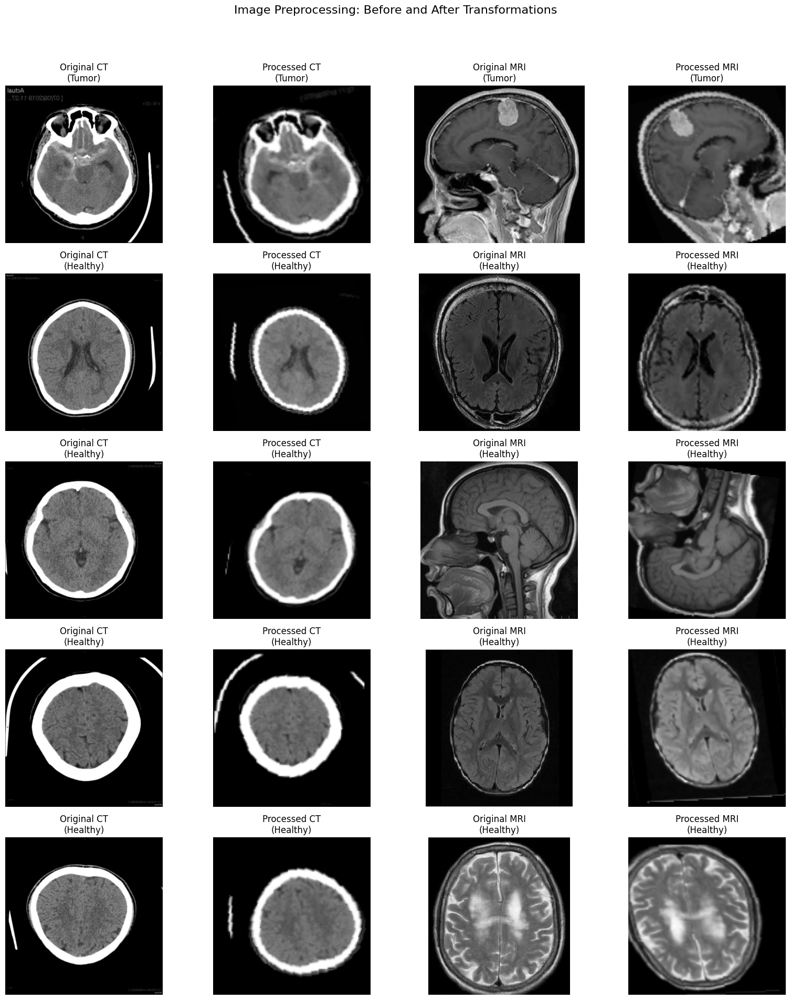

In [ ]:
# @title
import matplotlib.pyplot as plt
import numpy as np
import random
import cv2
import torch

def visualize_preprocessing(dataset, num_samples=3):
    """
    Visualizes original and preprocessed images from a paired dataset.

    Args:
        dataset (Dataset): The paired dataset (e.g., PairedBrainTumorDataset).
        num_samples (int): The number of samples to visualize.
    """
    print(f"Visualizing {num_samples} sample image pairs before and after preprocessing...")

    # Select random indices
    sample_indices = random.sample(range(len(dataset)), min(num_samples, len(dataset)))

    fig, axes = plt.subplots(num_samples, 4, figsize=(16, num_samples * 4))
    fig.suptitle("Image Preprocessing: Before and After Transformations", fontsize=16)

    for i, idx in enumerate(sample_indices):
        # Get the original image paths and label from the dataframe
        # Access the dataframe directly from the dataset object
        original_ct_path = dataset.dataframe.iloc[idx, dataset.dataframe.columns.get_loc('ct_image_path')]
        original_mri_path = dataset.dataframe.iloc[idx, dataset.dataframe.columns.get_loc('mri_image_path')]
        true_label = dataset.dataframe.iloc[idx, dataset.dataframe.columns.get_loc('category_encoded')]
        true_label_name = categories[true_label] # Assuming 'categories' list is defined

        # Load original images using cv2 for display before transformations
        original_ct_img = cv2.imread(original_ct_path, cv2.IMREAD_GRAYSCALE)
        original_mri_img = cv2.imread(original_mri_path, cv2.IMREAD_GRAYSCALE)

        # Get the preprocessed images from the dataset
        # The __getitem__ method applies the transform
        # FIX: Unpack all 4 values returned by __getitem__
        original_idx_returned, processed_ct_tensor, processed_mri_tensor, processed_label = dataset[idx]

        # Handle cases where original image loading failed
        if original_ct_img is None:
            print(f"Warning: Could not load original CT image at {original_ct_path}")
            original_ct_img_display = np.zeros((128, 128), dtype=np.uint8) # Placeholder
        else:
             # Resize original for consistent display size if needed, but keep aspect ratio ideally
             # For simple display, just show the loaded image
             original_ct_img_display = original_ct_img

        if original_mri_img is None:
             print(f"Warning: Could not load original MRI image at {original_mri_path}")
             original_mri_img_display = np.zeros((128, 128), dtype=np.uint8) # Placeholder
        else:
             original_mri_img_display = original_mri_img


        # Convert processed tensors back to numpy for display (squeeze channel dim)
        # Ensure tensors are on CPU before converting to numpy
        processed_ct_img_display = processed_ct_tensor.squeeze(0).cpu().numpy()
        processed_mri_img_display = processed_mri_tensor.squeeze(0).cpu().numpy()


        # Display Original CT
        axes[i, 0].imshow(original_ct_img_display, cmap='gray')
        axes[i, 0].set_title(f"Original CT\n({true_label_name})")
        axes[i, 0].axis('off')

        # Display Processed CT
        axes[i, 1].imshow(processed_ct_img_display, cmap='gray')
        axes[i, 1].set_title(f"Processed CT\n({true_label_name})")
        axes[i, 1].axis('off')

        # Display Original MRI
        axes[i, 2].imshow(original_mri_img_display, cmap='gray')
        axes[i, 2].set_title(f"Original MRI\n({true_label_name})")
        axes[i, 2].axis('off')

        # Display Processed MRI
        axes[i, 3].imshow(processed_mri_img_display, cmap='gray')
        axes[i, 3].set_title(f"Processed MRI\n({true_label_name})")
        axes[i, 3].axis('off')

    plt.tight_layout(rect=[0, 0.03, 1, 0.95]) # Adjust layout to prevent title overlap
    plt.show()

# Visualize preprocessing for the training dataset
# Assuming train_paired_dataset is defined in a previous cell (e.g., 437b9f5c)
if 'train_paired_dataset' in locals() and train_paired_dataset is not None:
    visualize_preprocessing(train_paired_dataset, num_samples=5) # Visualize 5 samples
else:
    print("Error: train_paired_dataset is not defined. Cannot visualize preprocessing.")

Create DataLoaders for the training, validation, and testing datasets. DataLoaders provide an iterable over the dataset, allowing for efficient batch processing during training and evaluation.

Define the `LightweightDualCrossModalTransformer` model architecture. This model incorporates CNN encoders, self-attention, and dual cross-attention mechanisms to process and fuse features from paired CT and MRI images for classification.

In [ ]:
# @title
import torch
import torch.nn as nn
import torch.optim as optim

# CNN Encoder
class CNNEncoder(nn.Module):
    def __init__(self, in_channels, embed_dim):
        super().__init__()
        self.conv = nn.Sequential(
            nn.Conv2d(in_channels, 32, 3, stride=2, padding=1),
            nn.ReLU(),
            nn.Conv2d(32, 64, 3, stride=2, padding=1),
            nn.ReLU(),
            nn.Conv2d(64, embed_dim, 3, stride=2, padding=1)
        )

    def forward(self, x):
        x = self.conv(x)
        x = x.flatten(2).transpose(1, 2)  # [B, N_patches, D]
        return x

# Cross-Attention Block returns (output_tensor, attention_weights)
class CrossAttentionBlock(nn.Module):
    def __init__(self, embed_dim, num_heads):
        super().__init__()

        self.cross_attn = nn.MultiheadAttention(embed_dim, num_heads, batch_first=True)
        self.ln1 = nn.LayerNorm(embed_dim)
        self.ln2 = nn.LayerNorm(embed_dim)
        self.ff = nn.Sequential(
            nn.Linear(embed_dim, embed_dim * 2),
            nn.ReLU(),
            nn.Dropout(0.2),
            nn.Linear(embed_dim * 2, embed_dim)
        )


    def forward(self, x, y):
        # x attends to y (query=x, key=y, value=y)
        # attn_out shape: [B, seq_len_query, embed_dim]
        # attn_weights shape: [B, seq_len_query, seq_len_key] ( average_attn_weights=True - default)
        attn_out, attn_weights = self.cross_attn(query=x, key=y, value=y, need_weights=True,average_attn_weights=False)
        print("Attention Weights Shape:", attn_weights.shape)
        assert attn_weights is not None

        # Add and Norm
        x = self.ln1(x + attn_out)

        # Feedforward and Norm
        ff_out = self.ff(x) # Apply FF to the output of the first Add & Norm
        x = self.ln2(x + ff_out) # Second Add & Norm (Residual connection)

        return x, attn_weights # Return output tensor and attention weights


# Lightweight Dual-Modal Model with Dual Cross-Attention (Modified to return embeddings and spatial fused features)
class LightweightDualCrossModalTransformer(nn.Module):
    def __init__(self, embed_dim=64, num_heads=2, num_classes=2):
        super().__init__()
        # CNN Encoders
        self.cnn_ct  = CNNEncoder(1, embed_dim)
        self.cnn_mri = CNNEncoder(1, embed_dim)

        # Self-Attention per modality (lightweight)
        self.self_attn_ct  = nn.TransformerEncoderLayer(embed_dim, num_heads, batch_first=True)
        self.self_attn_mri = nn.TransformerEncoderLayer(embed_dim, num_heads, batch_first=True)

        # Dual Cross-Attention
        self.cross_ct_to_mri = CrossAttentionBlock(embed_dim, num_heads)  # MRI attends to CT (query=MRI, key=CT)
        self.cross_mri_to_ct = CrossAttentionBlock(embed_dim, num_heads)  # CT attends to MRI (query=CT, key=MRI)


        # LayerNorms
        self.ln_ct  = nn.LayerNorm(embed_dim)
        self.ln_mri = nn.LayerNorm(embed_dim)


        # Classifier takes concatenated pooled features
        self.fc = nn.Sequential(
            nn.Linear(embed_dim*2, 64), # Input dimension is embed_dim * 2
            nn.ReLU(),
            nn.Dropout(0.3),
            nn.Linear(64, num_classes)
        )

    def forward(self, ct_img, mri_img):
        B = ct_img.size(0)

        # CNN embeddings (output shape: [B, N_patches, embed_dim])
        ct  = self.cnn_ct(ct_img)
        mri = self.cnn_mri(mri_img)

        # Self-attention
        ct  = self.self_attn_ct(ct)
        mri = self.self_attn_mri(mri)

        # Dual Cross-Attention
        ct_attended, ct_mri_attn_weights = self.cross_mri_to_ct(ct, mri)
        mri_attended, mri_ct_attn_weights = self.cross_ct_to_mri(mri, ct)
        print("CT-MRI Attention Weights Shape:", ct_mri_attn_weights.shape)
        print("MRI-CT Attention Weights Shape:", mri_ct_attn_weights.shape)

        # Apply LayerNorm after attention
        ct_attended = self.ln_ct(ct_attended)
        mri_attended = self.ln_mri(mri_attended)

        # --- Extract Spatial Fused Features BEFORE Pooling ---
        # Reshape attended features back to spatial dimensions
        # Assuming CNNEncoder output patches correspond to a 16x16 grid
        H_prime = W_prime = 16 # Spatial dimensions after last CNN layer
        embed_dim = ct_attended.size(-1) # Should be self.embed_dim

        # Reshape from [B, N_patches, embed_dim] to [B, embed_dim, H', W']
        ct_attended_spatial = ct_attended.transpose(1, 2).reshape(B, embed_dim, H_prime, W_prime)
        mri_attended_spatial = mri_attended.transpose(1, 2).reshape(B, embed_dim, H_prime, W_prime)

        # Concatenate spatial features from both modalities
        spatial_fused_features = torch.cat([ct_attended_spatial, mri_attended_spatial], dim=1) # Shape [B, 2*embed_dim, H', W']

        # Apply Global Average Pooling over the sequence dimension (for classifier input)
        ct_pooled = torch.mean(ct_attended, dim=1) # Shape [B, D]
        mri_pooled = torch.mean(mri_attended, dim=1) # Shape [B, D]

        # Concatenate pooled features (fused embeddings)
        fused_pooled = torch.cat([ct_pooled, mri_pooled], dim=1)

        logits = self.fc(fused_pooled)

        # Return logits, pooled fused embeddings, spatial fused features, and attention weights
        return logits, fused_pooled, spatial_fused_features, ct_mri_attn_weights, mri_ct_attn_weights

Train the `LightweightDualCrossModalTransformer` model using the defined training function and data loaders. This will train the model on the training data and evaluate its performance on the validation set during training, with early stopping to prevent overfitting. The trained model state is saved.

In [ ]:
# @title
import matplotlib.pyplot as plt

# Modify the train_model function to return the history
def train_model_with_history(model, train_loader, val_loader, num_epochs=20, lr=1e-4, weight_decay=0.0, device="cuda", patience=5):
    """
    Trains the model with early stopping and returns training history.

    Args:
        model: The PyTorch model to train.
        train_loader: DataLoader for the training data.
        val_loader: DataLoader for the validation data.
        num_epochs (int): Maximum number of training epochs.
        lr (float): Learning rate for the optimizer.
        weight_decay (float): Weight decay (L2 regularization) for the optimizer.
        device (str): Device to train on ('cpu' or 'cuda').
        patience (int): Number of epochs to wait for improvement before stopping.

    Returns:
        tuple: A tuple containing:
            - torch.nn.Module: The trained model.
            - dict: A dictionary containing training history ('train_loss', 'val_loss', 'train_acc', 'val_acc').
    """
    model = model.to(device)
    criterion = nn.CrossEntropyLoss()
    optimizer = optim.Adam(model.parameters(), lr=lr, weight_decay=weight_decay)

    best_val_loss = float('inf')
    epochs_no_improve = 0

    history = {
        'train_loss': [],
        'val_loss': [],
        'train_acc': [],
        'val_acc': []
    }

    for epoch in range(num_epochs):
        # Training Phase
        model.train()
        running_loss, correct, total = 0.0, 0, 0
        processed_samples_train = 0

        for original_indices, ct_img, mri_img, labels in train_loader: # Unpack original_indices
            valid_indices = labels != -1
            if not torch.any(valid_indices):
                continue

            ct_img = ct_img[valid_indices].to(device)
            mri_img = mri_img[valid_indices].to(device)
            labels = labels[valid_indices].to(device)

            if labels.size(0) == 0:
                continue

            optimizer.zero_grad()
            outputs = model(ct_img, mri_img)
            if isinstance(outputs, tuple):
                 logits = outputs[0]
            else:
                 logits = outputs

            if logits.ndim == 1:
                logits = logits.unsqueeze(0)
            if logits.size(-1) != 2:
                 if logits.numel() == labels.size(0) * 2:
                      logits = logits.view(labels.size(0), 2)
                 else:
                      print(f"Warning: Model output logits size {logits.size()} does not match expected num_classes (2).")


            loss = criterion(logits, labels)
            loss.backward()
            optimizer.step()

            running_loss += loss.item() * labels.size(0)
            _, preds = torch.max(logits, 1)
            correct += (preds == labels).sum().item()
            processed_samples_train += labels.size(0)


        train_loss = running_loss / processed_samples_train if processed_samples_train > 0 else 0.0
        train_acc = correct / processed_samples_train if processed_samples_train > 0 else 0.0

        # Validation
        model.eval()
        val_loss, correct, total = 0.0, 0, 0
        processed_samples_val = 0
        with torch.no_grad():
            for original_indices, ct_img, mri_img, labels in val_loader: # Unpack original_indices
                valid_indices = labels != -1
                if not torch.any(valid_indices):
                    continue

                ct_img = ct_img[valid_indices].to(device)
                mri_img = mri_img[valid_indices].to(device)
                labels = labels[valid_indices].to(device)

                if labels.size(0) == 0:
                    continue

                outputs = model(ct_img, mri_img)
                if isinstance(outputs, tuple):
                     logits = outputs[0]
                else:
                     logits = outputs

                if logits.ndim == 1:
                    logits = logits.unsqueeze(0)
                if logits.size(-1) != 2:
                     if logits.numel() == labels.size(0) * 2:
                          logits = logits.view(labels.size(0), 2)
                     else:
                          print(f"Warning: Model output logits size {logits.size()} does not match expected num_classes (2) during validation.")
                          pass


                loss = criterion(logits, labels)

                val_loss += loss.item() * labels.size(0)
                _, preds = torch.max(logits, 1)
                correct += (preds == labels).sum().item()
                processed_samples_val += labels.size(0)


        val_loss /= processed_samples_val if processed_samples_val > 0 else 0.0
        val_acc = correct / processed_samples_val if processed_samples_val > 0 else 0.0

        history['train_loss'].append(train_loss)
        history['val_loss'].append(val_loss)
        history['train_acc'].append(train_acc)
        history['val_acc'].append(val_acc)


        print(f"Epoch {epoch+1}/{num_epochs} | "
              f"Train Loss: {train_loss:.4f}, Train Acc: {train_acc:.4f} | "
              f"Val Loss: {val_loss:.4f}, Val Acc: {val_acc:.4f}")

        if not isinstance(val_loss, (int, float)) or not torch.isfinite(torch.tensor(val_loss)):
             print(f"Warning: Invalid validation loss ({val_loss}) at epoch {epoch+1}. Skipping early stopping check.")
             continue

        if val_loss < best_val_loss:
            best_val_loss = val_loss
            epochs_no_improve = 0
            torch.save(model.state_dict(), 'best_model.pth')
        else:
            epochs_no_improve += 1
            if epochs_no_improve == patience:
                print(f"Early stopping after {epoch+1} epochs due to no improvement in validation loss.")
                break

    return model, history

def plot_training_history(train_losses, val_losses, train_accs, val_accs):
    """
    Plots the training and validation loss and accuracy over epochs.

    Args:
        train_losses (list): List of training losses per epoch.
        val_losses (list): List of validation losses per epoch.
        train_accs (list): List of training accuracies per epoch.
        val_accs (list): List of validation accuracies per epoch.
    """
    epochs = range(1, len(train_losses) + 1)

    plt.figure(figsize=(12, 5))

    # Plot Loss
    plt.subplot(1, 2, 1)
    plt.plot(epochs, train_losses, label='Training Loss')
    plt.plot(epochs, val_losses, label='Validation Loss')
    plt.title('Training and Validation Loss')
    plt.xlabel('Epochs')
    plt.ylabel('Loss')
    plt.legend()
    plt.grid(True)

    # Plot Accuracy
    plt.subplot(1, 2, 2)
    plt.plot(epochs, train_accs, label='Training Accuracy')
    plt.plot(epochs, val_accs, label='Validation Accuracy')
    plt.title('Training and Validation Accuracy')
    plt.xlabel('Epochs')
    plt.ylabel('Accuracy')
    plt.legend()
    plt.grid(True)

    plt.tight_layout()
    plt.show()

Define functions for training and evaluating the model. The `train_model` function will handle the training loop, including forward and backward passes, optimization, and loss calculation. It also includes early stopping based on validation loss.

In [ ]:
# @title
# Re-create DataLoaders for paired datasets (from cell 437b9f5c)
from torch.utils.data import DataLoader
import torch
import torch.nn as nn
import torch.optim as optim
import matplotlib.pyplot as plt
import pandas as pd
import os # Import os for file existence checks
import numpy as np # Import numpy


# Assuming PairedBrainTumorDataset class is defined in cell 7cc01600
# Assuming train_paired_df, valid_paired_df, test_paired_df, and transform are defined in previous cells

# Create DataLoaders for paired datasets
batch_size = 16 # Assuming a batch size of 16, you can adjust this as needed.


# Check if datasets are defined before creating DataLoaders
if 'train_paired_df' in globals() and train_paired_df is not None and \
   'valid_paired_df' in globals() and valid_paired_df is not None and \
   'test_paired_df' in globals() and test_paired_df is not None and \
   'PairedBrainTumorDataset' in globals() and 'transform' in globals(): # Ensure dependencies are present
    print("Re-creating paired datasets and DataLoaders...")

    # Re-create datasets to ensure they use the updated PairedBrainTumorDataset class
    train_paired_dataset = PairedBrainTumorDataset(train_paired_df, transform=transform)
    valid_paired_dataset = PairedBrainTumorDataset(valid_paired_df, transform=transform)
    test_paired_dataset = PairedBrainTumorDataset(test_paired_df, transform=transform)


    train_paired_loader = DataLoader(train_paired_dataset, batch_size=batch_size, shuffle=True, num_workers=2)
    valid_paired_loader = DataLoader(valid_paired_dataset, batch_size=batch_size, shuffle=False, num_workers=2)
    test_paired_loader = DataLoader(test_paired_dataset, batch_size=batch_size, shuffle=False, num_workers=2)

    print("Paired DataLoaders created:")
    print("Train batches:", len(train_paired_loader))
    print("Validation batches:", len(valid_paired_loader))
    print("Test batches:", len(test_paired_loader))
else:
    print("Error: Necessary dataframes, Dataset class, or transform not defined. Cannot create DataLoaders.")

Re-creating paired datasets and DataLoaders...
Paired DataLoaders created:
Train batches: 107
Validation batches: 23
Test batches: 23


Instatiate and train the model and capture the plotted graph accuracy and loss

Streaming output truncated to the last 5000 lines.
Attention Weights Shape: torch.Size([16, 2, 256, 256])
CT-MRI Attention Weights Shape: torch.Size([16, 2, 256, 256])
MRI-CT Attention Weights Shape: torch.Size([16, 2, 256, 256])
Attention Weights Shape: torch.Size([16, 2, 256, 256])
Attention Weights Shape: torch.Size([16, 2, 256, 256])
CT-MRI Attention Weights Shape: torch.Size([16, 2, 256, 256])
MRI-CT Attention Weights Shape: torch.Size([16, 2, 256, 256])
Attention Weights Shape: torch.Size([16, 2, 256, 256])
Attention Weights Shape: torch.Size([16, 2, 256, 256])
CT-MRI Attention Weights Shape: torch.Size([16, 2, 256, 256])
MRI-CT Attention Weights Shape: torch.Size([16, 2, 256, 256])
Attention Weights Shape: torch.Size([16, 2, 256, 256])
Attention Weights Shape: torch.Size([16, 2, 256, 256])
CT-MRI Attention Weights Shape: torch.Size([16, 2, 256, 256])
MRI-CT Attention Weights Shape: torch.Size([16, 2, 256, 256])
Attention Weights Shape: torch.Size([16, 2, 256, 256])
Attention Wei

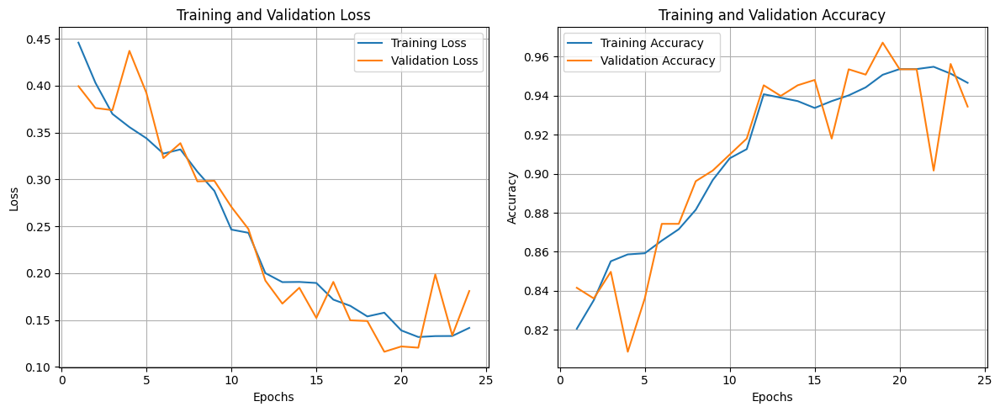

In [ ]:
# @title
import torch
import torch.nn as nn
import torch.optim as optim

# Define the device
device = "cuda" if torch.cuda.is_available() else "cpu"
print(f"Using device: {device}")

# Instantiate the model
model = LightweightDualCrossModalTransformer(embed_dim=32, num_heads=2, num_classes=2).to(device)

# Train the model
print("Starting training...")

trained_model,history = train_model_with_history(
    model,
    train_paired_loader,
    valid_paired_loader,
    num_epochs=30,
    lr=1e-4,
    weight_decay=1e-4,
    device=device,
    patience=5
)
print("Training finished.")

# Save the final state of the trained model
torch.save(trained_model.state_dict(), 'Initial_model_final_state.pth')
print("Initial trained model state saved to 'Initial_model_final_state.pth'")

# Evaluate the trained model
#print("\nEvaluating the trained model on the test set...")
#test_accuracy = evaluate_model(trained_model, test_paired_loader, device=device)
#print(f"\nTest Accuracy: {test_accuracy:.4f}")

#Plot the graph
plot_training_history(history['train_loss'], history['val_loss'], history['train_acc'], history['val_acc'])

Code block to load the saved baseline model

In [ ]:
# @title
import torch
import torch.nn as nn

# Assuming the LightweightDualCrossModalTransformer class is defined
# (e.g., in a previous cell like 95cfc0d4)
# If not, you might need to define or import it first.

# Define the model parameters based on how it was trained
# (These should match the parameters used when saving the model in cell tx9E-5o-tPDn)
model_params = {
    'embed_dim': 32,
    'num_heads': 2,
    'num_classes': 2
}

# Define the device
device = "cuda" if torch.cuda.is_available() else "cpu"
print(f"Using device: {device}")

# Instantiate the model
loaded_model = LightweightDualCrossModalTransformer(**model_params).to(device)

# Define the path to the saved model state dictionary
model_path = 'Initial_model_final_state.pth'

# Load the saved state dictionary
try:
    loaded_model.load_state_dict(torch.load(model_path, map_location=device))
    print(f"Successfully loaded model state from '{model_path}'")

    # Set the model to evaluation mode
    loaded_model.eval()
    print("Model set to evaluation mode.")

except FileNotFoundError:
    print(f"Error: Model file not found at '{model_path}'")
except Exception as e:
    print(f"An error occurred while loading the model: {e}")

Using device: cuda
Successfully loaded model state from 'Initial_model_final_state.pth'
Model set to evaluation mode.


**Select sample images for visualization and feature analysis (IMPORTANT**)

In [ ]:
# @title
# Select sample paired images for visualization directly from the test_paired_loader
# Ensure test_paired_loader, trained_model, and categories are available

import torch
import random # Import random for shuffling
import cv2
import numpy as np

def select_sample_images_for_visualization(test_paired_loader, trained_model, categories, dataframe, num_samples_to_select=8, device="cuda"):
    """
    Selects sample paired images from a DataLoader and collects their paths,
    true labels, predicted labels, and attention weights.

    Args:
        test_paired_loader (DataLoader): DataLoader for the test data.
        trained_model: The trained PyTorch model.
        categories (list): List of category names.
        dataframe (pandas.DataFrame): The original DataFrame used to create the dataset.
        num_samples_to_select (int): The number of samples to select.
        device (str): Device to perform inference on ('cpu' or 'cuda').

    Returns:
        list: A list of dictionaries, where each dictionary contains:
            - 'original_idx': Original index from the dataframe
            - 'ct_path': CT image path
            - 'mri_path': MRI image path
            - 'true_label': True label (encoded)
            - 'predicted_label': Predicted label (encoded)
            - 'ct_mri_attention': Attention weights from CT attending to MRI
            - 'mri_ct_attention': Attention weights from MRI attending to CT
    """
    sample_details_viz = []

    processed_count = 0
    trained_model.to(device)
    trained_model.eval()

    print(f"Selecting up to {num_samples_to_select} samples from test_paired_loader for visualization and collecting attention weights...")

    with torch.no_grad():
        for original_indices, ct_img_tensor, mri_img_tensor, labels in test_paired_loader:
            valid_indices_batch = labels != -1
            if not torch.any(valid_indices_batch):
                continue

            # Filter tensors and labels based on valid indices
            valid_original_indices = original_indices[valid_indices_batch]
            valid_ct_img_tensor = ct_img_tensor[valid_indices_batch].to(device)
            valid_mri_img_tensor = mri_img_tensor[valid_indices_batch].to(device)
            valid_labels = labels[valid_indices_batch].to(device)

            if valid_labels.size(0) == 0:
                continue

            # Limit processing to num_samples_to_select
            remaining_to_process = num_samples_to_select - processed_count
            if valid_labels.size(0) > remaining_to_process:
                valid_original_indices = valid_original_indices[:remaining_to_process]
                valid_ct_img_tensor = valid_ct_img_tensor[:remaining_to_process]
                valid_mri_img_tensor = valid_mri_img_tensor[:remaining_to_process]
                valid_labels = valid_labels[:remaining_to_process]

            if valid_labels.size(0) == 0:
                 break # No more samples to process in this batch


            # Get prediction and attention weights from the model for the batch
            # The model now returns a tuple: (logits, fused_pooled, spatial_fused_features, ct_mri_attn_weights, mri_ct_attn_weights)
            outputs = trained_model(valid_ct_img_tensor, valid_mri_img_tensor)

            logits = outputs[0]
            ct_mri_attn_weights_batch = outputs[3] # CT attends to MRI
            mri_ct_attn_weights_batch = outputs[4] # MRI attends to CT


            _, predicted_classes = torch.max(logits, 1)


            # Append data for each sample in the current batch
            for i in range(valid_labels.size(0)):
                original_idx = valid_original_indices[i].item()
                true_label = valid_labels[i].item()
                predicted_label = predicted_classes[i].item()

                # Need to get original image paths from the dataframe using original_idx
                try:
                    row = dataframe.loc[original_idx]
                    ct_path = row['ct_image_path']
                    mri_path = row['mri_image_path']

                    sample_details_viz.append({
                        'original_idx': original_idx,
                        'ct_path': ct_path,
                        'mri_path': mri_path,
                        'true_label': true_label,
                        'predicted_label': predicted_label,
                        # Extract attention weights for the current sample (batch size 1)
                        'ct_mri_attention': ct_mri_attn_weights_batch[i].unsqueeze(0) if ct_mri_attn_weights_batch is not None else None, # Keep batch dim for consistency with visualization funcs
                        'mri_ct_attention': mri_ct_attn_weights_batch[i].unsqueeze(0) if mri_ct_attn_weights_batch is not None else None, # Keep batch dim for consistency with visualization funcs
                    })

                except KeyError:
                    print(f"Warning: Original index {original_idx} not found in dataframe. Skipping sample.")
                    continue # Skip this sample if original index not found
                except Exception as e:
                    print(f"Error processing sample at index {original_idx}: {e}")
                    continue # Skip sample on other errors


            processed_count += valid_labels.size(0)
            if processed_count >= num_samples_to_select:
                break # Stop once enough samples are collected


    print(f"Finished selecting {len(sample_details_viz)} samples for visualization.")

    return sample_details_viz


# Call the modified function to get the sample data and attention weights
if 'test_paired_loader' in globals() and test_paired_loader is not None and \
   'trained_model' in globals() and trained_model is not None and \
   'categories' in globals() and 'test_paired_df' in globals() and test_paired_df is not None: # Ensure all dependencies are available

    # Store the results in a variable that can be accessed later for visualization
    sample_results = select_sample_images_for_visualization(
        test_paired_loader,
        trained_model,
        categories,
        test_paired_df, # Pass the dataframe
        num_samples_to_select=20, # You can adjust the number of samples here
        device="cuda" if torch.cuda.is_available() else "cpu"
    )

    print("\nSelected Sample Details (with Attention Weights) for Visualization:")
    print("-" * 80)
    for i, sample in enumerate(sample_results):
        print(f"Sample {i}:")
        print(f"  Original Index: {sample['original_idx']}")
        print(f"  CT Path: {sample['ct_path']}")
        print(f"  MRI Path: {sample['mri_path']}")
        print(f"  True Label: {sample['true_label']} ({categories[sample['true_label']]})")
        print(f"  Predicted Label: {sample['predicted_label']} ({categories[sample['predicted_label']]})")
        print(f"  CT->MRI Attention Shape: {sample['ct_mri_attention'].shape if sample['ct_mri_attention'] is not None else 'None'}")
        print(f"  MRI->CT Attention Shape: {sample['mri_ct_attention'].shape if sample['mri_ct_attention'] is not None else 'None'}")
        print("-" * 20)

else:
    print("Error: Required variables (test_paired_loader, trained_model, categories, test_paired_df) are not available.")

Selecting up to 20 samples from test_paired_loader for visualization and collecting attention weights...
Attention Weights Shape: torch.Size([16, 2, 256, 256])
Attention Weights Shape: torch.Size([16, 2, 256, 256])
CT-MRI Attention Weights Shape: torch.Size([16, 2, 256, 256])
MRI-CT Attention Weights Shape: torch.Size([16, 2, 256, 256])
Attention Weights Shape: torch.Size([4, 2, 256, 256])
Attention Weights Shape: torch.Size([4, 2, 256, 256])
CT-MRI Attention Weights Shape: torch.Size([4, 2, 256, 256])
MRI-CT Attention Weights Shape: torch.Size([4, 2, 256, 256])
Finished selecting 20 samples for visualization.

Selected Sample Details (with Attention Weights) for Visualization:
--------------------------------------------------------------------------------
Sample 0:
  Original Index: 2286
  CT Path: /content/Dataset/Brain Tumor CT scan Images/Tumor/ct_tumor (531).jpg
  MRI Path: /content/Dataset/Brain Tumor MRI images/Tumor/tumor (531).jpg
  True Label: 1 (Tumor)
  Predicted Label: 1 

Function to load and process the image

In [ ]:
# @title
# defines the load_and_preprocess_image function


import cv2
import torch
from torchvision import transforms

def load_and_preprocess_image(image_path, img_size=(128, 128)):
    """
    Loads and preprocesses a single image.
    Args: image_path (str), img_size (tuple): Desired output image size (width, height).
    Returns:torch.Tensor: Preprocessed image tensor, or None
    """
    image = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)

    if image is None:
        print(f"Warning: Could not load image at {image_path}")
        return None

    # Resize the image
    image = cv2.resize(image, img_size)

    # Convert to tensor and normalize
    image_tensor = torch.from_numpy(image).unsqueeze(0).float() / 255.0 # Add channel dimension and normalize
    return image_tensor

import torch



Function that gives the predicted labels for all the samples in the testpairedloader

In [ ]:
# @title
import torch
import numpy as np
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, confusion_matrix # Import necessary metrics


# Helper function to predict labels from a model
def predict_labels(model):
    """
    Predicts labels for the test set using the given model and test_paired_loader.

    Args:
        model: The trained PyTorch model.

    Returns:
        tuple: A tuple containing:
            - list: All true labels from the test set.
            - list: All predicted labels for the test set.
            - list: All raw model output logits for the test set.
    """
    # Ensure test_paired_loader is available in the global scope
    if 'test_paired_loader' not in globals() or test_paired_loader is None:
        print("Error: test_paired_loader is not available. Cannot predict labels.")
        return [], [], [] # Return empty lists if loader is not available

    # Ensure the model is on the correct device and in evaluation mode
    device = next(model.parameters()).device # Get model's current device
    model.eval()

    all_true_labels = []
    all_predicted_labels = []
    all_logits = []

    print("Predicting labels for the test set...")

    with torch.no_grad():
        # Iterate through the test_paired_loader
        # Assuming the DataLoader yields (original_indices, ct_img, mri_img, labels)
        for original_indices, ct_img, mri_img, labels in test_paired_loader:
            # Filter out samples with label -1 (invalid pairs)
            valid_indices = labels != -1
            if not torch.any(valid_indices):
                continue # Skip batch if no valid samples

            # Select only valid samples from the batch and move to device
            ct_img = ct_img[valid_indices].to(device)
            mri_img = mri_img[valid_indices].to(device)
            valid_labels = labels[valid_indices].to(device) # Use valid_labels

            # Skip if no valid samples remain after filtering
            if valid_labels.size(0) == 0:
                continue

            # Perform forward pass
            # Assuming the model's forward pass returns logits as the first element
            model_output = model(ct_img, mri_img)
            if isinstance(model_output, tuple):
                logits = model_output[0] # Extract logits if model returns a tuple
            else:
                logits = model_output # Use output directly if it's just logits

            # Get predicted class (index of the max logit)
            _, predicted_classes = torch.max(logits, 1)

            # Append true labels, predicted labels, and logits to lists
            all_true_labels.extend(valid_labels.cpu().numpy()) # Use valid_labels
            all_predicted_labels.extend(predicted_classes.cpu().numpy())
            all_logits.extend(logits.cpu().numpy())


    print(f"Finished predicting labels for {len(all_true_labels)} samples.")

    return all_true_labels, all_predicted_labels, all_logits



Function to load and process the image, predict the result for image pair with no attention

In [ ]:
# @title
# Re-run the cell that defines the load_and_preprocess_image function (cell az4LU9rVuNlJ)
# This cell also defines the predict_image_pair function.
# Re-executing the relevant cell will make the function definitions available.

import cv2
import torch
from torchvision import transforms

def load_and_preprocess_image(image_path, img_size=(128, 128)):
    """
    Loads and preprocesses a single image.
    Args: image_path (str), img_size (tuple): Desired output image size (width, height).
    Returns:torch.Tensor: Preprocessed image tensor, or None
    """
    image = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)

    if image is None:
        print(f"Warning: Could not load image at {image_path}")
        return None

    # Resize the image
    image = cv2.resize(image, img_size)

    # Convert to tensor and normalize
    image_tensor = torch.from_numpy(image).unsqueeze(0).float() / 255.0 # Add channel dimension and normalize
    return image_tensor

import torch

def predict_image_pair(model, ct_image_path, mri_image_path, device="cpu"):
    """
    Predicts the label for a given CT and MRI image pair.

    Args:
        model: The trained PyTorch model.
        ct_image_path (str): Path to the CT image.
        mri_image_path (str): Path to the MRI image.
        device (str): Device to perform inference on ('cpu' or 'cuda').

    Returns: images

    """
    ct_image = load_and_preprocess_image(ct_image_path)
    mri_image = load_and_preprocess_image(mri_image_path)

    if ct_image is None or mri_image is None:
        return None  # Indicate error loading images

    # Add batch dimension and move to device
    ct_image = ct_image.unsqueeze(0).to(device)
    mri_image = mri_image.unsqueeze(0).to(device)
    return ct_image, mri_image

**Function to predict the image pair result and generate attentions for the samples - Required for visualizations of attentionn maps and grad-CAM**

In [ ]:
# @title
import cv2
import torch
from torchvision import transforms
import pandas as pd # Import pandas to use DataFrames

def load_and_preprocess_image(image_path, img_size=(128, 128)):
    """
    Loads and preprocesses a single image.
    Args: image_path (str), img_size (tuple): Desired output image size (width, height).
    Returns:torch.Tensor: Preprocessed image tensor, or None
    """
    image = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)

    if image is None:
        print(f"Warning: Could not load image at {image_path}")
        return None

    # Resize the image
    image = cv2.resize(image, img_size)

    # Convert to tensor and normalize
    image_tensor = torch.from_numpy(image).unsqueeze(0).float() / 255.0 # Add channel dimension and normalize
    return image_tensor

import torch

def predict_image_pair_with_attention(model, dataframe, ct_image_path, mri_image_path,device="cpu"):
    """
    Predicts the label and returns attention weights and true label for a given CT and MRI image pair.

    Args:
        model: The trained PyTorch model.
        dataframe (pandas.DataFrame): DataFrame containing 'ct_image_path', 'mri_image_path', and 'category_encoded'.
        ct_image_path (str): Path to the CT image.
        mri_image_path (str): Path to the MRI image.
        device (str): Device to perform inference on ('cpu' or 'cuda').

    Returns:
        tuple: - int: The predicted class label (0 for Healthy, 1 for Tumor),
               - torch.Tensor: Attention weights from CT attending to MRI (shape [batch_size, num_heads, seq_len_ct, seq_len_mri]),
               - torch.Tensor: Attention weights from MRI attending to CT (shape [batch_size, num_heads, seq_len_mri, seq_len_ct]),
               - int: The true label (0 for Healthy, 1 for Tumor),
               or None, None, None, None if image loading or true label lookup fails.
    """
    ct_image = load_and_preprocess_image(ct_image_path)
    mri_image = load_and_preprocess_image(mri_image_path)

    if ct_image is None or mri_image is None:
        return None, None, None, None  # Indicate error loading images


    try:
        # Find the row that matches both paths. Using boolean indexing for robustness.
        matching_row = dataframe[(dataframe['ct_image_path'] == ct_image_path) & (dataframe['mri_image_path'] == mri_image_path)]
        if matching_row.empty:
             print(f"Warning: Could not find true label for pair CT='{ct_image_path}', MRI='{mri_image_path}' in the dataframe.")
             true_label = -1 # Indicate true label not found
        else:
             true_label = matching_row.iloc[0]['category_encoded']
    except Exception as e:
        print(f"Error looking up true label for pair CT='{ct_image_path}', MRI='{mri_image_path}': {e}")
        true_label = -1 # Indicate error

    # Add batch dimension and move to device
    ct_image = ct_image.unsqueeze(0).to(device)
    mri_image = mri_image.unsqueeze(0).to(device)

    model.eval()
    with torch.no_grad():
        model_output = model(ct_image, mri_image) # Model forward pass

        # The model LightweightDualCrossModalTransformer returns a tuple: (logits, fused_pooled, spatial_fused_features, ct_mri_attn_weights, mri_ct_attn_weights)
        # Need to extract these correctly.

        logits = None
        ct_mri_attn_weights = None
        mri_ct_attn_weights = None

        if isinstance(model_output, tuple):
            if len(model_output) >= 4: # Expect at least 4 outputs
                 logits = model_output[0]
                 ct_mri_attn_weights = model_output[3] # CT attends to MRI (extracted from 4th position)
                 mri_ct_attn_weights = model_output[4] # MRI attends to CT (extracted from 5th position)
            elif len(model_output) == 2 and torch.is_tensor(model_output[0]) and torch.is_tensor(model_output[1]):
                 # This might be a case where only logits and fused features are returned
                 logits = model_output[0]
                 # Attention weights are None in this case
            else:
                 print(f"Warning: Unexpected model output tuple format from model: length: {len(model_output)}")
                 return None, None, None, true_label # Return None for predictions and attention, but include true label if found

        elif isinstance(model_output, torch.Tensor) and model_output.ndim == 2 and model_output.size(1) == 2:
             # Handle case where model only returns logits
             logits = model_output
             # Attention weights are None in this case
        else:
             print(f"Warning: Unexpected model output format from model: {type(model_output)}, shape: {model_output.shape if torch.is_tensor(model_output) else 'N/A'}")
             return None, None, None, true_label # Return None for predictions and attention, but include true label if found


        predicted_class = None
        if logits is not None and logits.ndim == 2 and logits.size(1) == 2:
            _, predicted_class_tensor = torch.max(logits, 1)
            predicted_class = predicted_class_tensor.item()
        elif logits is not None and logits.ndim == 1 and logits.size(0) == 2:
             _, predicted_class_tensor = torch.max(logits.unsqueeze(0), 1) # Add batch dim for max
             predicted_class = predicted_class_tensor.item()
        else:
             print(f"Warning: Unexpected logits shape: {logits.shape if torch.is_tensor(logits) else 'N/A'}. Cannot determine predicted class.")
             predicted_class = None # Indicate prediction failure


        # Ensure attention weights are tensors with batch dimension
        ct_mri_attn_weights = ct_mri_attn_weights if torch.is_tensor(ct_mri_attn_weights) and ct_mri_attn_weights.size(0) == 1 else None
        mri_ct_attn_weights = mri_ct_attn_weights if torch.is_tensor(mri_ct_attn_weights) and mri_ct_attn_weights.size(0) == 1 else None


        return predicted_class, ct_mri_attn_weights, mri_ct_attn_weights, true_label

In [ ]:
# @title
# Call predict_image_pair_with_attention for two sample pairs and display details

if 'sample_results' in globals() and sample_results:
    print("Displaying details for the first two sample image pairs from sample_results:")
    num_samples_to_display = min(2, len(sample_results)) # Display details for up to 2 samples

    for i in range(num_samples_to_display):
        result = sample_results[i]
        ct_path = result['ct_path']
        mri_path = result['mri_path']
        true_label = result['true_label']
        predicted_label = result['predicted_label']
        ct_mri_attn = result['ct_mri_attention']
        mri_ct_attn = result['mri_ct_attention']

        if predicted_label is not None:
            predicted_label_name = categories[predicted_label]
        else:
            predicted_label_name = "N/A (Image Load Error)"

        print(f"\n--- Sample {i+1} ---")
        print(f"  CT Path: {ct_path}")
        print(f"  MRI Path: {mri_path}")
        print(f"  True Label: {categories[true_label]}")
        print(f"  Predicted Label: {predicted_label_name}")

        print("  CT Attending to MRI Attention Weights Shape:", ct_mri_attn.shape if ct_mri_attn is not None else 'None')
        print("  MRI Attending to CT Attention Weights Shape:", mri_ct_attn.shape if mri_ct_attn is not None else 'None')

        # Optional: Print some values from the attention weights (e.g., mean, max)
        if ct_mri_attn is not None and torch.is_tensor(ct_mri_attn):
             print(f"    CT->MRI Attn Stats (Mean, Max, Min): {torch.mean(ct_mri_attn).item():.6f}, {torch.max(ct_mri_attn).item():.6f}, {torch.min(ct_mri_attn).item():.6f}")
        if mri_ct_attn is not None and torch.is_tensor(mri_ct_attn):
             print(f"    MRI->CT Attn Stats (Mean, Max, Min): {torch.mean(mri_ct_attn).item():.6f}, {torch.max(mri_ct_attn).item():.6f}, {torch.min(mri_ct_attn).item():.6f}")


else:
    print("Sample results ('sample_results') not available. Please run the previous cells to generate predictions and attention weights.")

Displaying details for the first two sample image pairs from sample_results:

--- Sample 1 ---
  CT Path: /content/Dataset/Brain Tumor CT scan Images/Tumor/ct_tumor (531).jpg
  MRI Path: /content/Dataset/Brain Tumor MRI images/Tumor/tumor (531).jpg
  True Label: Tumor
  Predicted Label: Tumor
  CT Attending to MRI Attention Weights Shape: torch.Size([1, 2, 256, 256])
  MRI Attending to CT Attention Weights Shape: torch.Size([1, 2, 256, 256])
    CT->MRI Attn Stats (Mean, Max, Min): 0.003906, 0.011619, 0.000149
    MRI->CT Attn Stats (Mean, Max, Min): 0.003906, 0.016613, 0.002239

--- Sample 2 ---
  CT Path: /content/Dataset/Brain Tumor CT scan Images/Healthy/ct_healthy (170).jpg
  MRI Path: /content/Dataset/Brain Tumor MRI images/Healthy/mri_healthy (170).jpg
  True Label: Healthy
  Predicted Label: Tumor
  CT Attending to MRI Attention Weights Shape: torch.Size([1, 2, 256, 256])
  MRI Attending to CT Attention Weights Shape: torch.Size([1, 2, 256, 256])
    CT->MRI Attn Stats (Mean, M

Function the defines visualizing attention maps and gradcam heatmaps

In [ ]:
# @title
# defines visualize_attention_map and visualize_gradcam_heatmap
#
import matplotlib.pyplot as plt
import numpy as np
import cv2
import torch

def visualize_attention_map(original_image_path, attention_weights, patch_size=16, img_size=(128, 128), title="Attention Map"):
    """
    Visualizes attention weights as a heatmap overlaid on the original image.
    Args: original_image_path (str):, attention_weights (torch.Tensor): Attention weights for a single image pair (shape [B, num_heads, seq_len_query, seq_len_key], [num_heads, seq_len_query, seq_len_key], or [B=1, seq_len_query, seq_len_key]),
           patch_size (int): Size of the square patches used in the CNN,
        img_size (tuple): Size of the input image (width, height), title (str):
    """
    print(f"--- Inside visualize_attention_map ---")
    print(f"Received attention_weights shape: {attention_weights.shape if attention_weights is not None else 'None'}")

    original_image = cv2.imread(original_image_path, cv2.IMREAD_GRAYSCALE)
    if original_image is None:
        print(f"Warning: Could not load image for visualization at {original_image_path}")
        return

    original_image = cv2.resize(original_image, img_size)
    original_image = cv2.cvtColor(original_image, cv2.COLOR_GRAY2RGB) # Convert to RGB for heatmap overlay

    # Process attention weights based on received shape
    if attention_weights is None:
         print("Error: Attention weights are None. Cannot visualize.")
         return

    if attention_weights.ndim == 4 and attention_weights.size(0) == 1:
        # Expected shape [B=1, num_heads, seq_len_query, seq_len_key] (from recent PyTorch)
        attention_weights_processed = attention_weights.squeeze(0) # Shape [num_heads, seq_len_query, seq_len_key]
        print(f"Shape after squeezing batch (ndim=4, size 0=1): {attention_weights_processed.shape}")
        # Average across heads
        attention = torch.mean(attention_weights_processed, dim=0) # Shape [seq_len_query, seq_len_key]
        print(f"Shape after averaging heads: {attention.shape}")

    elif attention_weights.ndim == 3:
        # Expected shape [num_heads, seq_len_query, seq_len_key] (without batch dim)
        attention_weights_processed = attention_weights
        print(f"Shape (ndim=3): {attention_weights_processed.shape}")
        # Average across heads
        attention = torch.mean(attention_weights_processed, dim=0) # Shape [seq_len_query, seq_len_key]
        print(f"Shape after averaging heads: {attention.shape}")

    elif attention_weights.ndim == 2 and attention_weights.shape == torch.Size([256, 256]):
        # Handling the unexpected shape [seq_len_query, seq_len_key] - this is the averaged attention
        # Assuming this represents single-headed attention weights or already averaged weights without batch dim
        print(f"Handling unexpected 2D shape [256, 256]. Assuming this is averaged attention.")
        attention = attention_weights # Use directly as it's already [seq_len_query, seq_len_key]
        print(f"Shape after processing unexpected 2D shape: {attention.shape}")
    elif attention_weights.ndim == 3 and attention_weights.size(0) == 1 and attention_weights.size(1) == attention_weights.size(2):
        # Handling the averaged attention shape with batch dim [B=1, seq_len_query, seq_len_key]
        print(f"Handling averaged attention shape with batch dim [B=1, seq_len_q, seq_len_k]. Shape: {attention_weights.shape}")
        attention = attention_weights.squeeze(0) # Remove batch dimension
        print(f"Shape after squeezing batch: {attention.shape}")


    else:
         print(f"Warning: Attention weights shape is not in a supported format for visualization ({attention_weights.shape}). Expected [B=1, num_heads, seq_len_q, seq_len_k], [num_heads, seq_len_q, seq_len_k], [B=1, seq_len_q, seq_len_k] or [seq_len_q, seq_len_k].")
         return

    # Now 'attention' should be in shape [seq_len_query, seq_len_key]

    # Average across query patches to get attention for each key patch
    # Assuming the query dimension is dim 0 and key dimension is dim 1
    # If we want to see which KEY patches are most attended to *by* the query patches,
    # we average across the query dimension (dim 0).
    # If we want to see which QUERY patches attend most *to* the key patches,
    # we average across the key dimension (dim 1).
    # Let's assume we want to see which regions in the KEY image are most attended to by the QUERY image.
    # This means we average across the QUERY dimension (dim 0).
    if attention.ndim == 2: # Should be [seq_len_query, seq_len_key]
        attention = torch.mean(attention, dim=0) # Shape [seq_len_key]
        print(f"Shape after averaging query patches: {attention.shape}")
    else:
        print(f"Error: Attention tensor does not have 2 dimensions after processing for averaging across queries. Shape: {attention.shape}")
        return


    num_patches = attention.shape[0]

    # Infer grid size from the number of patches (assuming a square grid)
    grid_size_actual = int(round(np.sqrt(num_patches)))
    print(f"Inferred grid size: {grid_size_actual}x{grid_size_actual}, Num patches: {num_patches}")
    if grid_size_actual * grid_size_actual != num_patches:
         print(f"Warning: Number of patches ({num_patches}) is not a perfect square ({grid_size_actual}x{grid_size_actual}). Cannot reshape attention for visualization.")
         # Fallback: try to use the closest square size if the difference is small
         closest_grid_size = round(np.sqrt(num_patches))
         if abs(closest_grid_size**2 - num_patches) <= 1: # Allow a small difference (e.g., 255 vs 256)
             grid_size_actual = closest_grid_size
             print(f"Attempting visualization with inferred grid size {grid_size_actual}x{grid_size_actual}.")
         else:
             return # Cannot proceed with visualization


    # Reshape the 1D attention values into a 2D grid matching the patch layout
    attention_grid = attention.reshape(grid_size_actual, grid_size_actual).cpu().detach().numpy()


    # Resize heatmap to match image size
    heatmap = cv2.resize(attention_grid, img_size)
    heatmap = np.uint8(255 * heatmap)
    heatmap = cv2.applyColorMap(heatmap, cv2.COLORMAP_JET)

    # Superimpose heatmap on original image
    superimposed_img = cv2.addWeighted(original_image, 0.6, heatmap, 0.4, 0)

    plt.figure(figsize=(6, 6))
    plt.imshow(superimposed_img)
    plt.title(title)
    plt.axis('off')
    plt.show()


def visualize_gradcam_heatmap(original_image_path, heatmap, img_size=(128, 128), title="Grad-CAM Heatmap"):
    """
    Visualizes Grad-CAM heatmap overlaid on the original image.
    Args: original_image_path (str):, heatmap (np.ndarray): Grad-CAM heatmap (shape [Batch=1, height, width] or [height, width]),
        img_size (tuple): Size the original image was resized to (width, height), title (str):
    """
    original_image = cv2.imread(original_image_path, cv2.IMREAD_GRAYSCALE)
    if original_image is None:
        print(f"Warning: Could not load image for visualization at {original_image_path}")
        return

    original_image = cv2.resize(original_image, img_size)
    original_image = cv2.cvtColor(original_image, cv2.COLOR_GRAY2RGB) # Convert to RGB for heatmap overlay

    # Ensure heatmap is 2D by squeezing the batch dimension if it exists
    if heatmap.ndim == 3 and heatmap.shape[0] == 1:
        heatmap_2d = heatmap.squeeze(0) # Remove the batch dimension
    elif heatmap.ndim == 2:
        heatmap_2d = heatmap # Heatmap is already 2D
    else:
        print(f"Warning: Grad-CAM heatmap is not 2D or 3D with batch size 1 (shape {heatmap.shape}). Cannot resize for visualization.")
        return


    # Resize the heatmap to the original image size (or the processed image size)
    heatmap_resized = cv2.resize(heatmap_2d, img_size)
    heatmap_resized = np.uint8(255 * heatmap_resized)
    heatmap_colored = cv2.applyColorMap(heatmap_resized, cv2.COLORMAP_JET)

    # Superimpose heatmap on original image
    superimposed_img = cv2.addWeighted(original_image, 0.6, heatmap_colored, 0.4, 0)

    plt.figure(figsize=(6, 6))
    plt.imshow(superimposed_img)
    plt.title(title)
    plt.axis('off')
    plt.show()

In [ ]:
# @title
# Visualize heatmaps for the first two samples in sample_results

if 'sample_results' in globals() and sample_results:
    print("Visualizing heatmaps for the first two sample image pairs...")
    num_samples_to_visualize = min(2, len(sample_results)) # Visualize up to 2 samples

    for i in range(num_samples_to_visualize):
        result = sample_results[i]
        ct_path = result['ct_path']
        mri_path = result['mri_path']
        ct_mri_attn = result['ct_mri_attention']
        mri_ct_attn = result['mri_ct_attention']
        ct_heatmap = result['ct_heatmap']
        mri_heatmap = result['mri_heatmap']
        true_label = result['true_label']
        predicted_label = result['predicted_label']

        if predicted_label is not None:
            predicted_label_name = categories[predicted_label]
        else:
            predicted_label_name = "N/A (Image Load Error)"


        print(f"\n--- Visualizing Sample {i+1}: True Label: {categories[true_label]}, Predicted Label: {predicted_label_name} ---")

        # Visualize CT Attending to MRI Heatmap (Overlay on MRI image)
        if ct_mri_attn is not None and torch.is_tensor(ct_mri_attn) and ct_mri_attn.ndim == 4 and ct_mri_attn.size(0) == 1:
            visualize_attention_heatmap(
                mri_path, # Overlay on MRI image
                ct_mri_attn,
                img_size=(128, 128),
                title=f"Sample {i+1} CT Attending to MRI Heatmap ({predicted_label_name})",
            )
        else:
            print(f"Skipping CT Attending to MRI Heatmap visualization for Sample {i+1} due to unexpected attention shape: {ct_mri_attn.shape if ct_mri_attn is not None and torch.is_tensor(ct_mri_attn) else 'None'}")


        # Visualize MRI Attending to CT Heatmap (Overlay on CT image)
        if mri_ct_attn is not None and torch.is_tensor(mri_ct_attn) and mri_ct_attn.ndim == 4 and mri_ct_attn.size(0) == 1:
            visualize_attention_heatmap(
                ct_path, # Overlay on CT image
                mri_ct_attn,
                img_size=(128, 128),
                title=f"Sample {i+1} MRI Attending to CT Heatmap ({predicted_label_name})",
            )
        else:
            print(f"Skipping MRI Attending to CT Heatmap visualization for Sample {i+1} due to unexpected attention shape: {mri_ct_attn.shape if mri_ct_attn is not None and torch.is_tensor(mri_ct_attn) else 'None'}")

        # Visualize CT Grad-CAM Heatmap
        if ct_heatmap is not None:
             visualize_gradcam_heatmap(
                 ct_path,
                 ct_heatmap[0] if ct_heatmap.ndim == 3 else ct_heatmap, # Ensure heatmap is 2D or 3D with batch=1
                 img_size=(128, 128),
                 title=f"Sample {i+1} CT Grad-CAM ({predicted_label_name})"
             )
        else:
             print(f"Could not visualize CT Grad-CAM heatmap for Sample {i+1}.")


        # Visualize MRI Grad-CAM Heatmap
        if mri_heatmap is not None:
             visualize_gradcam_heatmap(
                 mri_path,
                 mri_heatmap[0] if mri_heatmap.ndim == 3 else mri_heatmap, # Ensure heatmap is 2D or 3D with batch=1
                 img_size=(128, 128),
                 title=f"Sample {i+1} MRI Grad-CAM ({predicted_label_name})"
             )
        else:
             print(f"Could not visualize MRI Grad-CAM heatmap for Sample {i+1}.")

else:
    print("Sample results ('sample_results') not available. Please run the previous cells to generate predictions and attention weights.")

Visualizing heatmaps for the first two sample image pairs...


KeyError: 'ct_heatmap'

Function to see attention maps side by side

In [ ]:
# @title
import cv2, torch, numpy as np
import matplotlib.pyplot as plt

def visualize_attention_maps_side_by_side(ct_image_path, mri_image_path, ct_mri_attn, mri_ct_attn,
                                          patch_size=16, img_size=(128, 128), save_path=None):
    """
    Visualizes CT→MRI and MRI→CT attention maps side by side.

    Args:
        ct_image_path (str): Path to the CT image
        mri_image_path (str): Path to the MRI image
        ct_mri_attn (torch.Tensor): Attention weights from CT→MRI [1, num_heads, seq_len_ct, seq_len_mri]
        mri_ct_attn (torch.Tensor): Attention weights from MRI→CT [1, num_heads, seq_len_mri, seq_len_ct]
        patch_size (int): Patch size used for attention (default 16)
        img_size (tuple): Resized image size (W, H)
        save_path (str or None): If given, saves the visualization to this path
    """
    print("--- Visualizing Attention Maps Side by Side ---")
    print(f"CT Attending to MRI Attention Shape: {ct_mri_attn.shape if ct_mri_attn is not None else 'None'}")
    print(f"MRI Attending to CT Attention Shape: {mri_ct_attn.shape if mri_ct_attn is not None else 'None'}")


    def process_attention_for_overlay(original_image_path, attention_weights, img_size, patch_size):
        """
        Processes attention weights and creates an overlay for visualization.
        Handles input shape [B=1, num_heads, seq_len_query, seq_len_key]

        Args:
            original_image_path (str): Path to the image to overlay on.
            attention_weights (torch.Tensor): Attention weights tensor.
            img_size (tuple): Target image size (W, H).
            patch_size (int): Patch size.

        Returns:
            np.ndarray: Image with heatmap overlay.
        """
        original_image = cv2.imread(original_image_path, cv2.IMREAD_GRAYSCALE)
        if original_image is None:
            print(f"Warning: Could not load image for visualization at {original_image_path}")
            return None

        original_image = cv2.resize(original_image, img_size)
        original_image = cv2.cvtColor(original_image, cv2.COLOR_GRAY2RGB)

        if attention_weights is None or attention_weights.ndim != 4 or attention_weights.size(0) != 1:
            print(f"Error: Attention weights shape must be [1, num_heads, seq_len_query, seq_len_key]. Got {attention_weights.shape if attention_weights is not None else 'None'}")
            return original_image # Return original image if attention is invalid


        # Squeeze batch dimension
        attn_squeezed = attention_weights.squeeze(0) # [num_heads, seq_len_query, seq_len_key]

        # Average across heads
        attn_mean_heads = attn_squeezed.mean(dim=0) # [seq_len_query, seq_len_key]

        # Average across query patches to get attention for each key patch
        # This shows which regions in the key image received the most attention from the query image
        attn_map_1d = attn_mean_heads.mean(dim=0) # [seq_len_key]

        # Infer grid size (assuming square patches and square grid)
        seq_len_key = attn_map_1d.shape[0]
        grid_size = int(round(np.sqrt(seq_len_key)))
        if grid_size * grid_size != seq_len_key:
            print(f"Error: Number of key patches ({seq_len_key}) is not a perfect square. Cannot reshape for heatmap.")
            return original_image # Return original image if grid size is invalid


        # Reshape into patch grid
        attn_map_grid = attn_map_1d.view(grid_size, grid_size).cpu().detach().numpy()

        # Normalize 0–1
        attn_map_normalized = (attn_map_grid - attn_map_grid.min()) / (attn_map_grid.max() - attn_map_grid.min() + 1e-8)

        # Resize heatmap to match image size
        heatmap = cv2.resize(attn_map_normalized, img_size)
        heatmap = np.uint8(255 * heatmap)
        heatmap = cv2.applyColorMap(heatmap, cv2.COLORMAP_JET)

        # Superimpose heatmap on original image
        superimposed_img = cv2.addWeighted(original_image, 0.6, heatmap, 0.4, 0)

        return superimposed_img

    # Generate overlays
    # For CT->MRI attention, overlay on the MRI image (the image being attended TO)
    ct2mri_overlay = process_attention_for_overlay(mri_image_path, ct_mri_attn, img_size, patch_size)
    # For MRI->CT attention, overlay on the CT image (the image being attended TO)
    mri2ct_overlay = process_attention_for_overlay(ct_image_path, mri_ct_attn, img_size, patch_size)

    # Plot side by side
    fig, axes = plt.subplots(1, 2, figsize=(12, 6))

    if ct2mri_overlay is not None:
        axes[0].imshow(ct2mri_overlay)
        axes[0].set_title("CT → MRI Attention (on MRI)")
        axes[0].axis("off")
    else:
        axes[0].imshow(cv2.cvtColor(cv2.resize(cv2.imread(mri_image_path, cv2.IMREAD_COLOR), img_size), cv2.COLOR_BGR2RGB)) # Show original if overlay fails
        axes[0].set_title("CT → MRI Attention (Overlay Failed)")
        axes[0].axis("off")


    if mri2ct_overlay is not None:
        axes[1].imshow(mri2ct_overlay)
        axes[1].set_title("MRI → CT Attention (on CT)")
        axes[1].axis("off")
    else:
        axes[1].imshow(cv2.cvtColor(cv2.resize(cv2.imread(ct_image_path, cv2.IMREAD_COLOR), img_size), cv2.COLOR_BGR2RGB)) # Show original if overlay fails
        axes[1].set_title("MRI → CT Attention (Overlay Failed)")
        axes[1].axis("off")


    plt.tight_layout()

    if save_path:
        try:
            plt.savefig(save_path, bbox_inches="tight")
            print(f"Saved attention visualization at: {save_path}")
        except Exception as e:
            print(f"Error saving figure to {save_path}: {e}")


    plt.show()

Class GradCAM definition

In [ ]:
# @title
import torch
import torch.nn as nn
import torch.nn.functional as F

class GradCAM:
    def __init__(self, model, target_layer):
        self.model = model
        self.target_layer = target_layer
        self.gradients = None
        self.activations = None

        # Register hooks
        # Use register_forward_hook and register_backward_hook (for gradient wrt output)
        # Note: register_backward_hook on the module captures gradient wrt module output.
        self.target_layer.register_forward_hook(self._save_activation)
        self.target_layer.register_full_backward_hook(self._save_gradient) # Use register_full_backward_hook for newer PyTorch versions

    def _save_activation(self, module, input, output):
        # Save the output activation map of the target layer
        self.activations = output.detach()

    def _save_gradient(self, module, grad_input, grad_output):
        # Save the gradient of the loss with respect to the output of the target layer
        # grad_output is a tuple, the first element is the gradient wrt output
        self.gradients = grad_output[0].detach()

    def __call__(self, inputs, target_category=None):
        # Clear previous gradients
        # Ensure gradients are zeroed for all model parameters
        if hasattr(self.model, 'zero_grad'):
            self.model.zero_grad()
        else:
             # Manually zero gradients for all parameters if model.zero_grad() is not available
             for param in self.model.parameters():
                  if param.grad is not None:
                      param.grad.zero_()


        # Ensure inputs is a tuple even for single modality models for consistency with forward pass
        if not isinstance(inputs, tuple):
             inputs = (inputs,)

        # Forward pass
        # Pass inputs to the model depending on how many inputs it expects
        # Assuming the model's forward pass takes ct_img and mri_img
        if len(inputs) == 2:
             outputs = self.model(inputs[0], inputs[1])
        elif len(inputs) == 1:
             # This case might be needed for single-modality models if they are used with GradCAM
             outputs = self.model(inputs[0])
        else:
             raise ValueError(f"Model expects 1 or 2 inputs, but received {len(inputs)}")


        # Assuming the model returns logits as the first element if it's a tuple
        if isinstance(outputs, tuple):
            logits = outputs[0]
        else:
            logits = outputs # Assume the output is logits if not a tuple


        # Ensure logits are 2D [B, num_classes]
        if logits.ndim == 1:
             logits = logits.unsqueeze(0)
        elif logits.ndim > 2:
             print(f"Warning: Logits have unexpected shape {logits.shape}. Attempting to flatten.")
             logits = logits.view(logits.size(0), -1) # Flatten if more than 2D


        # Get the predicted category if target_category is not specified
        if target_category is None:
            target_category = torch.argmax(logits, dim=1)
        else:
            # Convert target_category to a tensor and ensure device matches logits
            if not isinstance(target_category, torch.Tensor):
                target_category = torch.tensor(target_category, device=logits.device)
            # Ensure target_category has a batch dimension if logits do
            if target_category.dim() == 0:
                target_category = target_category.unsqueeze(0)
            if target_category.ndim == 0 and logits.size(0) > 1:
                 target_category = target_category.repeat(logits.size(0))
            elif target_category.ndim > 1 and target_category.size(0) != logits.size(0):
                 print(f"Warning: Target category batch size ({target_category.size(0)}) does not match logits batch size ({logits.size(0)}). Using the first target category.")
                 target_category = target_category[0].unsqueeze(0) # Use the first one and add batch dim


        # Compute the loss for the target category
        # Select the score for the target class and backpropagate
        # Use gather for robust selection of target class scores
        # Ensure target_category is long type for gather

        target_category_long = target_category.long()
        target_logits = logits.gather(1, target_category_long.unsqueeze(-1)).squeeze(-1) # Shape [B]

        # Sum the target logits for backpropagation
        loss = torch.sum(target_logits)

        # Backward pass
        loss.backward()

        # Check if gradients and activations were captured
        if self.gradients is None or self.activations is None:
             print("Error: Gradients or activations were not captured. Check if the target_layer is correctly registered and part of the computation graph.")
             return None, None # Return None heatmaps if capture failed

        # Get the gradients and activations
        gradients = self.gradients
        activations = self.activations

        # Handle potential batch size mismatch if gradients or activations have different batch sizes than inputs
        # Ensure batch sizes are consistent for pooling and multiplication
        min_batch_size = min(inputs[0].size(0), gradients.size(0), activations.size(0))
        if gradients.size(0) != min_batch_size or activations.size(0) != min_batch_size:
             print(f"Warning: Batch size mismatch between inputs ({inputs[0].size(0)}), gradients ({gradients.size(0)}), and activations ({activations.size(0)}). Truncating to {min_batch_size}.")
             gradients = gradients[:min_batch_size]
             activations = activations[:min_batch_size]


        # Global Average Pooling of gradients
        # Average across spatial dimensions (assuming [B, C, H, W])
        # If gradients are [B, N_patches, D], need to handle reshaping for spatial pooling
        if gradients.ndim == 4: # Standard CNN output [B, C, H, W]
             pooled_gradients = torch.mean(gradients, dim=[2, 3], keepdim=True) # Shape [B, C, 1, 1]
        elif gradients.ndim == 3: # Transformer patch embeddings [B, N_patches, D]
             # Attempt to reshape gradients to spatial dimensions based on patch/grid size
             # Assuming the CNNEncoder output before flatten was [B, Channels, H', W']
             # N_patches = H' * W'
             # Channels = embed_dim after last conv layer (this is the dimension D in [B, N_patches, D])
             B, N_patches, D_grad = gradients.shape # D_grad is embed_dim from transformer layer
             B_act, C_act, H_prime, W_prime = activations.shape # Activations from CNN are [B, C, H', W']
             # Check if dimensions are compatible for reshaping
             if N_patches == H_prime * W_prime and D_grad == C_act: # Verify dimensions match
                  # Reshape gradients from [B, N_patches, D_grad] to [B, D_grad, H', W']
                  gradients_spatial = gradients.transpose(1, 2).reshape(B, D_grad, H_prime, W_prime)
                  # Recompute pooled_gradients using spatial gradients
                  pooled_gradients = torch.mean(gradients_spatial, dim=[2, 3], keepdim=True) # Shape [B, D_grad, 1, 1]
                  # Update variables to use spatial versions for the next steps
                  gradients = gradients_spatial
                  # activations are already spatial

             else:
                 # If reshaping failed, cannot perform standard GradCAM spatial pooling
                 print(f"Warning: Could not reshape gradients ({gradients.shape}) and activations ({activations.shape}) to spatial for standard GradCAM calculation.")
                 print("Attempting to proceed with non-spatial gradient pooling (averaging over patches).")
                 # Fallback: average gradients over patches if spatial reshape fails
                 # This is not the standard GradCAM approach but might provide some signal
                 pooled_gradients = torch.mean(gradients, dim=1, keepdim=True).unsqueeze(-1).unsqueeze(-1) # Shape [B, 1, 1, 1] or similar - not directly usable for weighted sum with [B, C, H, W] activations
                 # Given the typical GradCAM calculation, if we can't reshape to spatial [B, C, H, W],
                 # it's better to stop and indicate the issue.
                 print("Error: Cannot proceed with GradCAM. Incompatible gradient/activation shapes for spatial calculation.")
                 return None, None


        # Compute the weighted combination of activations
        # activations shape [B, C, H', W'], pooled_gradients shape [B, C, 1, 1]
        # Broadcasting applies
        weighted_activations = activations * pooled_gradients # Shape [B, C, H', W']

        # Sum across channels and apply ReLU
        cam = F.relu(torch.sum(weighted_activations, dim=1, keepdim=True)) # Shape [B, 1, H', W']

        # Normalize the heatmap
        # Avoid division by zero if max == min
        cam_min = torch.min(cam.view(cam.size(0), -1), dim=1, keepdim=True)[0].unsqueeze(-1).unsqueeze(-1) # Shape [B, 1, 1, 1]
        cam_max = torch.max(cam.view(cam.size(0), -1), dim=1, keepdim=True)[0].unsqueeze(-1).unsqueeze(-1) # Shape [B, 1, 1, 1]

        epsilon = 1e-8
        # Ensure cam_max - cam_min is not zero
        denominator = cam_max - cam_min + epsilon
        normalized_cam = (cam - cam_min) / denominator # Shape [B, 1, H', W']

        # Resize heatmap to the original image size (or the size used for model input)
        # Get target size from input tensor (assuming inputs[0] is the image tensor)
        img_height, img_width = inputs[0].size(-2), inputs[0].size(-1)
        heatmaps = F.interpolate(normalized_cam, size=(img_height, img_width), mode='bilinear', align_corners=False)

        # Return heatmaps for each image in the batch
        # Squeeze the channel dimension (from [B, 1, H, W] to [B, H, W]) and convert to numpy
        heatmaps_np = heatmaps.squeeze(1).cpu().numpy() # Shape [B, H, W]


        return heatmaps_np, heatmaps # Return numpy array of heatmaps and tensor heatmaps

Callig function that generate cross attention weights shapes for the selected samples [CORRECT PREDICTED LABELS AND ATTN RESULTS]

In [ ]:
# @title
# Assuming all_true_labels and all_predicted_labels are available from cell 98169ea3

# Define the device
device = "cuda" if torch.cuda.is_available() else "cpu"

# Load the trained model state
# Use parameters from the best tuning result if available, otherwise use defaults
if 'best_params' in globals() and best_params is not None:
     model_params = {'embed_dim': best_params['embed_dim'], 'num_heads': best_params['num_heads'], 'num_classes': 2}
else:
     # Fallback params if best_params is not available
     model_params = {'embed_dim': 32, 'num_heads': 2, 'num_classes': 2}
     print("Warning: best_params not found. Using default params for model loading.")


# Instantiate the model
try:
    trained_model = LightweightDualCrossModalTransformer(**model_params).to(device)
    # Try loading from the most recent saved path first, then the fallback
    model_state_path_option1 = 'final_best_model_with_aug.pth'
    model_state_path_option2 = 'best_model.pth' # Fallback path from initial or tuning training
    loaded_model_path = None

    if os.path.exists(model_state_path_option1):
        trained_model.load_state_dict(torch.load(model_state_path_option1, map_location=device))
        loaded_model_path = model_state_path_option1
        print(f"Loaded trained model state from '{loaded_model_path}'")
    elif os.path.exists(model_state_path_option2):
        trained_model.load_state_dict(torch.load(model_state_path_option2, map_location=device))
        loaded_model_path = model_state_path_option2
        print(f"Loaded trained model state from '{loaded_model_path}'")
    else:
        raise FileNotFoundError(f"Neither '{model_state_path_option1}' nor '{model_state_path_option2}' found.")

    trained_model.eval() # Set model to evaluation mode

except NameError:
    print("Error: LightweightDualCrossModalTransformer class not defined. Cannot load model.")
    trained_model = None # Set to None to prevent further errors
except FileNotFoundError as e:
    print(f"Error: {e}. Cannot load trained model.")
    trained_model = None
except Exception as e:
    print(f"An unexpected error occurred loading the model: {e}")
    trained_model = None


if trained_model is not None:
    # Ensure test_paired_loader is available
    if 'test_paired_loader' in globals() and test_paired_loader is not None:
         all_true_labels,all_predicted_labels,all_logits = predict_labels(trained_model) # Re-run predict_labels to get updated outputs
         if len(all_true_labels) > 0 and len(all_predicted_labels) > 0 and len(all_logits) > 0:
             # Modify to loop through the first 8 samples
             num_samples_to_print = min(5, len(all_true_labels)) # Print up to 8 samples or the available number

             categories = ["Healthy", "Tumor"] # Assuming categories list is available

             print(f"Printing true and predicted labels and logit outputs for the first {num_samples_to_print} samples:")
             print("-" * 50)

             for i in range(num_samples_to_print):
                 true_label = all_true_labels[i]
                 predicted_label = all_predicted_labels[i]
                 output_logits = all_logits[i]

                 print(f"Sample Index: {i}")
                 print(f"  True Label: {categories[true_label]} ({true_label})")
                 print(f"  Predicted Label: {categories[predicted_label]} ({predicted_label})")
                 print(f"  Logit Output: {output_logits}")
                 print("-" * 50)

         else:
             print("all_true_labels, all_predicted_labels, or all_logits are empty. Please ensure cell 98169ea3 was run successfully.")
    else:
        print("Error: test_paired_loader is not available. Cannot run predict_labels.")

else:
    print("Trained model could not be loaded. Skipping prediction and printing sample outputs.")

Loaded trained model state from 'best_model.pth'
Predicting labels for the test set...
Attention Weights Shape: torch.Size([16, 2, 256, 256])
Attention Weights Shape: torch.Size([16, 2, 256, 256])
CT-MRI Attention Weights Shape: torch.Size([16, 2, 256, 256])
MRI-CT Attention Weights Shape: torch.Size([16, 2, 256, 256])
Attention Weights Shape: torch.Size([16, 2, 256, 256])
Attention Weights Shape: torch.Size([16, 2, 256, 256])
CT-MRI Attention Weights Shape: torch.Size([16, 2, 256, 256])
MRI-CT Attention Weights Shape: torch.Size([16, 2, 256, 256])
Attention Weights Shape: torch.Size([16, 2, 256, 256])
Attention Weights Shape: torch.Size([16, 2, 256, 256])
CT-MRI Attention Weights Shape: torch.Size([16, 2, 256, 256])
MRI-CT Attention Weights Shape: torch.Size([16, 2, 256, 256])
Attention Weights Shape: torch.Size([16, 2, 256, 256])
Attention Weights Shape: torch.Size([16, 2, 256, 256])
CT-MRI Attention Weights Shape: torch.Size([16, 2, 256, 256])
MRI-CT Attention Weights Shape: torch.S

Calling function to generate the attention maps and GRadCAM heatmaps for the selected samples


Selecting sample images and collecting details for visualization...
Selecting up to 20 samples from test_paired_loader for visualization and collecting attention weights...
Attention Weights Shape: torch.Size([16, 2, 256, 256])
Attention Weights Shape: torch.Size([16, 2, 256, 256])
CT-MRI Attention Weights Shape: torch.Size([16, 2, 256, 256])
MRI-CT Attention Weights Shape: torch.Size([16, 2, 256, 256])
Attention Weights Shape: torch.Size([4, 2, 256, 256])
Attention Weights Shape: torch.Size([4, 2, 256, 256])
CT-MRI Attention Weights Shape: torch.Size([4, 2, 256, 256])
MRI-CT Attention Weights Shape: torch.Size([4, 2, 256, 256])
Finished selecting 20 samples for visualization.
Collected details for 20 samples.

Generating and visualizing Attention and Grad-CAM heatmaps for sample images...

--- Sample 1: True Label: Tumor, Predicted Label: Tumor ---
  CT Path: /content/Dataset/Brain Tumor CT scan Images/Tumor/ct_tumor (531).jpg
  MRI Path: /content/Dataset/Brain Tumor MRI images/Tumor

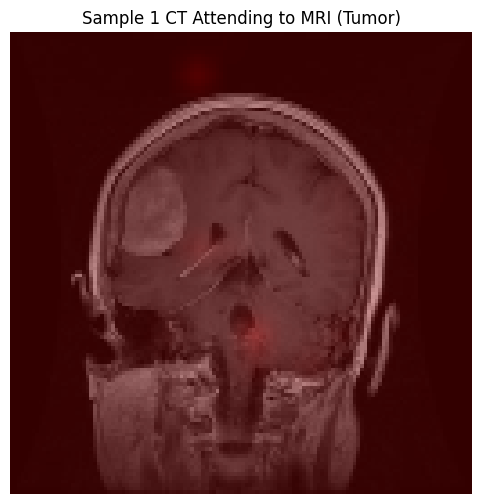

--- Inside visualize_attention_map ---
Received attention_weights shape: torch.Size([1, 2, 256, 256])
Shape after squeezing batch (ndim=4, size 0=1): torch.Size([2, 256, 256])
Shape after averaging heads: torch.Size([256, 256])
Shape after averaging query patches: torch.Size([256])
Inferred grid size: 16x16, Num patches: 256


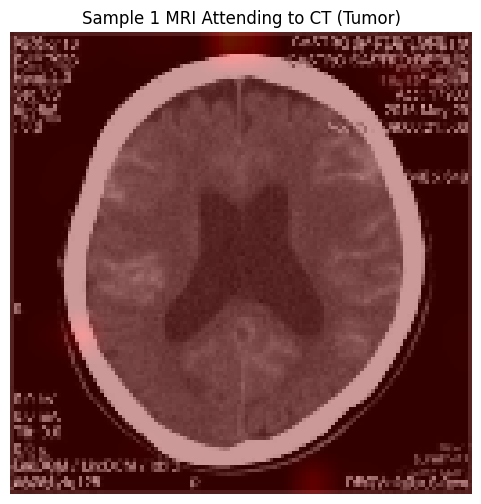

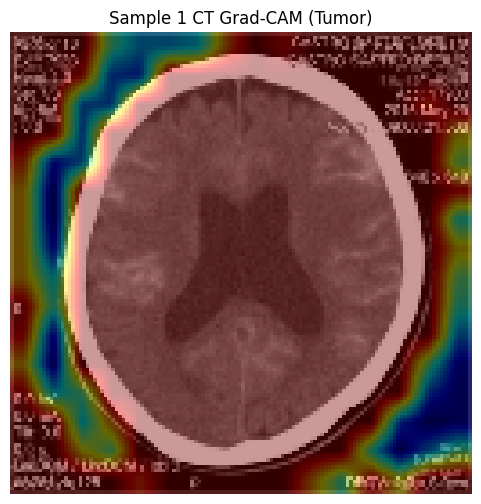

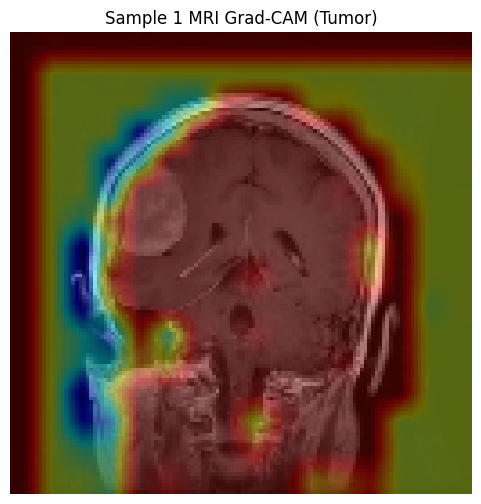


--- Sample 2: True Label: Healthy, Predicted Label: Healthy ---
  CT Path: /content/Dataset/Brain Tumor CT scan Images/Healthy/ct_healthy (170).jpg
  MRI Path: /content/Dataset/Brain Tumor MRI images/Healthy/mri_healthy (170).jpg
Attention Weights Shape: torch.Size([1, 2, 256, 256])
Attention Weights Shape: torch.Size([1, 2, 256, 256])
CT-MRI Attention Weights Shape: torch.Size([1, 2, 256, 256])
MRI-CT Attention Weights Shape: torch.Size([1, 2, 256, 256])
Attention Weights Shape: torch.Size([1, 2, 256, 256])
Attention Weights Shape: torch.Size([1, 2, 256, 256])
CT-MRI Attention Weights Shape: torch.Size([1, 2, 256, 256])
MRI-CT Attention Weights Shape: torch.Size([1, 2, 256, 256])
--- Inside visualize_attention_map ---
Received attention_weights shape: torch.Size([1, 2, 256, 256])
Shape after squeezing batch (ndim=4, size 0=1): torch.Size([2, 256, 256])
Shape after averaging heads: torch.Size([256, 256])
Shape after averaging query patches: torch.Size([256])
Inferred grid size: 16x16,

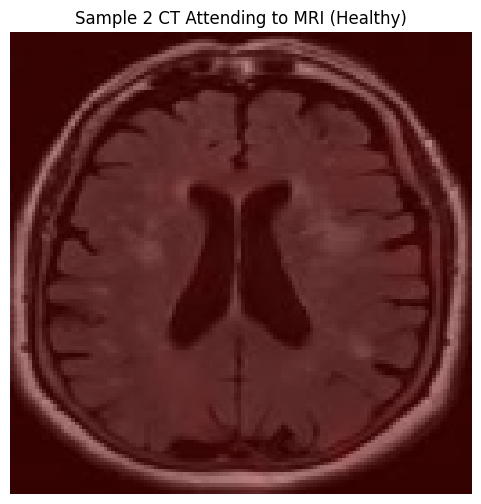

--- Inside visualize_attention_map ---
Received attention_weights shape: torch.Size([1, 2, 256, 256])
Shape after squeezing batch (ndim=4, size 0=1): torch.Size([2, 256, 256])
Shape after averaging heads: torch.Size([256, 256])
Shape after averaging query patches: torch.Size([256])
Inferred grid size: 16x16, Num patches: 256


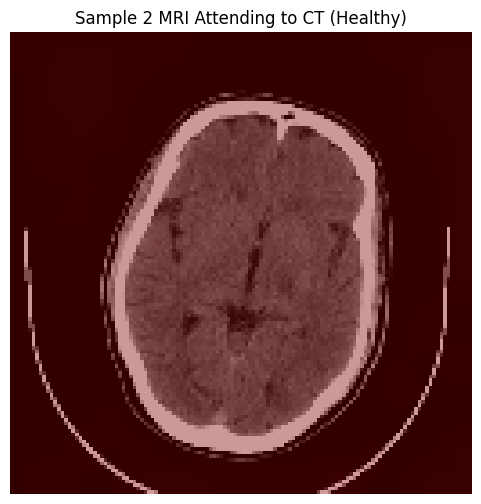

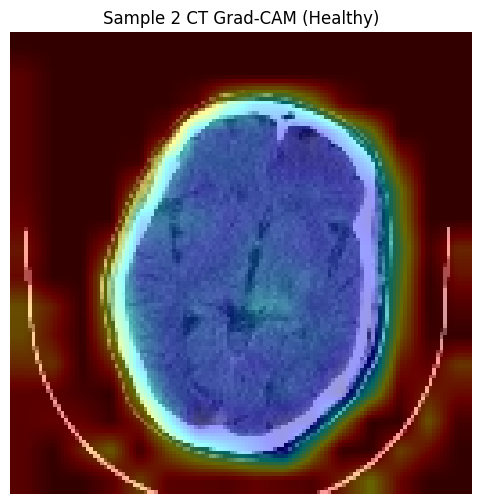

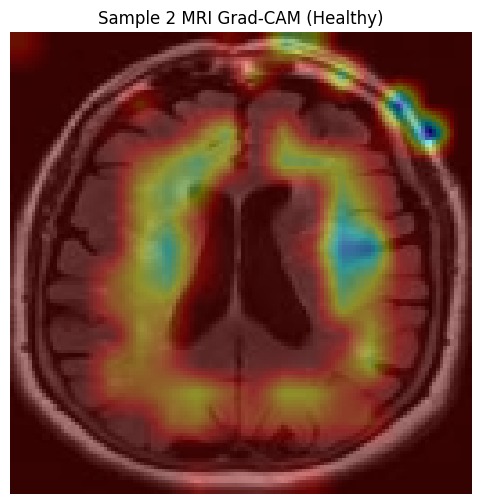


--- Sample 3: True Label: Tumor, Predicted Label: Tumor ---
  CT Path: /content/Dataset/Brain Tumor CT scan Images/Tumor/ct_tumor (73).jpg
  MRI Path: /content/Dataset/Brain Tumor MRI images/Tumor/tumor (73).jpg
Attention Weights Shape: torch.Size([1, 2, 256, 256])
Attention Weights Shape: torch.Size([1, 2, 256, 256])
CT-MRI Attention Weights Shape: torch.Size([1, 2, 256, 256])
MRI-CT Attention Weights Shape: torch.Size([1, 2, 256, 256])
Attention Weights Shape: torch.Size([1, 2, 256, 256])
Attention Weights Shape: torch.Size([1, 2, 256, 256])
CT-MRI Attention Weights Shape: torch.Size([1, 2, 256, 256])
MRI-CT Attention Weights Shape: torch.Size([1, 2, 256, 256])
--- Inside visualize_attention_map ---
Received attention_weights shape: torch.Size([1, 2, 256, 256])
Shape after squeezing batch (ndim=4, size 0=1): torch.Size([2, 256, 256])
Shape after averaging heads: torch.Size([256, 256])
Shape after averaging query patches: torch.Size([256])
Inferred grid size: 16x16, Num patches: 256


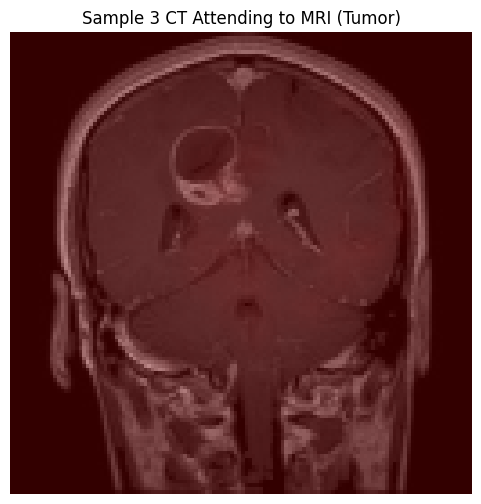

--- Inside visualize_attention_map ---
Received attention_weights shape: torch.Size([1, 2, 256, 256])
Shape after squeezing batch (ndim=4, size 0=1): torch.Size([2, 256, 256])
Shape after averaging heads: torch.Size([256, 256])
Shape after averaging query patches: torch.Size([256])
Inferred grid size: 16x16, Num patches: 256


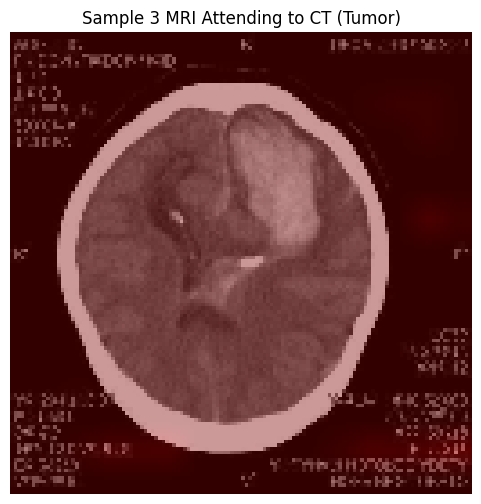

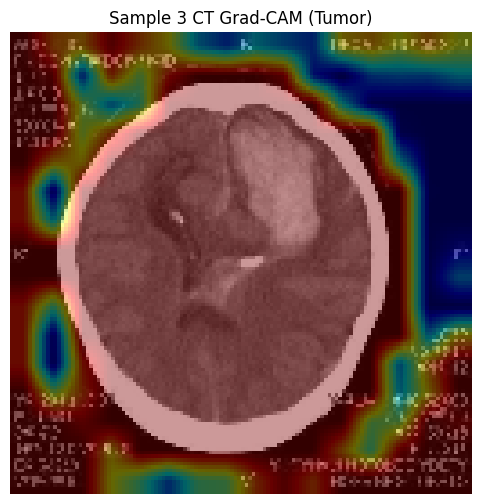

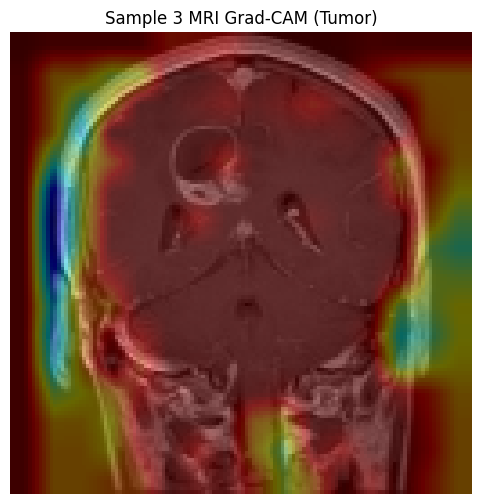


--- Sample 4: True Label: Healthy, Predicted Label: Healthy ---
  CT Path: /content/Dataset/Brain Tumor CT scan Images/Healthy/ct_healthy (195).png
  MRI Path: /content/Dataset/Brain Tumor MRI images/Healthy/mri_healthy (195).jpg
Attention Weights Shape: torch.Size([1, 2, 256, 256])
Attention Weights Shape: torch.Size([1, 2, 256, 256])
CT-MRI Attention Weights Shape: torch.Size([1, 2, 256, 256])
MRI-CT Attention Weights Shape: torch.Size([1, 2, 256, 256])
Attention Weights Shape: torch.Size([1, 2, 256, 256])
Attention Weights Shape: torch.Size([1, 2, 256, 256])
CT-MRI Attention Weights Shape: torch.Size([1, 2, 256, 256])
MRI-CT Attention Weights Shape: torch.Size([1, 2, 256, 256])
--- Inside visualize_attention_map ---
Received attention_weights shape: torch.Size([1, 2, 256, 256])
Shape after squeezing batch (ndim=4, size 0=1): torch.Size([2, 256, 256])
Shape after averaging heads: torch.Size([256, 256])
Shape after averaging query patches: torch.Size([256])
Inferred grid size: 16x16,

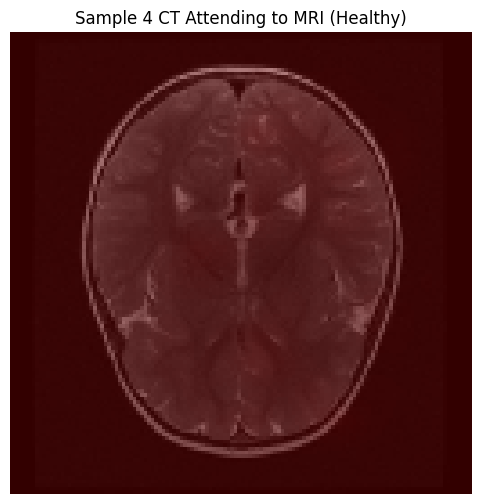

--- Inside visualize_attention_map ---
Received attention_weights shape: torch.Size([1, 2, 256, 256])
Shape after squeezing batch (ndim=4, size 0=1): torch.Size([2, 256, 256])
Shape after averaging heads: torch.Size([256, 256])
Shape after averaging query patches: torch.Size([256])
Inferred grid size: 16x16, Num patches: 256


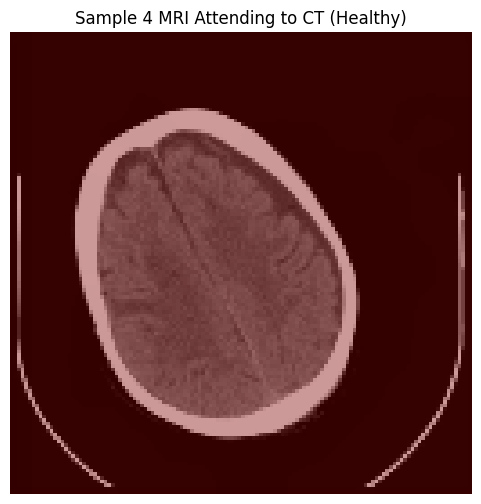

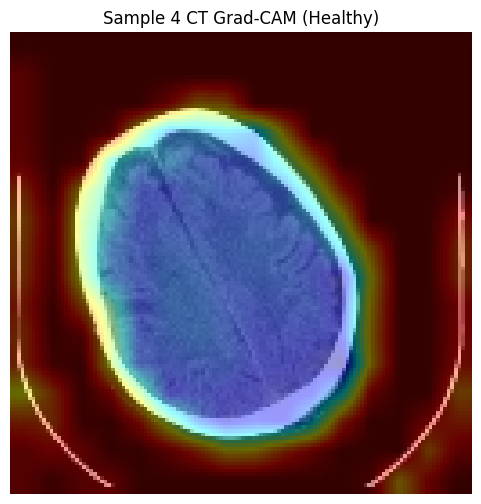

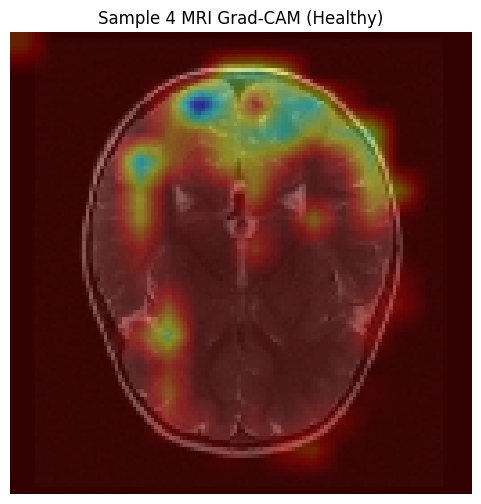


--- Sample 5: True Label: Healthy, Predicted Label: Healthy ---
  CT Path: /content/Dataset/Brain Tumor CT scan Images/Healthy/ct_healthy (142).png
  MRI Path: /content/Dataset/Brain Tumor MRI images/Healthy/mri_healthy (142).jpg
Attention Weights Shape: torch.Size([1, 2, 256, 256])
Attention Weights Shape: torch.Size([1, 2, 256, 256])
CT-MRI Attention Weights Shape: torch.Size([1, 2, 256, 256])
MRI-CT Attention Weights Shape: torch.Size([1, 2, 256, 256])
Attention Weights Shape: torch.Size([1, 2, 256, 256])
Attention Weights Shape: torch.Size([1, 2, 256, 256])
CT-MRI Attention Weights Shape: torch.Size([1, 2, 256, 256])
MRI-CT Attention Weights Shape: torch.Size([1, 2, 256, 256])
--- Inside visualize_attention_map ---
Received attention_weights shape: torch.Size([1, 2, 256, 256])
Shape after squeezing batch (ndim=4, size 0=1): torch.Size([2, 256, 256])
Shape after averaging heads: torch.Size([256, 256])
Shape after averaging query patches: torch.Size([256])
Inferred grid size: 16x16,

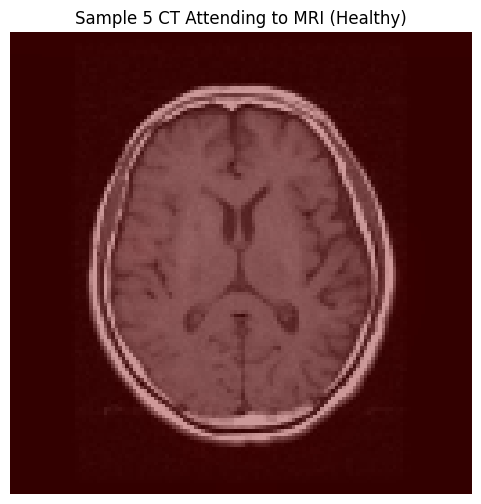

--- Inside visualize_attention_map ---
Received attention_weights shape: torch.Size([1, 2, 256, 256])
Shape after squeezing batch (ndim=4, size 0=1): torch.Size([2, 256, 256])
Shape after averaging heads: torch.Size([256, 256])
Shape after averaging query patches: torch.Size([256])
Inferred grid size: 16x16, Num patches: 256


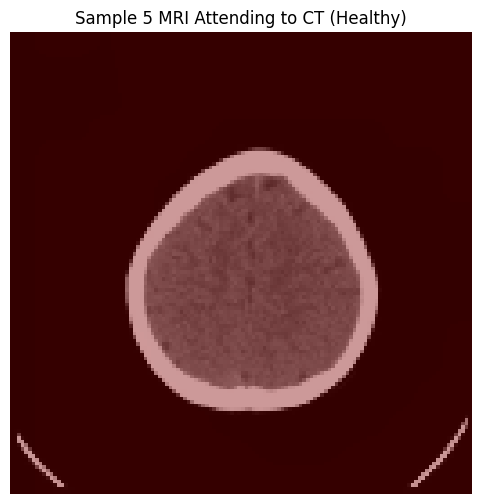

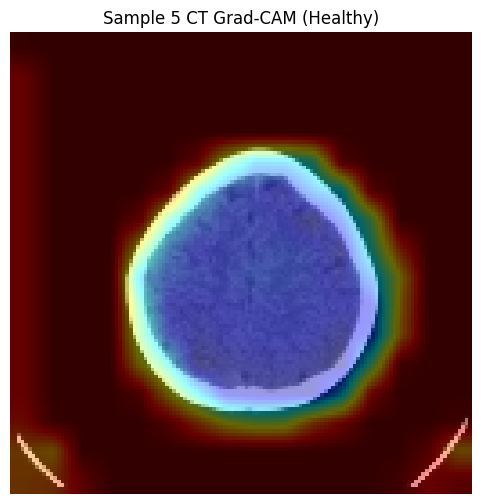

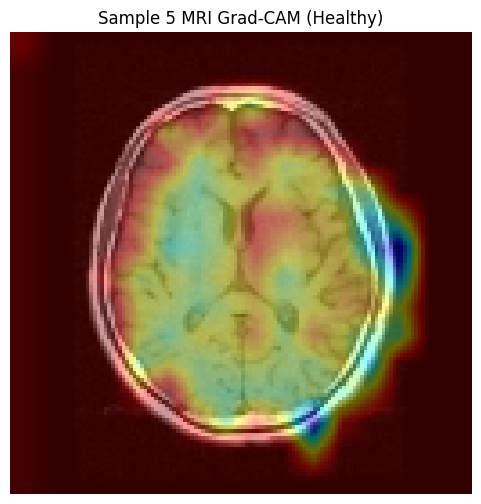


--- Sample 6: True Label: Healthy, Predicted Label: Healthy ---
  CT Path: /content/Dataset/Brain Tumor CT scan Images/Healthy/ct_healthy (335).jpg
  MRI Path: /content/Dataset/Brain Tumor MRI images/Healthy/mri_healthy (335).jpg
Attention Weights Shape: torch.Size([1, 2, 256, 256])
Attention Weights Shape: torch.Size([1, 2, 256, 256])
CT-MRI Attention Weights Shape: torch.Size([1, 2, 256, 256])
MRI-CT Attention Weights Shape: torch.Size([1, 2, 256, 256])
Attention Weights Shape: torch.Size([1, 2, 256, 256])
Attention Weights Shape: torch.Size([1, 2, 256, 256])
CT-MRI Attention Weights Shape: torch.Size([1, 2, 256, 256])
MRI-CT Attention Weights Shape: torch.Size([1, 2, 256, 256])
--- Inside visualize_attention_map ---
Received attention_weights shape: torch.Size([1, 2, 256, 256])
Shape after squeezing batch (ndim=4, size 0=1): torch.Size([2, 256, 256])
Shape after averaging heads: torch.Size([256, 256])
Shape after averaging query patches: torch.Size([256])
Inferred grid size: 16x16,

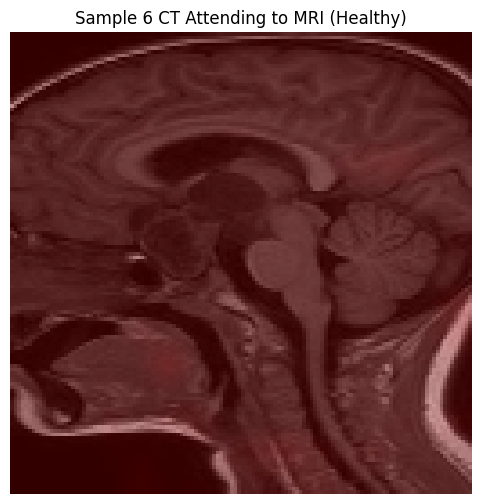

--- Inside visualize_attention_map ---
Received attention_weights shape: torch.Size([1, 2, 256, 256])
Shape after squeezing batch (ndim=4, size 0=1): torch.Size([2, 256, 256])
Shape after averaging heads: torch.Size([256, 256])
Shape after averaging query patches: torch.Size([256])
Inferred grid size: 16x16, Num patches: 256


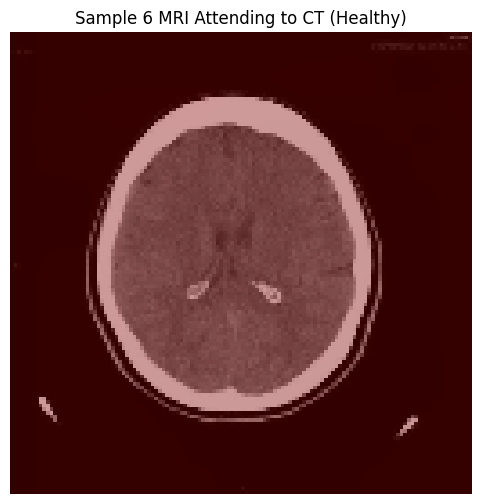

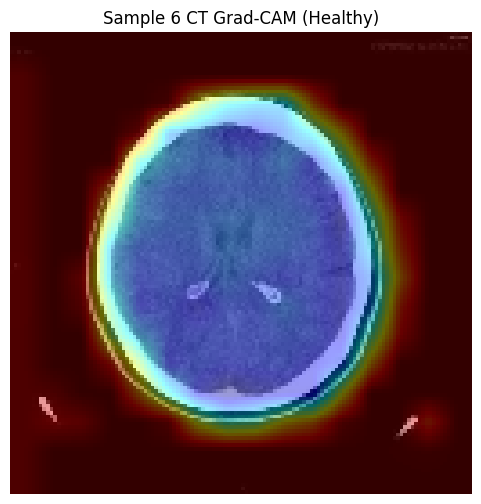

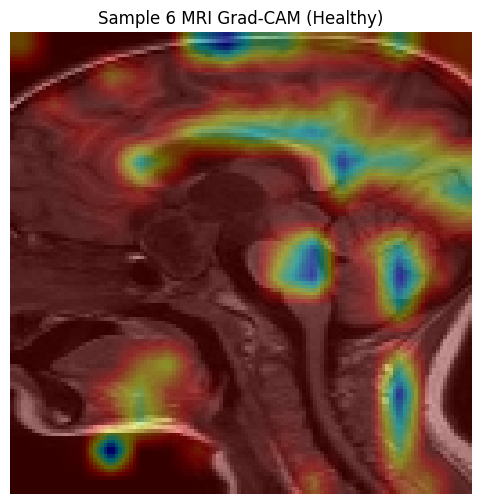


--- Sample 7: True Label: Healthy, Predicted Label: Healthy ---
  CT Path: /content/Dataset/Brain Tumor CT scan Images/Healthy/ct_healthy (510).jpg
  MRI Path: /content/Dataset/Brain Tumor MRI images/Healthy/mri_healthy (510).jpg
Attention Weights Shape: torch.Size([1, 2, 256, 256])
Attention Weights Shape: torch.Size([1, 2, 256, 256])
CT-MRI Attention Weights Shape: torch.Size([1, 2, 256, 256])
MRI-CT Attention Weights Shape: torch.Size([1, 2, 256, 256])
Attention Weights Shape: torch.Size([1, 2, 256, 256])
Attention Weights Shape: torch.Size([1, 2, 256, 256])
CT-MRI Attention Weights Shape: torch.Size([1, 2, 256, 256])
MRI-CT Attention Weights Shape: torch.Size([1, 2, 256, 256])
--- Inside visualize_attention_map ---
Received attention_weights shape: torch.Size([1, 2, 256, 256])
Shape after squeezing batch (ndim=4, size 0=1): torch.Size([2, 256, 256])
Shape after averaging heads: torch.Size([256, 256])
Shape after averaging query patches: torch.Size([256])
Inferred grid size: 16x16,

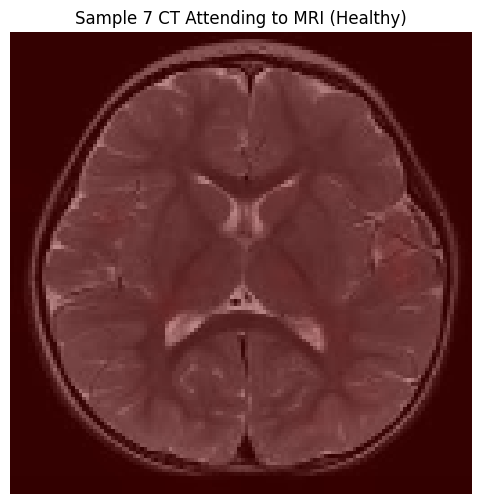

--- Inside visualize_attention_map ---
Received attention_weights shape: torch.Size([1, 2, 256, 256])
Shape after squeezing batch (ndim=4, size 0=1): torch.Size([2, 256, 256])
Shape after averaging heads: torch.Size([256, 256])
Shape after averaging query patches: torch.Size([256])
Inferred grid size: 16x16, Num patches: 256


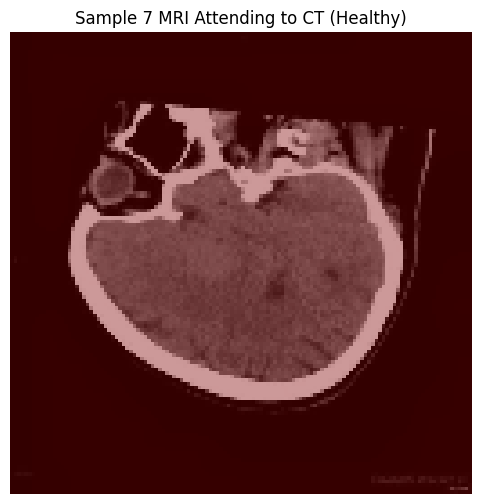

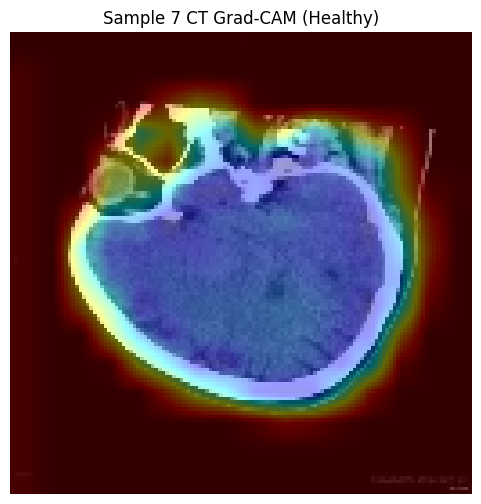

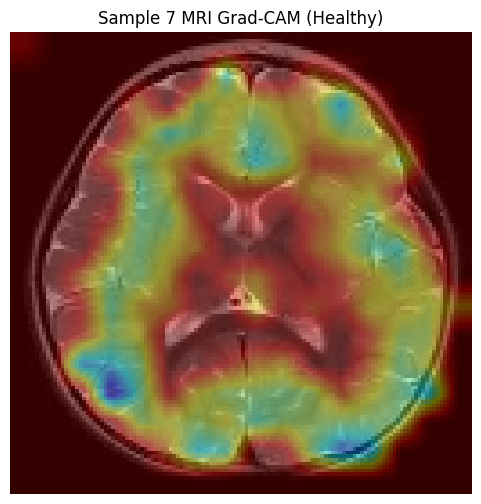


--- Sample 8: True Label: Healthy, Predicted Label: Healthy ---
  CT Path: /content/Dataset/Brain Tumor CT scan Images/Healthy/ct_healthy (1488).jpg
  MRI Path: /content/Dataset/Brain Tumor MRI images/Healthy/mri_healthy (1488).jpg
Attention Weights Shape: torch.Size([1, 2, 256, 256])
Attention Weights Shape: torch.Size([1, 2, 256, 256])
CT-MRI Attention Weights Shape: torch.Size([1, 2, 256, 256])
MRI-CT Attention Weights Shape: torch.Size([1, 2, 256, 256])
Attention Weights Shape: torch.Size([1, 2, 256, 256])
Attention Weights Shape: torch.Size([1, 2, 256, 256])
CT-MRI Attention Weights Shape: torch.Size([1, 2, 256, 256])
MRI-CT Attention Weights Shape: torch.Size([1, 2, 256, 256])
--- Inside visualize_attention_map ---
Received attention_weights shape: torch.Size([1, 2, 256, 256])
Shape after squeezing batch (ndim=4, size 0=1): torch.Size([2, 256, 256])
Shape after averaging heads: torch.Size([256, 256])
Shape after averaging query patches: torch.Size([256])
Inferred grid size: 16x1

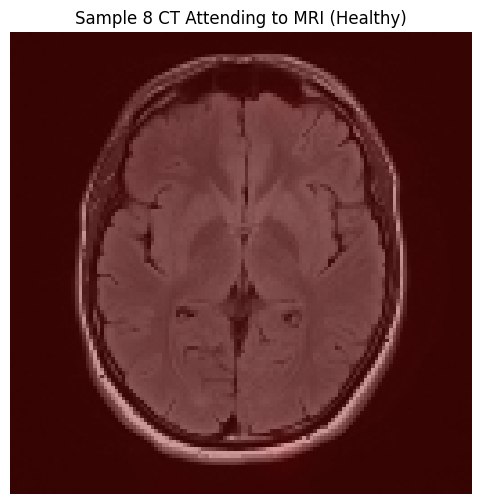

--- Inside visualize_attention_map ---
Received attention_weights shape: torch.Size([1, 2, 256, 256])
Shape after squeezing batch (ndim=4, size 0=1): torch.Size([2, 256, 256])
Shape after averaging heads: torch.Size([256, 256])
Shape after averaging query patches: torch.Size([256])
Inferred grid size: 16x16, Num patches: 256


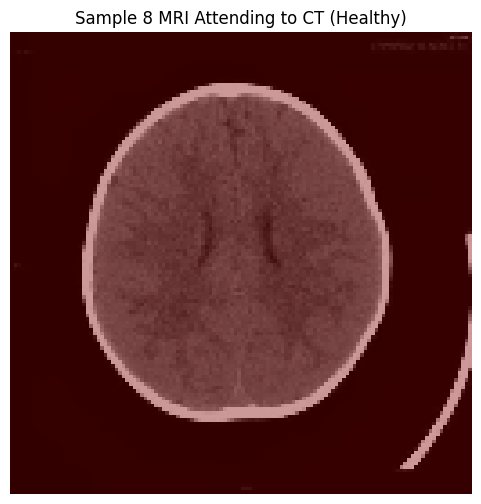

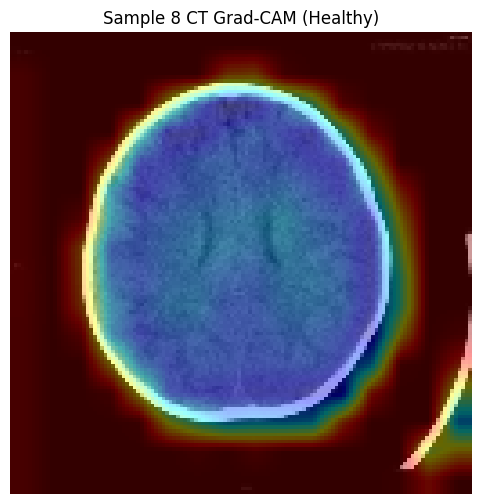

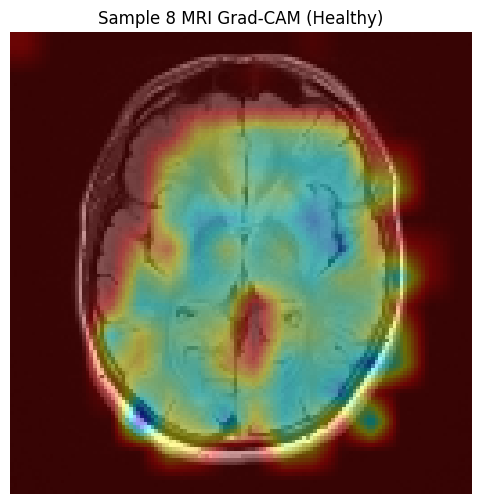


--- Sample 9: True Label: Healthy, Predicted Label: Healthy ---
  CT Path: /content/Dataset/Brain Tumor CT scan Images/Healthy/ct_healthy (313).jpg
  MRI Path: /content/Dataset/Brain Tumor MRI images/Healthy/mri_healthy (313).jpg
Attention Weights Shape: torch.Size([1, 2, 256, 256])
Attention Weights Shape: torch.Size([1, 2, 256, 256])
CT-MRI Attention Weights Shape: torch.Size([1, 2, 256, 256])
MRI-CT Attention Weights Shape: torch.Size([1, 2, 256, 256])
Attention Weights Shape: torch.Size([1, 2, 256, 256])
Attention Weights Shape: torch.Size([1, 2, 256, 256])
CT-MRI Attention Weights Shape: torch.Size([1, 2, 256, 256])
MRI-CT Attention Weights Shape: torch.Size([1, 2, 256, 256])
--- Inside visualize_attention_map ---
Received attention_weights shape: torch.Size([1, 2, 256, 256])
Shape after squeezing batch (ndim=4, size 0=1): torch.Size([2, 256, 256])
Shape after averaging heads: torch.Size([256, 256])
Shape after averaging query patches: torch.Size([256])
Inferred grid size: 16x16,

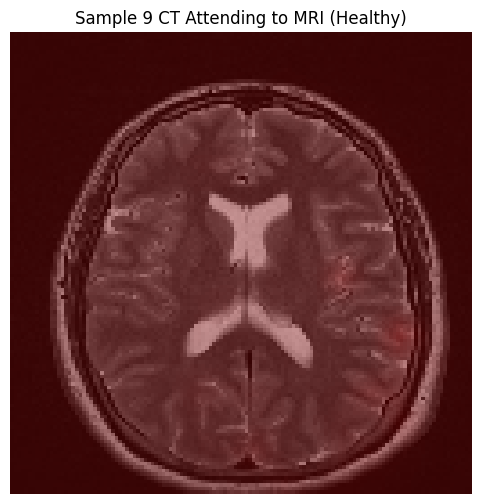

--- Inside visualize_attention_map ---
Received attention_weights shape: torch.Size([1, 2, 256, 256])
Shape after squeezing batch (ndim=4, size 0=1): torch.Size([2, 256, 256])
Shape after averaging heads: torch.Size([256, 256])
Shape after averaging query patches: torch.Size([256])
Inferred grid size: 16x16, Num patches: 256


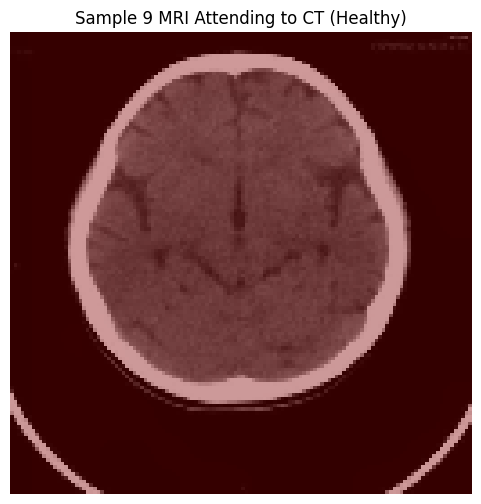

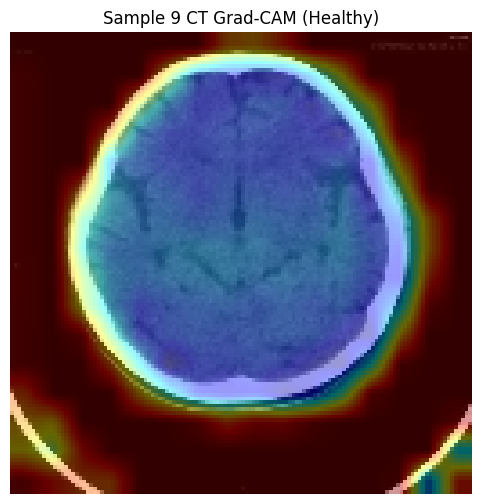

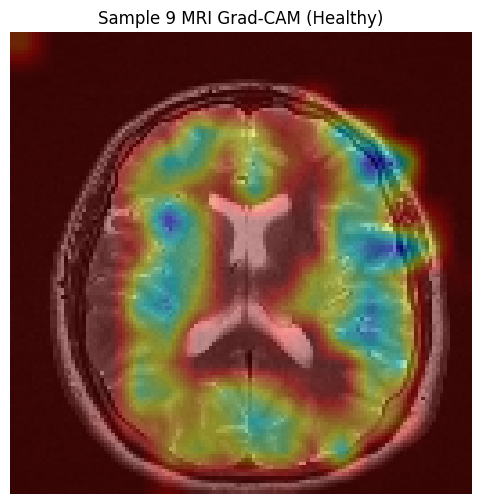


--- Sample 10: True Label: Healthy, Predicted Label: Healthy ---
  CT Path: /content/Dataset/Brain Tumor CT scan Images/Healthy/ct_healthy (121).png
  MRI Path: /content/Dataset/Brain Tumor MRI images/Healthy/mri_healthy (121).jpg
Attention Weights Shape: torch.Size([1, 2, 256, 256])
Attention Weights Shape: torch.Size([1, 2, 256, 256])
CT-MRI Attention Weights Shape: torch.Size([1, 2, 256, 256])
MRI-CT Attention Weights Shape: torch.Size([1, 2, 256, 256])
Attention Weights Shape: torch.Size([1, 2, 256, 256])
Attention Weights Shape: torch.Size([1, 2, 256, 256])
CT-MRI Attention Weights Shape: torch.Size([1, 2, 256, 256])
MRI-CT Attention Weights Shape: torch.Size([1, 2, 256, 256])
--- Inside visualize_attention_map ---
Received attention_weights shape: torch.Size([1, 2, 256, 256])
Shape after squeezing batch (ndim=4, size 0=1): torch.Size([2, 256, 256])
Shape after averaging heads: torch.Size([256, 256])
Shape after averaging query patches: torch.Size([256])
Inferred grid size: 16x16

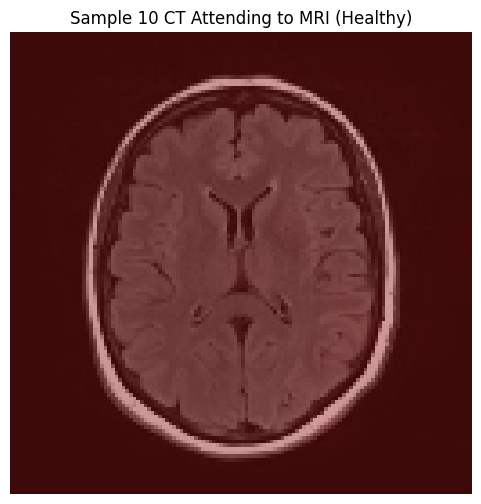

--- Inside visualize_attention_map ---
Received attention_weights shape: torch.Size([1, 2, 256, 256])
Shape after squeezing batch (ndim=4, size 0=1): torch.Size([2, 256, 256])
Shape after averaging heads: torch.Size([256, 256])
Shape after averaging query patches: torch.Size([256])
Inferred grid size: 16x16, Num patches: 256


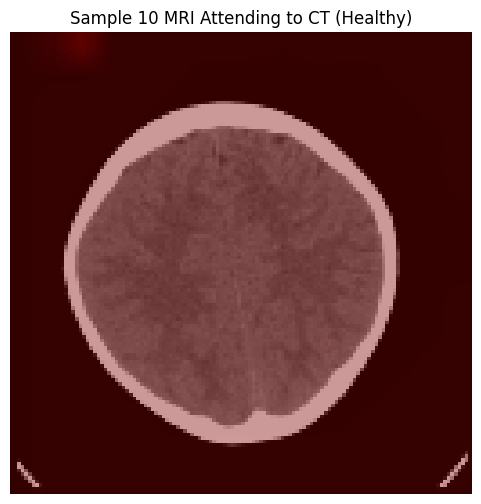

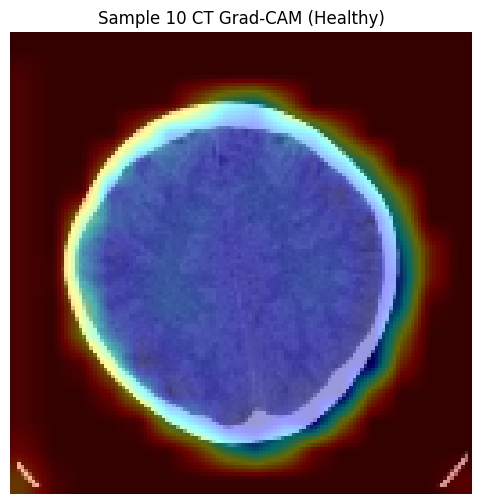

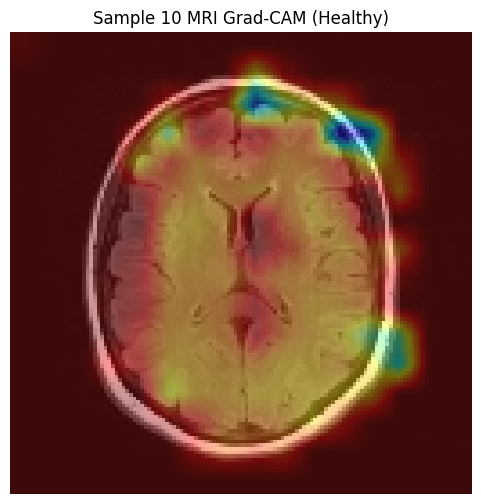


--- Sample 11: True Label: Healthy, Predicted Label: Healthy ---
  CT Path: /content/Dataset/Brain Tumor CT scan Images/Healthy/ct_healthy (552).jpg
  MRI Path: /content/Dataset/Brain Tumor MRI images/Healthy/mri_healthy (552).jpg
Attention Weights Shape: torch.Size([1, 2, 256, 256])
Attention Weights Shape: torch.Size([1, 2, 256, 256])
CT-MRI Attention Weights Shape: torch.Size([1, 2, 256, 256])
MRI-CT Attention Weights Shape: torch.Size([1, 2, 256, 256])
Attention Weights Shape: torch.Size([1, 2, 256, 256])
Attention Weights Shape: torch.Size([1, 2, 256, 256])
CT-MRI Attention Weights Shape: torch.Size([1, 2, 256, 256])
MRI-CT Attention Weights Shape: torch.Size([1, 2, 256, 256])
--- Inside visualize_attention_map ---
Received attention_weights shape: torch.Size([1, 2, 256, 256])
Shape after squeezing batch (ndim=4, size 0=1): torch.Size([2, 256, 256])
Shape after averaging heads: torch.Size([256, 256])
Shape after averaging query patches: torch.Size([256])
Inferred grid size: 16x16

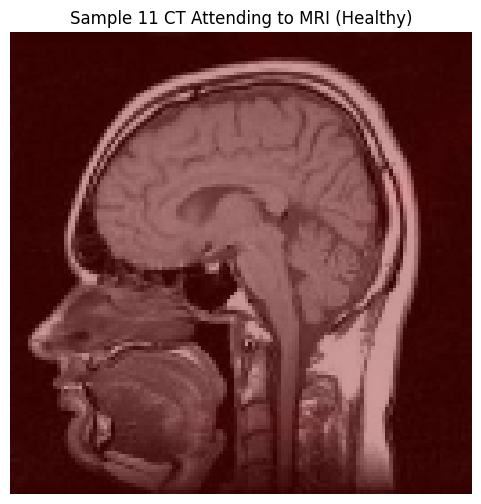

--- Inside visualize_attention_map ---
Received attention_weights shape: torch.Size([1, 2, 256, 256])
Shape after squeezing batch (ndim=4, size 0=1): torch.Size([2, 256, 256])
Shape after averaging heads: torch.Size([256, 256])
Shape after averaging query patches: torch.Size([256])
Inferred grid size: 16x16, Num patches: 256


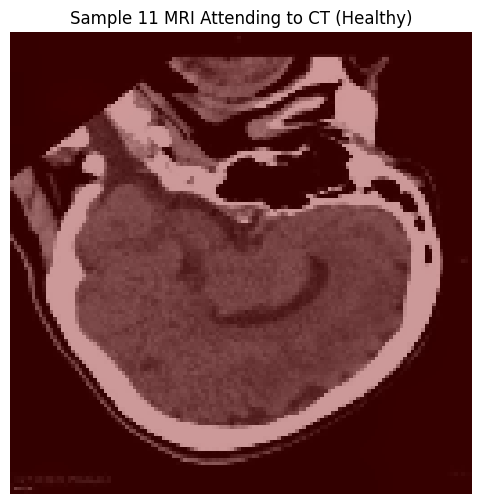

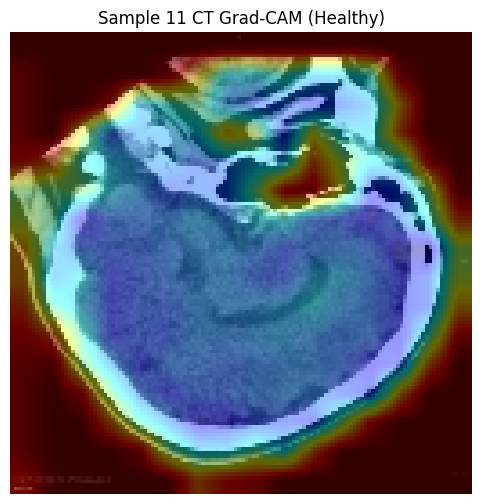

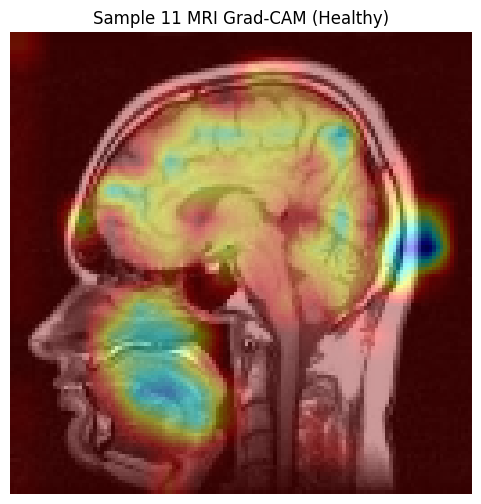


--- Sample 12: True Label: Tumor, Predicted Label: Tumor ---
  CT Path: /content/Dataset/Brain Tumor CT scan Images/Tumor/ct_tumor (551).jpg
  MRI Path: /content/Dataset/Brain Tumor MRI images/Tumor/tumor (551).jpg
Attention Weights Shape: torch.Size([1, 2, 256, 256])
Attention Weights Shape: torch.Size([1, 2, 256, 256])
CT-MRI Attention Weights Shape: torch.Size([1, 2, 256, 256])
MRI-CT Attention Weights Shape: torch.Size([1, 2, 256, 256])
Attention Weights Shape: torch.Size([1, 2, 256, 256])
Attention Weights Shape: torch.Size([1, 2, 256, 256])
CT-MRI Attention Weights Shape: torch.Size([1, 2, 256, 256])
MRI-CT Attention Weights Shape: torch.Size([1, 2, 256, 256])
--- Inside visualize_attention_map ---
Received attention_weights shape: torch.Size([1, 2, 256, 256])
Shape after squeezing batch (ndim=4, size 0=1): torch.Size([2, 256, 256])
Shape after averaging heads: torch.Size([256, 256])
Shape after averaging query patches: torch.Size([256])
Inferred grid size: 16x16, Num patches: 2

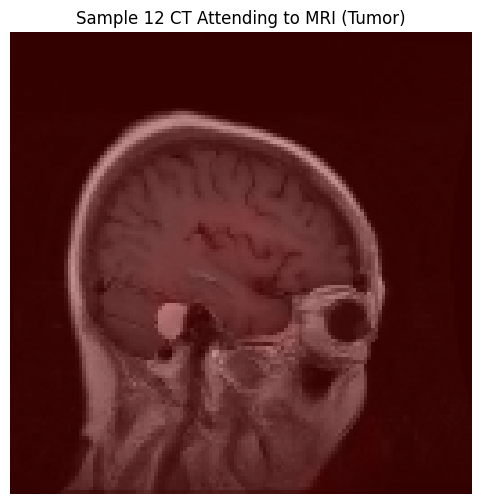

--- Inside visualize_attention_map ---
Received attention_weights shape: torch.Size([1, 2, 256, 256])
Shape after squeezing batch (ndim=4, size 0=1): torch.Size([2, 256, 256])
Shape after averaging heads: torch.Size([256, 256])
Shape after averaging query patches: torch.Size([256])
Inferred grid size: 16x16, Num patches: 256


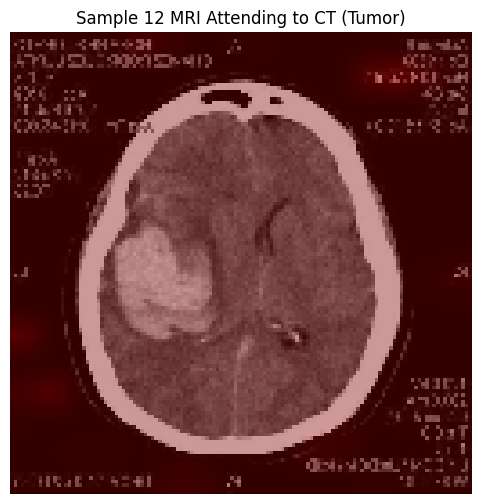

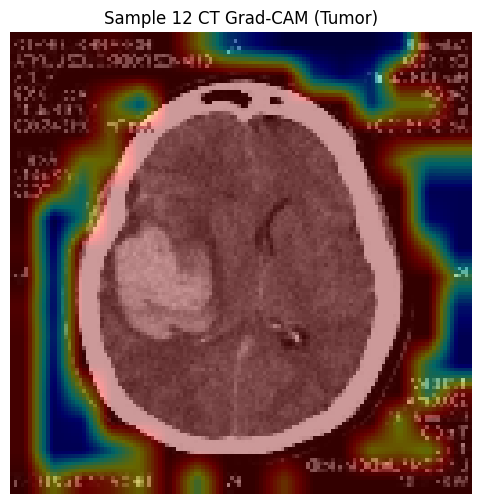

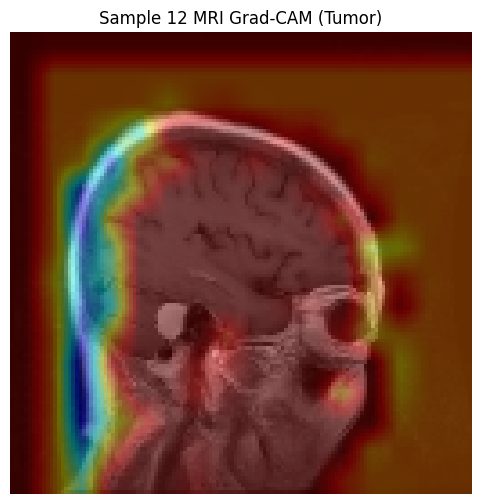


--- Sample 13: True Label: Healthy, Predicted Label: Healthy ---
  CT Path: /content/Dataset/Brain Tumor CT scan Images/Healthy/ct_healthy (1520).jpg
  MRI Path: /content/Dataset/Brain Tumor MRI images/Healthy/mri_healthy (1520).jpg
Attention Weights Shape: torch.Size([1, 2, 256, 256])
Attention Weights Shape: torch.Size([1, 2, 256, 256])
CT-MRI Attention Weights Shape: torch.Size([1, 2, 256, 256])
MRI-CT Attention Weights Shape: torch.Size([1, 2, 256, 256])
Attention Weights Shape: torch.Size([1, 2, 256, 256])
Attention Weights Shape: torch.Size([1, 2, 256, 256])
CT-MRI Attention Weights Shape: torch.Size([1, 2, 256, 256])
MRI-CT Attention Weights Shape: torch.Size([1, 2, 256, 256])
--- Inside visualize_attention_map ---
Received attention_weights shape: torch.Size([1, 2, 256, 256])
Shape after squeezing batch (ndim=4, size 0=1): torch.Size([2, 256, 256])
Shape after averaging heads: torch.Size([256, 256])
Shape after averaging query patches: torch.Size([256])
Inferred grid size: 16x

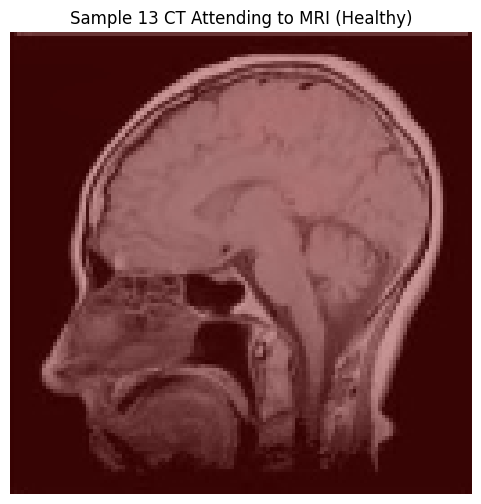

--- Inside visualize_attention_map ---
Received attention_weights shape: torch.Size([1, 2, 256, 256])
Shape after squeezing batch (ndim=4, size 0=1): torch.Size([2, 256, 256])
Shape after averaging heads: torch.Size([256, 256])
Shape after averaging query patches: torch.Size([256])
Inferred grid size: 16x16, Num patches: 256


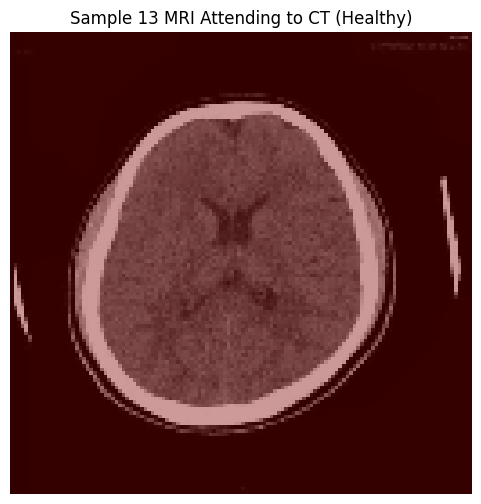

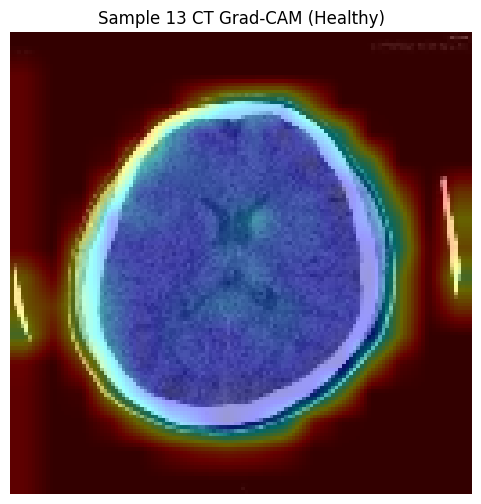

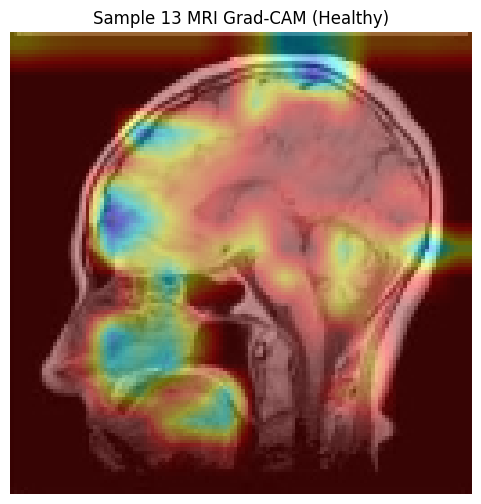


--- Sample 14: True Label: Tumor, Predicted Label: Healthy ---
  CT Path: /content/Dataset/Brain Tumor CT scan Images/Tumor/ct_tumor (126).png
  MRI Path: /content/Dataset/Brain Tumor MRI images/Tumor/tumor (126).jpg
Attention Weights Shape: torch.Size([1, 2, 256, 256])
Attention Weights Shape: torch.Size([1, 2, 256, 256])
CT-MRI Attention Weights Shape: torch.Size([1, 2, 256, 256])
MRI-CT Attention Weights Shape: torch.Size([1, 2, 256, 256])
Attention Weights Shape: torch.Size([1, 2, 256, 256])
Attention Weights Shape: torch.Size([1, 2, 256, 256])
CT-MRI Attention Weights Shape: torch.Size([1, 2, 256, 256])
MRI-CT Attention Weights Shape: torch.Size([1, 2, 256, 256])
--- Inside visualize_attention_map ---
Received attention_weights shape: torch.Size([1, 2, 256, 256])
Shape after squeezing batch (ndim=4, size 0=1): torch.Size([2, 256, 256])
Shape after averaging heads: torch.Size([256, 256])
Shape after averaging query patches: torch.Size([256])
Inferred grid size: 16x16, Num patches:

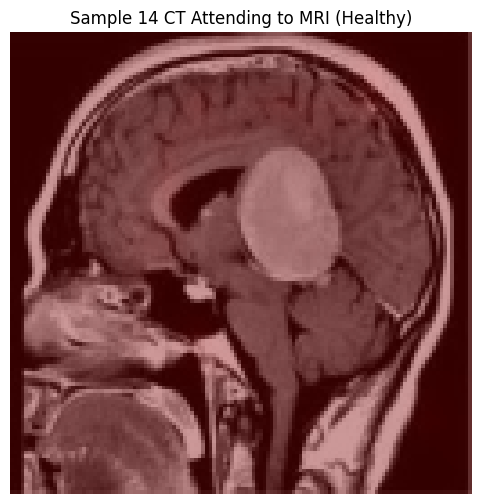

--- Inside visualize_attention_map ---
Received attention_weights shape: torch.Size([1, 2, 256, 256])
Shape after squeezing batch (ndim=4, size 0=1): torch.Size([2, 256, 256])
Shape after averaging heads: torch.Size([256, 256])
Shape after averaging query patches: torch.Size([256])
Inferred grid size: 16x16, Num patches: 256


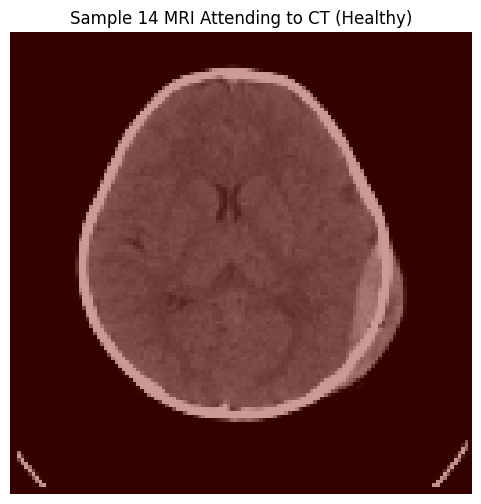

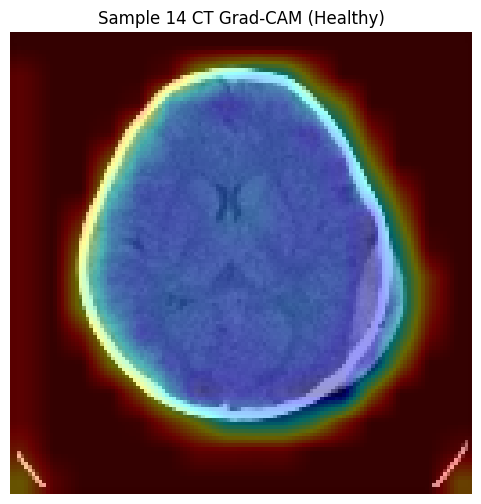

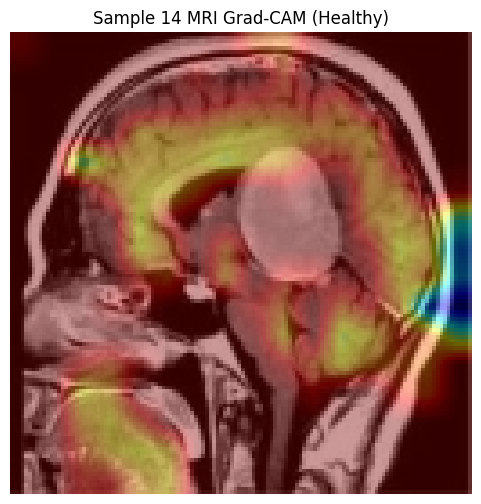


--- Sample 15: True Label: Healthy, Predicted Label: Healthy ---
  CT Path: /content/Dataset/Brain Tumor CT scan Images/Healthy/ct_healthy (170).png
  MRI Path: /content/Dataset/Brain Tumor MRI images/Healthy/mri_healthy (170).jpg
Attention Weights Shape: torch.Size([1, 2, 256, 256])
Attention Weights Shape: torch.Size([1, 2, 256, 256])
CT-MRI Attention Weights Shape: torch.Size([1, 2, 256, 256])
MRI-CT Attention Weights Shape: torch.Size([1, 2, 256, 256])
Attention Weights Shape: torch.Size([1, 2, 256, 256])
Attention Weights Shape: torch.Size([1, 2, 256, 256])
CT-MRI Attention Weights Shape: torch.Size([1, 2, 256, 256])
MRI-CT Attention Weights Shape: torch.Size([1, 2, 256, 256])
--- Inside visualize_attention_map ---
Received attention_weights shape: torch.Size([1, 2, 256, 256])
Shape after squeezing batch (ndim=4, size 0=1): torch.Size([2, 256, 256])
Shape after averaging heads: torch.Size([256, 256])
Shape after averaging query patches: torch.Size([256])
Inferred grid size: 16x16

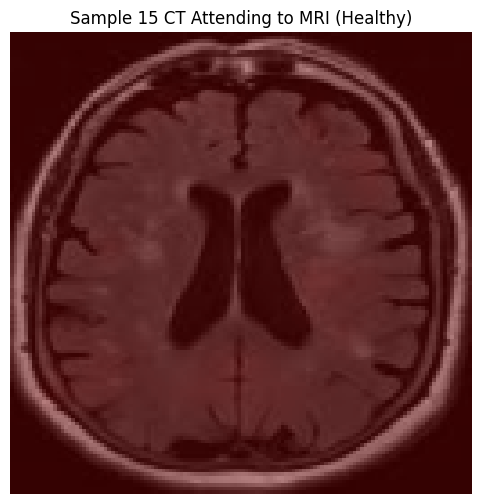

--- Inside visualize_attention_map ---
Received attention_weights shape: torch.Size([1, 2, 256, 256])
Shape after squeezing batch (ndim=4, size 0=1): torch.Size([2, 256, 256])
Shape after averaging heads: torch.Size([256, 256])
Shape after averaging query patches: torch.Size([256])
Inferred grid size: 16x16, Num patches: 256


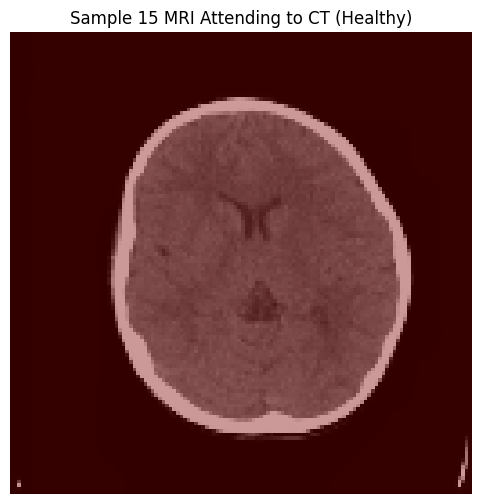

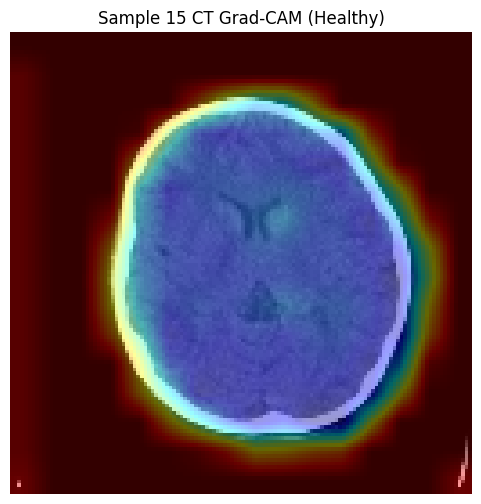

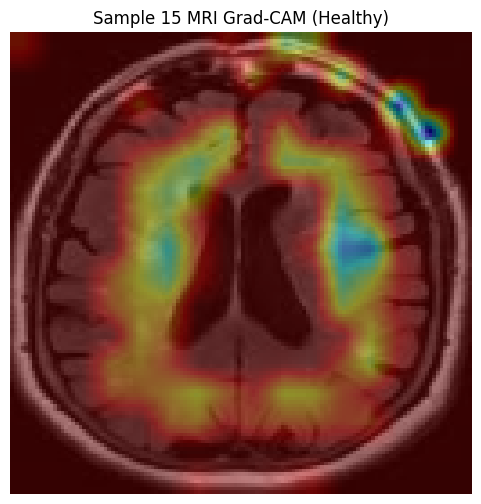


--- Sample 16: True Label: Healthy, Predicted Label: Healthy ---
  CT Path: /content/Dataset/Brain Tumor CT scan Images/Healthy/ct_healthy (1077).jpg
  MRI Path: /content/Dataset/Brain Tumor MRI images/Healthy/mri_healthy (1077).jpg
Attention Weights Shape: torch.Size([1, 2, 256, 256])
Attention Weights Shape: torch.Size([1, 2, 256, 256])
CT-MRI Attention Weights Shape: torch.Size([1, 2, 256, 256])
MRI-CT Attention Weights Shape: torch.Size([1, 2, 256, 256])
Attention Weights Shape: torch.Size([1, 2, 256, 256])
Attention Weights Shape: torch.Size([1, 2, 256, 256])
CT-MRI Attention Weights Shape: torch.Size([1, 2, 256, 256])
MRI-CT Attention Weights Shape: torch.Size([1, 2, 256, 256])
--- Inside visualize_attention_map ---
Received attention_weights shape: torch.Size([1, 2, 256, 256])
Shape after squeezing batch (ndim=4, size 0=1): torch.Size([2, 256, 256])
Shape after averaging heads: torch.Size([256, 256])
Shape after averaging query patches: torch.Size([256])
Inferred grid size: 16x

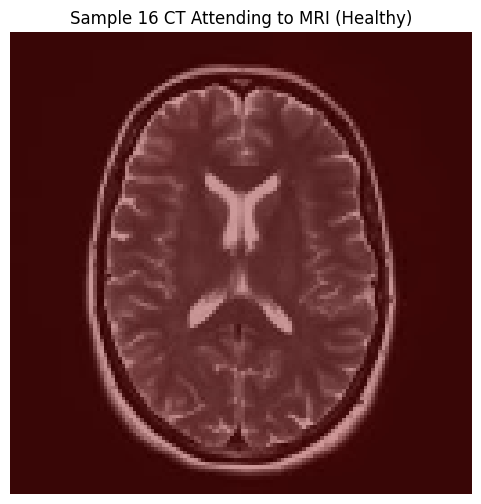

--- Inside visualize_attention_map ---
Received attention_weights shape: torch.Size([1, 2, 256, 256])
Shape after squeezing batch (ndim=4, size 0=1): torch.Size([2, 256, 256])
Shape after averaging heads: torch.Size([256, 256])
Shape after averaging query patches: torch.Size([256])
Inferred grid size: 16x16, Num patches: 256


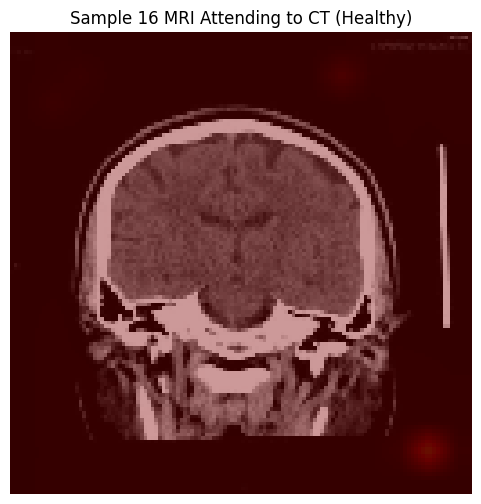

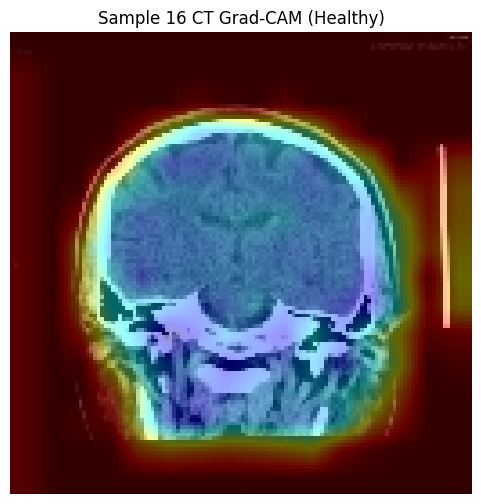

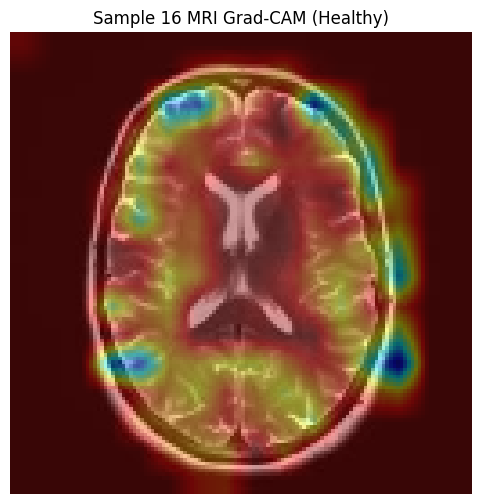


--- Sample 17: True Label: Healthy, Predicted Label: Tumor ---
  CT Path: /content/Dataset/Brain Tumor CT scan Images/Healthy/ct_healthy (976).jpg
  MRI Path: /content/Dataset/Brain Tumor MRI images/Healthy/mri_healthy (976).jpg
Attention Weights Shape: torch.Size([1, 2, 256, 256])
Attention Weights Shape: torch.Size([1, 2, 256, 256])
CT-MRI Attention Weights Shape: torch.Size([1, 2, 256, 256])
MRI-CT Attention Weights Shape: torch.Size([1, 2, 256, 256])
Attention Weights Shape: torch.Size([1, 2, 256, 256])
Attention Weights Shape: torch.Size([1, 2, 256, 256])
CT-MRI Attention Weights Shape: torch.Size([1, 2, 256, 256])
MRI-CT Attention Weights Shape: torch.Size([1, 2, 256, 256])
--- Inside visualize_attention_map ---
Received attention_weights shape: torch.Size([1, 2, 256, 256])
Shape after squeezing batch (ndim=4, size 0=1): torch.Size([2, 256, 256])
Shape after averaging heads: torch.Size([256, 256])
Shape after averaging query patches: torch.Size([256])
Inferred grid size: 16x16, 

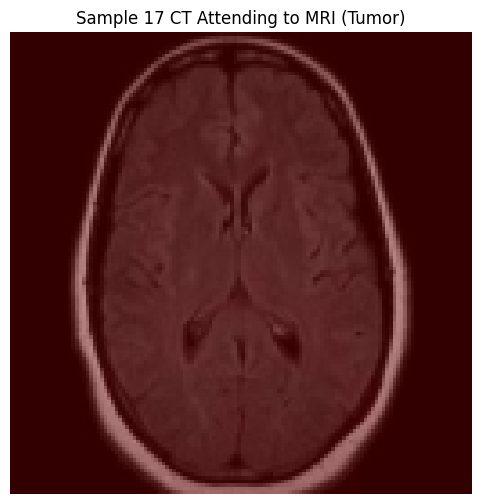

--- Inside visualize_attention_map ---
Received attention_weights shape: torch.Size([1, 2, 256, 256])
Shape after squeezing batch (ndim=4, size 0=1): torch.Size([2, 256, 256])
Shape after averaging heads: torch.Size([256, 256])
Shape after averaging query patches: torch.Size([256])
Inferred grid size: 16x16, Num patches: 256


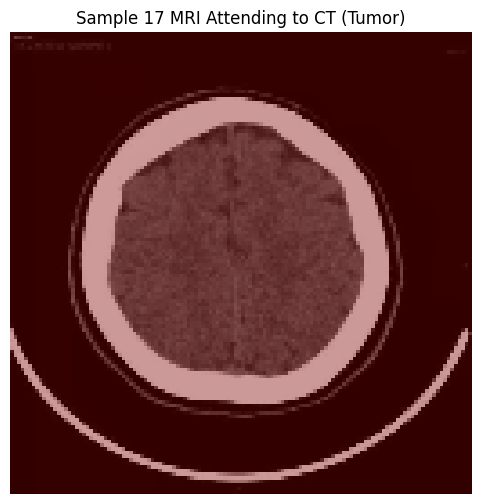

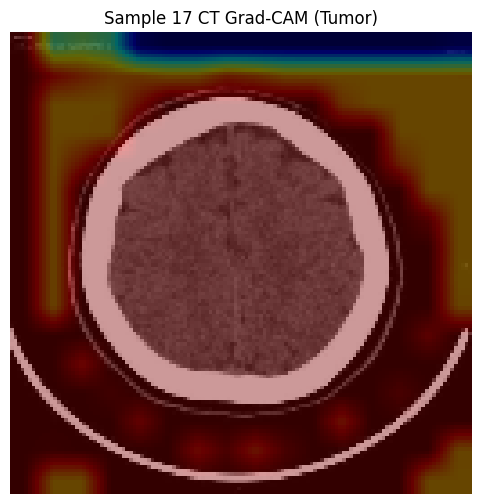

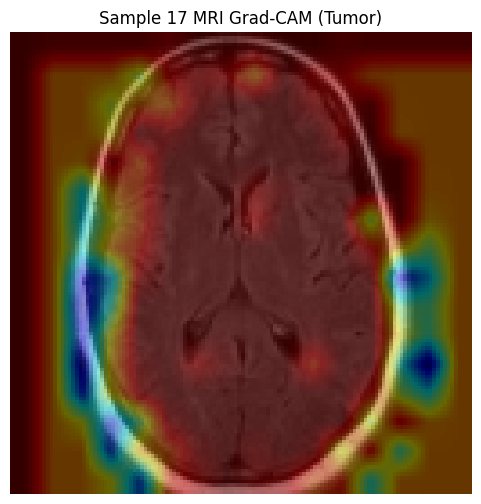


--- Sample 18: True Label: Healthy, Predicted Label: Healthy ---
  CT Path: /content/Dataset/Brain Tumor CT scan Images/Healthy/ct_healthy (506).png
  MRI Path: /content/Dataset/Brain Tumor MRI images/Healthy/mri_healthy (506).jpg
Attention Weights Shape: torch.Size([1, 2, 256, 256])
Attention Weights Shape: torch.Size([1, 2, 256, 256])
CT-MRI Attention Weights Shape: torch.Size([1, 2, 256, 256])
MRI-CT Attention Weights Shape: torch.Size([1, 2, 256, 256])
Attention Weights Shape: torch.Size([1, 2, 256, 256])
Attention Weights Shape: torch.Size([1, 2, 256, 256])
CT-MRI Attention Weights Shape: torch.Size([1, 2, 256, 256])
MRI-CT Attention Weights Shape: torch.Size([1, 2, 256, 256])
--- Inside visualize_attention_map ---
Received attention_weights shape: torch.Size([1, 2, 256, 256])
Shape after squeezing batch (ndim=4, size 0=1): torch.Size([2, 256, 256])
Shape after averaging heads: torch.Size([256, 256])
Shape after averaging query patches: torch.Size([256])
Inferred grid size: 16x16

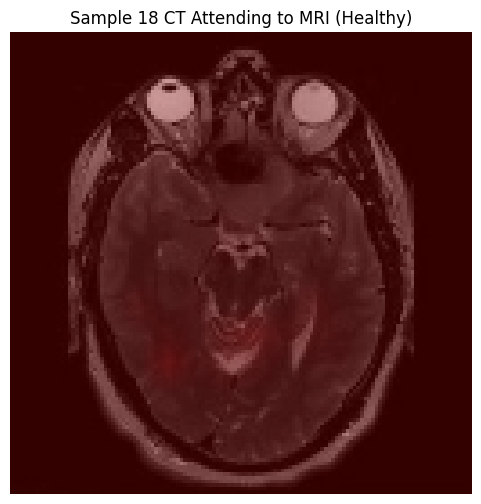

--- Inside visualize_attention_map ---
Received attention_weights shape: torch.Size([1, 2, 256, 256])
Shape after squeezing batch (ndim=4, size 0=1): torch.Size([2, 256, 256])
Shape after averaging heads: torch.Size([256, 256])
Shape after averaging query patches: torch.Size([256])
Inferred grid size: 16x16, Num patches: 256


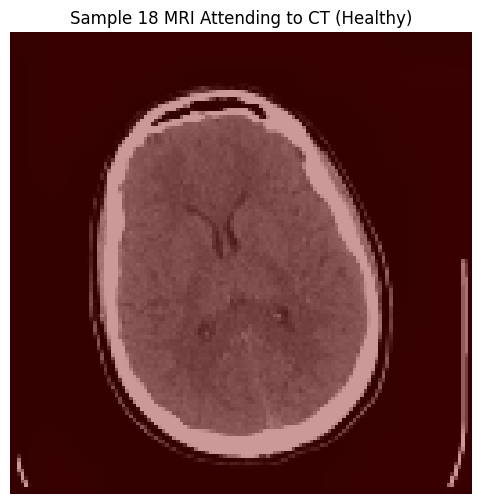

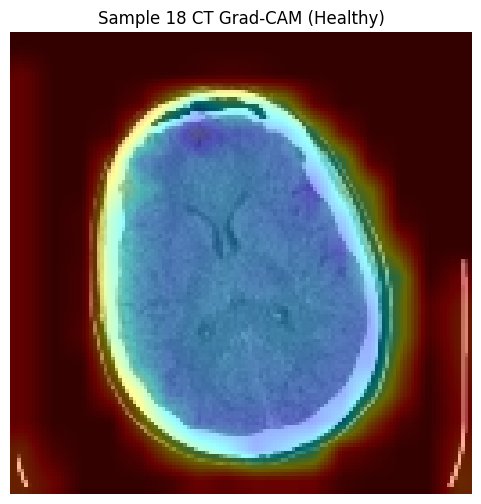

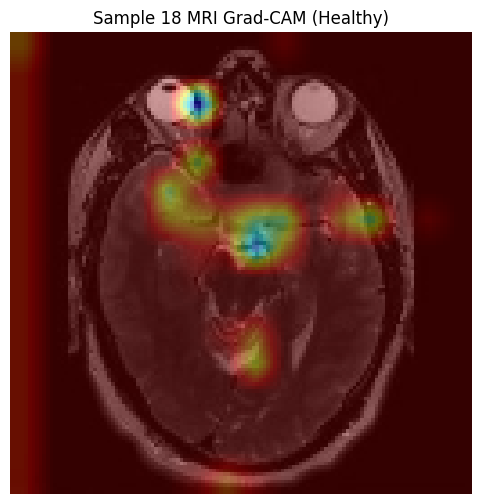


--- Sample 19: True Label: Healthy, Predicted Label: Healthy ---
  CT Path: /content/Dataset/Brain Tumor CT scan Images/Healthy/ct_healthy (114).png
  MRI Path: /content/Dataset/Brain Tumor MRI images/Healthy/mri_healthy (114).jpg
Attention Weights Shape: torch.Size([1, 2, 256, 256])
Attention Weights Shape: torch.Size([1, 2, 256, 256])
CT-MRI Attention Weights Shape: torch.Size([1, 2, 256, 256])
MRI-CT Attention Weights Shape: torch.Size([1, 2, 256, 256])
Attention Weights Shape: torch.Size([1, 2, 256, 256])
Attention Weights Shape: torch.Size([1, 2, 256, 256])
CT-MRI Attention Weights Shape: torch.Size([1, 2, 256, 256])
MRI-CT Attention Weights Shape: torch.Size([1, 2, 256, 256])
--- Inside visualize_attention_map ---
Received attention_weights shape: torch.Size([1, 2, 256, 256])
Shape after squeezing batch (ndim=4, size 0=1): torch.Size([2, 256, 256])
Shape after averaging heads: torch.Size([256, 256])
Shape after averaging query patches: torch.Size([256])
Inferred grid size: 16x16

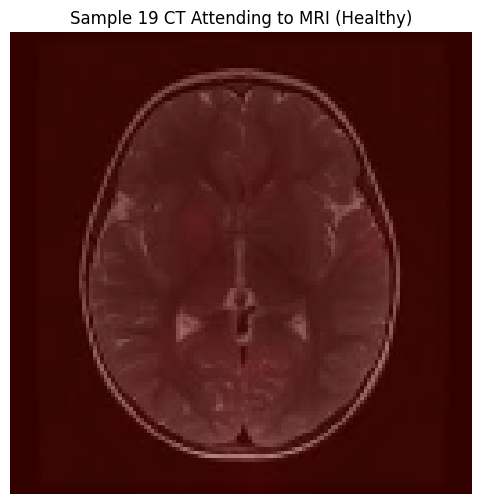

--- Inside visualize_attention_map ---
Received attention_weights shape: torch.Size([1, 2, 256, 256])
Shape after squeezing batch (ndim=4, size 0=1): torch.Size([2, 256, 256])
Shape after averaging heads: torch.Size([256, 256])
Shape after averaging query patches: torch.Size([256])
Inferred grid size: 16x16, Num patches: 256


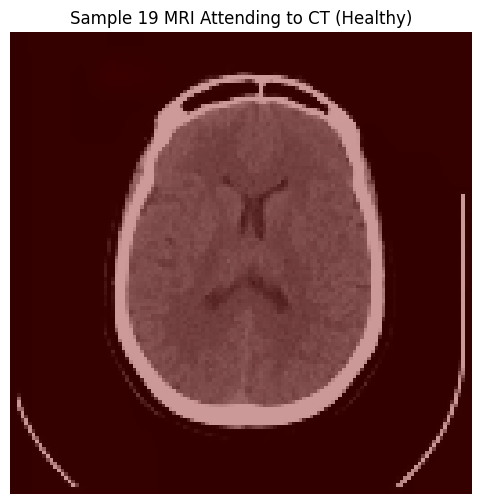

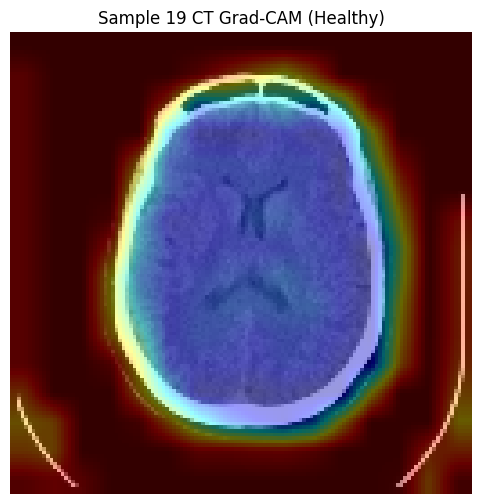

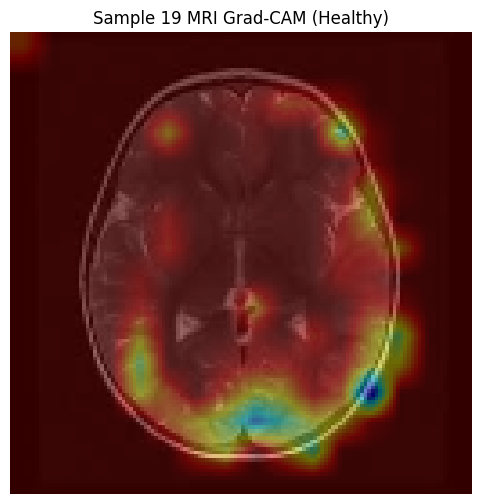


--- Sample 20: True Label: Healthy, Predicted Label: Healthy ---
  CT Path: /content/Dataset/Brain Tumor CT scan Images/Healthy/ct_healthy (545).jpg
  MRI Path: /content/Dataset/Brain Tumor MRI images/Healthy/mri_healthy (545).jpg
Attention Weights Shape: torch.Size([1, 2, 256, 256])
Attention Weights Shape: torch.Size([1, 2, 256, 256])
CT-MRI Attention Weights Shape: torch.Size([1, 2, 256, 256])
MRI-CT Attention Weights Shape: torch.Size([1, 2, 256, 256])
Attention Weights Shape: torch.Size([1, 2, 256, 256])
Attention Weights Shape: torch.Size([1, 2, 256, 256])
CT-MRI Attention Weights Shape: torch.Size([1, 2, 256, 256])
MRI-CT Attention Weights Shape: torch.Size([1, 2, 256, 256])
--- Inside visualize_attention_map ---
Received attention_weights shape: torch.Size([1, 2, 256, 256])
Shape after squeezing batch (ndim=4, size 0=1): torch.Size([2, 256, 256])
Shape after averaging heads: torch.Size([256, 256])
Shape after averaging query patches: torch.Size([256])
Inferred grid size: 16x16

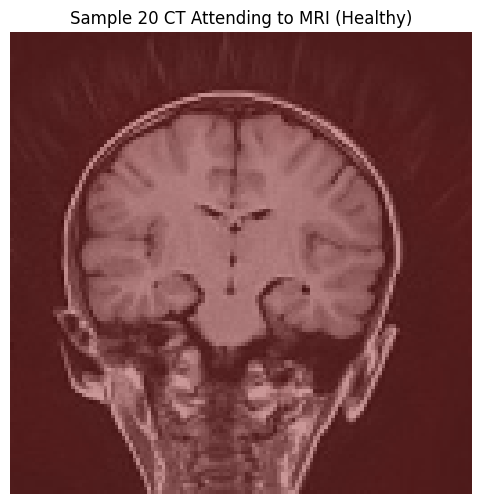

--- Inside visualize_attention_map ---
Received attention_weights shape: torch.Size([1, 2, 256, 256])
Shape after squeezing batch (ndim=4, size 0=1): torch.Size([2, 256, 256])
Shape after averaging heads: torch.Size([256, 256])
Shape after averaging query patches: torch.Size([256])
Inferred grid size: 16x16, Num patches: 256


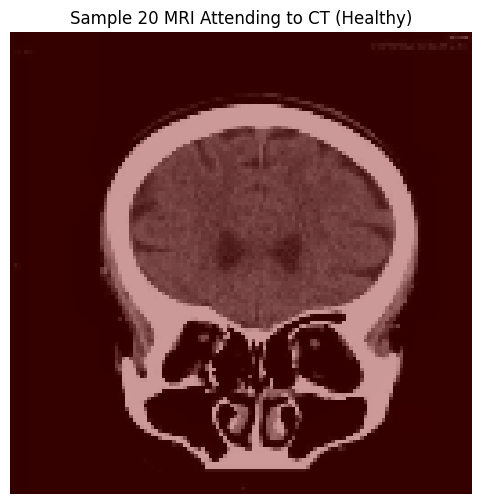

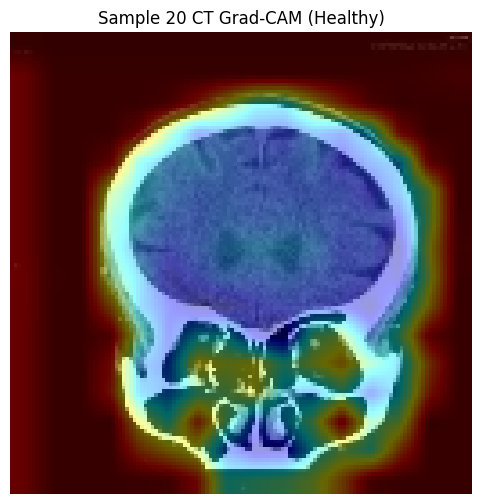

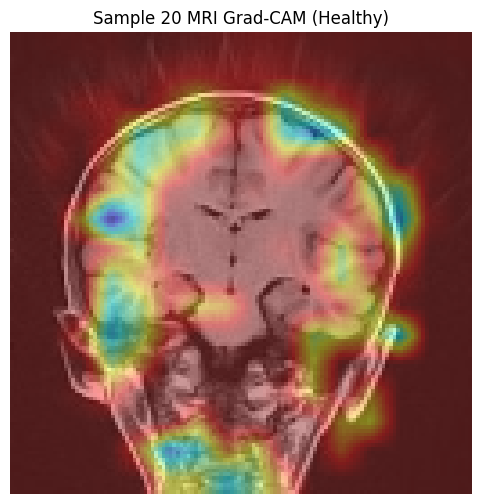

In [ ]:
# @title
# Initialize Grad-CAM instances for both the CT and MRI encoders
# Selecting the last convolutional layer in each encoder as the target layer
grad_cam_ct = GradCAM(trained_model, trained_model.cnn_ct.conv[-1])
grad_cam_mri = GradCAM(trained_model, trained_model.cnn_mri.conv[-1])

# Use the select_sample_images_for_visualization function to get sample details
if 'select_sample_images_for_visualization' in globals() and \
   'test_paired_loader' in globals() and test_paired_loader is not None and \
   'trained_model' in globals() and trained_model is not None and \
   'categories' in globals() and 'test_paired_df' in globals() and test_paired_df is not None:

    print("\nSelecting sample images and collecting details for visualization...")

    # Call the function to get sample details including paths, labels, predictions, and attention
    sample_results = select_sample_images_for_visualization(
        test_paired_loader,
        trained_model,
        categories,
        test_paired_df, # Pass the dataframe
        num_samples_to_select=20, # Adjust number of samples as needed
        device="cuda" if torch.cuda.is_available() else "cpu"
    )

    print(f"Collected details for {len(sample_results)} samples.")
    print("\nGenerating and visualizing Attention and Grad-CAM heatmaps for sample images...")

    # Iterate through the collected sample results and visualize:
    if sample_results:
        for i, result in enumerate(sample_results):
            ct_path = result['ct_path']
            mri_path = result['mri_path']
            # True label is already in the result dictionary from select_sample_images_for_visualization
            true_label = result['true_label']
            # Predicted label is already in the result dictionary from select_sample_images_for_visualization
            predicted_label = result['predicted_label']

            ct_mri_attn = result['ct_mri_attention']
            mri_ct_attn = result['mri_ct_attention']

            if predicted_label is not None:
                predicted_label_name = categories[predicted_label]
            else:
                predicted_label_name = "N/A (Image Load Error)"

            print(f"\n--- Sample {i+1}: True Label: {categories[true_label]}, Predicted Label: {predicted_label_name} ---")
            print(f"  CT Path: {ct_path}")
            print(f"  MRI Path: {mri_path}")


            ct_heatmap_np = None
            mri_heatmap_np = None

            # If the prediction was successful (predicted label is not None), load and preprocess the images separately for Grad-CAM.
            if predicted_label is not None:
                # Load and preprocess images specifically for Grad-CAM input (requires batch dimension)
                ct_image_tensor_gc = load_and_preprocess_image(ct_path)
                mri_image_tensor_gc = load_and_preprocess_image(mri_path)

                if ct_image_tensor_gc is not None and mri_image_tensor_gc is not None:
                     # Add batch dimension and move to device
                     ct_image_tensor_gc = ct_image_tensor_gc.unsqueeze(0).to(device)
                     mri_image_tensor_gc = mri_image_tensor_gc.unsqueeze(0).to(device)

                     # Use the predicted label for Grad-CAM target category
                     # GradCAM expects a tuple of inputs
                     ct_heatmap_np, _ = grad_cam_ct((ct_image_tensor_gc, mri_image_tensor_gc), target_category=predicted_label)
                     mri_heatmap_np, _ = grad_cam_mri((ct_image_tensor_gc, mri_image_tensor_gc), target_category=predicted_label)

                else:
                    print(f"Warning: Could not load preprocessed tensors for Grad-CAM for sample {i+1}.")


            # Visualize CT Attending to MRI (Overlay on MRI image)
            # The visualize_attention_map function expects attention_weights with shape [1, num_heads, seq_len_q, seq_len_k]
            if ct_mri_attn is not None and torch.is_tensor(ct_mri_attn) and ct_mri_attn.ndim == 4 and ct_mri_attn.size(0) == 1:
                 visualize_attention_map(
                     mri_path, # Overlay on MRI image (as CT is attending to MRI)
                     ct_mri_attn, # Pass the full tensor [1, num_heads, seq_len_ct, seq_len_mri]
                     patch_size=16, img_size=(128, 128),
                     title=f"Sample {i+1} CT Attending to MRI ({predicted_label_name})"
                 )
            else:
                 print(f"Could not visualize CT attention to MRI for Sample {i+1}. Attention weights shape: {ct_mri_attn.shape if ct_mri_attn is not None and torch.is_tensor(ct_mri_attn) else 'None'}")


            # Visualize MRI Attending to CT (Overlay on CT image)
            # The visualize_attention_map function expects attention_weights with shape [1, num_heads, seq_len_q, seq_len_k]
            if mri_ct_attn is not None and torch.is_tensor(mri_ct_attn) and mri_ct_attn.ndim == 4 and mri_ct_attn.size(0) == 1:
                 visualize_attention_map(
                     ct_path, # Overlay on CT image (as MRI is attending to CT)
                     mri_ct_attn, # Pass the full tensor [1, num_heads, seq_len_mri, seq_len_ct]
                     patch_size=16, img_size=(128, 128),
                     title=f"Sample {i+1} MRI Attending to CT ({predicted_label_name})"
                 )
            else:
                 print(f"Could not visualize MRI attention to CT for Sample {i+1}. Attention weights shape: {mri_ct_attn.shape if mri_ct_attn is not None and torch.is_tensor(mri_ct_attn) else 'None'}")


            # Visualize CT Grad-CAM Heatmap
            if ct_heatmap_np is not None:
                 visualize_gradcam_heatmap(
                     ct_path,
                     ct_heatmap_np, # visualize_gradcam_heatmap expects numpy array
                     img_size=(128, 128),
                     title=f"Sample {i+1} CT Grad-CAM ({predicted_label_name})"
                 )
            else:
                 print(f"Could not visualize CT Grad-CAM heatmap for Sample {i+1}.")


            # Visualize MRI Grad-CAM Heatmap
            if mri_heatmap_np is not None:
                 visualize_gradcam_heatmap(
                     mri_path,
                     mri_heatmap_np, # visualize_gradcam_heatmap expects numpy array
                     img_size=(128, 128),
                     title=f"Sample {i+1} MRI Grad-CAM ({predicted_label_name})"
                 )
            else:
                 print(f"Could not visualize MRI Grad-CAM heatmap for Sample {i+1}.")

    else:
        print("No sample results available for visualization. Please check the sample selection step.")

else:
    print("Error: Required variables/functions (select_sample_images_for_visualization, test_paired_loader, trained_model, categories, test_paired_df) are not defined.")

Calling function of attention map sideby side

--- Visualizing Attention Maps Side by Side ---
CT Attending to MRI Attention Shape: torch.Size([1, 2, 256, 256])
MRI Attending to CT Attention Shape: torch.Size([1, 2, 256, 256])
Saved attention visualization at: attention_maps.png


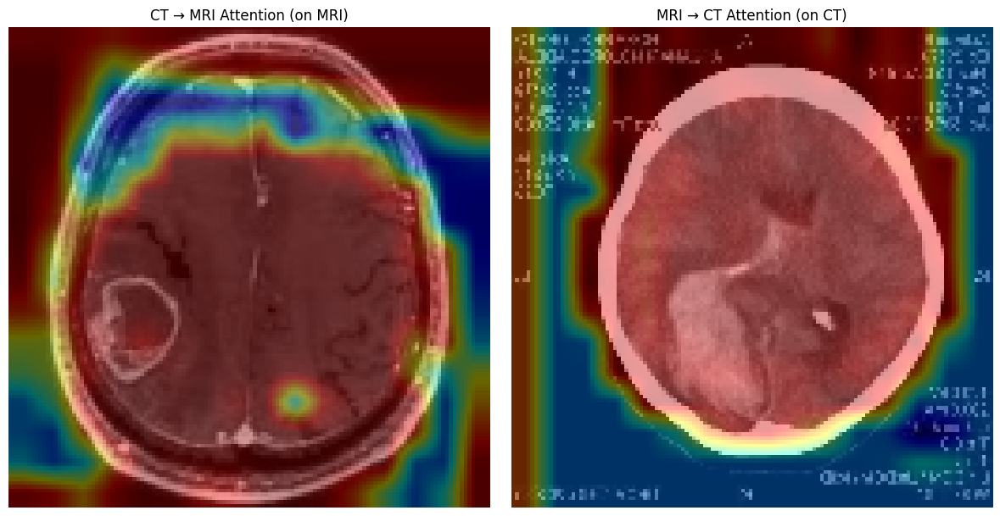

In [ ]:
# @title
visualize_attention_maps_side_by_side(
    ct_image_path="/content/Dataset/Brain Tumor CT scan Images/Tumor/ct_tumor (72).jpg",
    mri_image_path="/content/Dataset/Brain Tumor MRI images/Tumor/tumor (72).jpg",
    ct_mri_attn=ct_mri_attn,
    mri_ct_attn=mri_ct_attn,
    save_path="attention_maps.png"
)

Task -  Feature Maps visualization

Code block to hook on CNN concolution layer to generate feature maps for 1 sample image pair

In [ ]:
# @title
# Ensure the trained_final_model is available and on the correct device
device = "cuda" if torch.cuda.is_available() else "cpu"

# Assuming trained_final_model is loaded and available from previous cells
# If not, you might need to load it:
# from LightweightDualCrossModalTransformer import LightweightDualCrossModalTransformer # Assuming your model class is defined
# trained_final_model = LightweightDualCrossModalTransformer(embed_dim=64, num_heads=2, num_classes=2).to(device) # Use the correct model parameters
# trained_final_model.load_state_dict(torch.load('final_best_model_with_aug.pth', map_location=device))
# trained_final_model.eval() # Set to evaluation mode

if 'trained_model' not in globals() or trained_model is None:
    print("Error: trained_final_model is not defined or loaded. Please ensure the model is loaded before proceeding.")
else:
    # Select a sample image path (e.g., the first CT image from the test set)
    if not test_paired_df.empty:
        sample_ct_image_path = test_paired_df.iloc[0]['ct_image_path']
        sample_mri_image_path = test_paired_df.iloc[0]['mri_image_path']
        sample_true_label = categories[test_paired_df.iloc[0]['category_encoded']] # Assuming categories is defined

        print(f"Selected sample CT image: {sample_ct_image_path}")
        print(f"Selected sample MRI image: {sample_mri_image_path}")
        print(f"True Label: {sample_true_label}")


        # Load and preprocess the sample CT image
        # Use the load_and_preprocess_image function defined previously (e.g., in cell az4LU9rVuNlJ)
        ct_image_tensor = load_and_preprocess_image(sample_ct_image_path)
        mri_image_tensor = load_and_preprocess_image(sample_mri_image_path)

        if ct_image_tensor is not None and mri_image_tensor is not None:
            # Add batch dimension and move to device
            ct_image_tensor = ct_image_tensor.unsqueeze(0).to(device)
            mri_image_tensor = mri_image_tensor.unsqueeze(0).to(device)

            # Extract the CNN encoder
            ct_cnn_encoder = trained_model.cnn_ct
            mri_cnn_encoder = trained_model.cnn_mri


            # Define a hook to capture the output (feature maps) of the last convolutional layer
            feature_maps = {}
            def hook_fn(module, input, output):
                feature_maps['output'] = output.detach().cpu() # Capture and detach output

            # Register the hook on the last conv layer of the CT CNN encoder
            # The last layer is self.conv[-1] in the CNNEncoder definition
            hook = ct_cnn_encoder.conv[-1].register_forward_hook(hook_fn)

            # Perform a forward pass through the CT CNN encoder with the sample image
            # We only need to pass the image through the encoder to get the feature maps
            with torch.no_grad():
                _ = ct_cnn_encoder(ct_image_tensor) # The hook will capture the output

            # Remove the hook after capturing the feature maps
            hook.remove()

            print(f"Captured feature maps from CT CNN encoder with shape: {feature_maps['output'].shape}")

            # Now, visualize the captured feature maps (next step in the plan)

        else:
            print("Error: Could not load or preprocess the sample image.")
    else:
        print("Error: test_paired_df is empty. Cannot select a sample image.")

Selected sample CT image: /content/Dataset/Brain Tumor CT scan Images/Tumor/ct_tumor (531).jpg
Selected sample MRI image: /content/Dataset/Brain Tumor MRI images/Tumor/tumor (531).jpg
True Label: Tumor
Captured feature maps from CT CNN encoder with shape: torch.Size([1, 32, 16, 16])


Code block the defines function to generate Fused Feature maps and calling function that generates for a sample image pair


Generating and visualizing spatial fused feature heatmap for the sample image pair...
Attention Weights Shape: torch.Size([1, 2, 256, 256])
Attention Weights Shape: torch.Size([1, 2, 256, 256])
CT-MRI Attention Weights Shape: torch.Size([1, 2, 256, 256])
MRI-CT Attention Weights Shape: torch.Size([1, 2, 256, 256])
--- Visualizing Spatial Fused Heatmap for: Spatial Fused Feature Heatmap (Overlay on CT) ---
Received spatial_fused_features shape: torch.Size([1, 64, 16, 16])


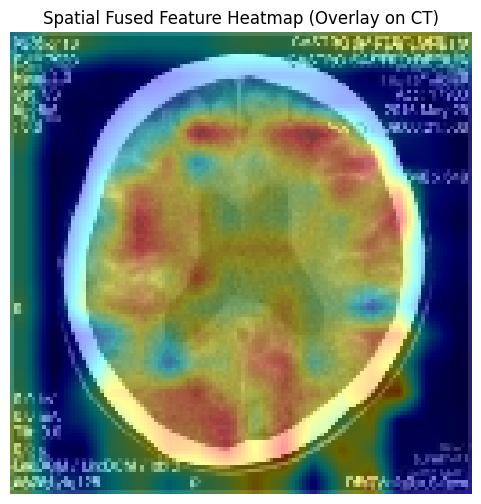

--- Visualizing Spatial Fused Heatmap for: Spatial Fused Feature Heatmap (Overlay on MRI) ---
Received spatial_fused_features shape: torch.Size([1, 64, 16, 16])


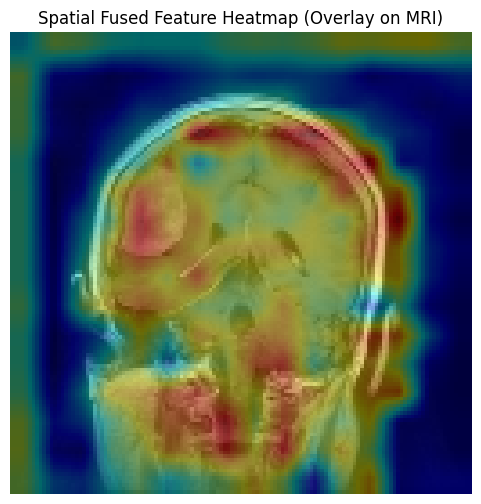

In [ ]:
# @title
import matplotlib.pyplot as plt
import numpy as np
import cv2
import torch

def visualize_spatial_fused_heatmap(original_image_path, spatial_fused_features, img_size=(128, 128), title="Spatial Fused Feature Heatmap"):
    """
    Visualizes spatial fused features as a heatmap overlaid on an original image.

    Args:
        original_image_path (str): Path to the original image file (CT or MRI).
        spatial_fused_features (torch.Tensor): Spatial fused features (shape [B=1, Channels, H', W']).
        img_size (tuple): Size of the image used for model input (width, height).
        title (str): Title for the plot.
    """
    print(f"--- Visualizing Spatial Fused Heatmap for: {title} ---")
    print(f"Received spatial_fused_features shape: {spatial_fused_features.shape if spatial_fused_features is not None else 'None'}")

    original_image = cv2.imread(original_image_path, cv2.IMREAD_GRAYSCALE)
    if original_image is None:
        print(f"Warning: Could not load image for visualization at {original_image_path}")
        return

    original_image = cv2.resize(original_image, img_size)
    original_image = cv2.cvtColor(original_image, cv2.COLOR_GRAY2RGB) # Convert to RGB for heatmap overlay

    if spatial_fused_features is None or spatial_fused_features.ndim != 4 or spatial_fused_features.size(0) != 1:
         print(f"Error: Spatial fused features are not in the expected shape [1, Channels, H', W']. Shape: {spatial_fused_features.shape if spatial_fused_features is not None else 'None'}")
         return

    # Squeeze batch dimension
    spatial_fused_features_squeezed = spatial_fused_features.squeeze(0) # Shape [Channels, H', W']

    # Reduce channel dimension (e.g., via mean) to get a single spatial map [H', W']
    # You could also use PCA or other methods here if preferred
    heatmap = torch.mean(spatial_fused_features_squeezed, dim=0) # Shape [H', W']

    # Normalize the heatmap to [0, 1]
    heatmap_min = torch.min(heatmap)
    heatmap_max = torch.max(heatmap)
    # Add a small epsilon to avoid division by zero if max == min
    epsilon = 1e-8
    normalized_heatmap = (heatmap - heatmap_min) / (heatmap_max - heatmap_min + epsilon)

    # Convert to numpy and resize to original image size
    heatmap_np = normalized_heatmap.cpu().detach().numpy()
    heatmap_resized = cv2.resize(heatmap_np, img_size)
    heatmap_resized = np.uint8(255 * heatmap_resized)
    heatmap_colored = cv2.applyColorMap(heatmap_resized, cv2.COLORMAP_JET)

    # Superimpose heatmap on original image
    superimposed_img = cv2.addWeighted(original_image, 0.6, heatmap_colored, 0.4, 0)

    plt.figure(figsize=(6, 6))
    plt.imshow(superimposed_img)
    plt.title(title)
    plt.axis('off')
    plt.show()

# --- Example Usage (requires sample image paths and the trained model) ---

# Assuming you have sample_ct_image_path, sample_mri_image_path, and trained_final_model loaded

if 'trained_model' not in globals() or trained_model is None:
    print("Error: trained_final_model is not defined or loaded. Cannot visualize spatial fused features.")
elif 'sample_ct_image_path' not in globals() or 'sample_mri_image_path' not in globals():
     print("Error: Sample image paths not defined. Cannot visualize spatial fused features.")
elif 'load_and_preprocess_image' not in globals():
     print("Error: load_and_preprocess_image function not defined. Please run the cell defining it.")

else:
    device = "cuda" if torch.cuda.is_available() else "cpu"
    print(f"\nGenerating and visualizing spatial fused feature heatmap for the sample image pair...")

    # Load and preprocess sample images
    ct_image_tensor = load_and_preprocess_image(sample_ct_image_path).unsqueeze(0).to(device)
    mri_image_tensor = load_and_preprocess_image(sample_mri_image_path).unsqueeze(0).to(device)

    if ct_image_tensor is not None and mri_image_tensor is not None:
        # Perform forward pass through the modified model
        trained_model.eval() # Set model to evaluation mode
        with torch.no_grad():
            # The modified model returns (logits, fused_pooled, spatial_fused_features, ct_mri_attn_weights, mri_ct_attn_weights)
            model_output = trained_model(ct_image_tensor, mri_image_tensor)

            # Extract spatial fused features (assuming it's the third element in the tuple)
            spatial_fused_features = model_output[2]

            # Use either original image for overlay (e.g., CT image)
            visualize_spatial_fused_heatmap(
                sample_ct_image_path,
                spatial_fused_features,
                img_size=(128, 128),
                title="Spatial Fused Feature Heatmap (Overlay on CT)"
            )

            # You can also overlay on the MRI image if desired
            visualize_spatial_fused_heatmap(
                sample_mri_image_path,
                spatial_fused_features,
                img_size=(128, 128),
                title="Spatial Fused Feature Heatmap (Overlay on MRI)"
            )

    else:
        print("Could not load or preprocess sample images for spatial fused feature visualization.")

Function that defines Feature Map generation for an image - Single Modality. Calling functionn that does for a sample image


Visualizing 32 feature maps...


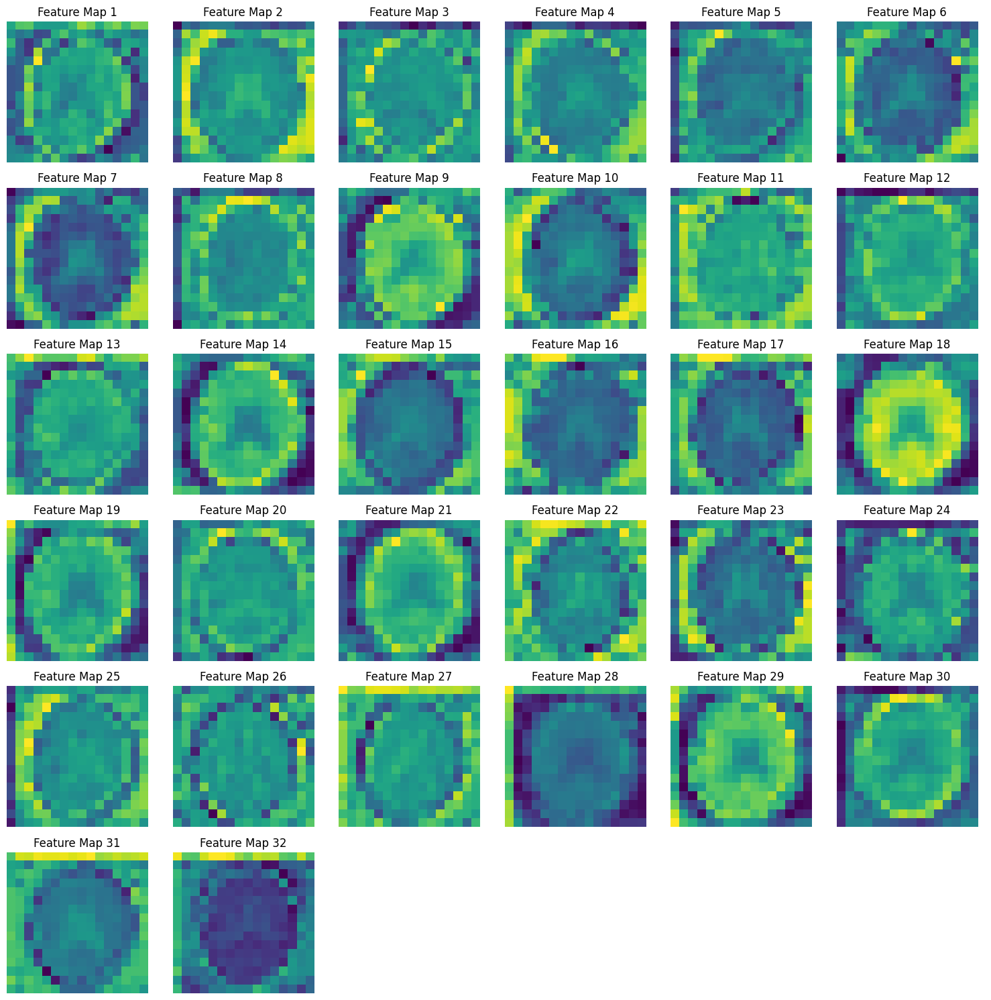

In [ ]:
# @title
import matplotlib.pyplot as plt
import numpy as np

# Visualize the captured feature maps
if 'feature_maps' in globals() and 'output' in feature_maps and feature_maps['output'] is not None:
    # The captured output is a tensor of shape [Batch_size, Channels, Height, Width]
    # Since we processed a single image, Batch_size is 1.
    feature_maps_tensor = feature_maps['output'].squeeze(0) # Remove the batch dimension [Channels, Height, Width]

    num_feature_maps = feature_maps_tensor.size(0)
    print(f"\nVisualizing {num_feature_maps} feature maps...")

    # Determine the grid size for plotting (e.g., square grid)
    grid_size = int(np.ceil(np.sqrt(num_feature_maps)))
    fig, axes = plt.subplots(grid_size, grid_size, figsize=(15, 15))
    axes = axes.flatten() # Flatten the 2D array of axes for easy iteration

    for i in range(num_feature_maps):
        if i < len(axes): # Ensure we don't exceed the number of subplots
            ax = axes[i]
            # Get the i-th feature map and convert it to a numpy array
            feature_map = feature_maps_tensor[i].numpy()

            # Display the feature map
            ax.imshow(feature_map, cmap='viridis') # Using 'viridis' cmap for better visibility of activations
            ax.set_title(f'Feature Map {i+1}')
            ax.axis('off')
        else:
            # Hide any unused subplots
            axes[i].axis('off')


    # Hide any remaining unused subplots if num_feature_maps is less than grid_size*grid_size
    for j in range(num_feature_maps, len(axes)):
        axes[j].axis('off')


    plt.tight_layout()
    plt.show()

else:
    print("Feature maps not available for visualization. Please run the previous cell to capture them.")

Cosine similarity

In [ ]:
# @title
# Required imports
import torch
import torch.nn.functional as F
import matplotlib.pyplot as plt
import numpy as np

def cosine_similarity_matrix(a, b, eps=1e-8):
    """
    a: [N, d]
    b: [M, d]
    returns: [N, M] cosine similarity
    """
    # normalize
    a_norm = a / (a.norm(dim=1, keepdim=True) + eps)   # [N, d]
    b_norm = b / (b.norm(dim=1, keepdim=True) + eps)   # [M, d]
    return a_norm @ b_norm.T                           # [N, M]

def compute_and_plot_similarity(T_ct, T_mri, sample_index=0, title_prefix=""):
    """
    T_ct: [B, N, d]
    T_mri: [B, N, d]
    sample_index: which sample in the batch to plot
    """
    device = T_ct.device
    # select one sample
    ct = T_ct[sample_index]    # [N, d]
    mri = T_mri[sample_index]  # [N, d]
    N, d = ct.shape

    # compute similarity matrix [N, N]
    S = cosine_similarity_matrix(ct, mri)  # values in [-1,1]

    # optional: scale to [0,1] for plotting
    S_plot = (S.detach().cpu().numpy() + 1.0) / 2.0

    # plot
    plt.figure(figsize=(8, 7))
    plt.imshow(S_plot, cmap='viridis', aspect='auto', origin='lower')
    plt.colorbar(label='cosine similarity (scaled 0..1)')
    plt.xlabel('MRI patch index (0..N-1)')
    plt.ylabel('CT  patch index (0..N-1)')
    plt.title(f"{title_prefix} CT↔MRI Cosine Similarity (sample {sample_index})")
    plt.tight_layout()
    plt.show()
    return S.detach()

# --- Example usage ---
for ct_img, mri_img, labels in test_paired_loader:
          valid_indices = labels != -1
T_ct_pre, T_mri_pre = tokens before cross-attention  [B,N,d]
T_ct_post, T_mri_post = tokens after cross-attention   [B,N,d]
# Compute and plot for sample 0
S_before = compute_and_plot_similarity(T_ct_pre, T_mri_pre, sample_index=0, title_prefix="Before Fusion")
S_after  = compute_and_plot_similarity(T_ct_post, T_mri_post, sample_index=0, title_prefix="After Fusion")


SyntaxError: invalid syntax (ipython-input-3164617844.py, line 51)

Calculate and display the accuracy, confusion matrix, precision, recall, and F1-score using the true and predicted labels obtained in the previous step.

In [ ]:
# @title

# Calculate Accuracy
# Get true and predicted labels once
all_true_labels, all_predicted_labels, _ = predict_labels(trained_model)


# Calculate Accuracy
accuracy = accuracy_score(all_true_labels, all_predicted_labels)
print(f"Accuracy: {accuracy:.4f}")

# Calculate the confusion matrix
conf_matrix = confusion_matrix(all_true_labels, all_predicted_labels)

# Calculate precision, recall, and F1-score
# Assuming binary classification, positive class is 1
precision = precision_score(all_true_labels, all_predicted_labels, average='binary')
recall = recall_score(all_true_labels, all_predicted_labels, average='binary')
f1 = f1_score(all_true_labels, all_predicted_labels, average='binary')


print("Confusion Matrix:")
print(conf_matrix)
print(f"\nPrecision: {precision:.4f}")
print(f"Recall:    {recall:.4f}")
print(f"F1-score:  {f1:.4f}")

Predicting labels for the test set...
Attention Weights Shape: torch.Size([16, 2, 256, 256])
Attention Weights Shape: torch.Size([16, 2, 256, 256])
CT-MRI Attention Weights Shape: torch.Size([16, 2, 256, 256])
MRI-CT Attention Weights Shape: torch.Size([16, 2, 256, 256])
Attention Weights Shape: torch.Size([16, 2, 256, 256])
Attention Weights Shape: torch.Size([16, 2, 256, 256])
CT-MRI Attention Weights Shape: torch.Size([16, 2, 256, 256])
MRI-CT Attention Weights Shape: torch.Size([16, 2, 256, 256])
Attention Weights Shape: torch.Size([16, 2, 256, 256])
Attention Weights Shape: torch.Size([16, 2, 256, 256])
CT-MRI Attention Weights Shape: torch.Size([16, 2, 256, 256])
MRI-CT Attention Weights Shape: torch.Size([16, 2, 256, 256])
Attention Weights Shape: torch.Size([16, 2, 256, 256])
Attention Weights Shape: torch.Size([16, 2, 256, 256])
CT-MRI Attention Weights Shape: torch.Size([16, 2, 256, 256])
MRI-CT Attention Weights Shape: torch.Size([16, 2, 256, 256])
Attention Weights Shape: t

Function definition to calculate and plot the ROC curve and AUC score using the true labels and the model's predicted probabilities (logits) for the positive class.

In [ ]:
# @title
# calculate ROC curve and AUC, with the predicted probabilities (logits)
def calculate_ROC(trained_model, test_paired_loader, device):
  all_logits = []
  all_true_labels = [] # Initialize list for true labels
  trained_model.eval()
  with torch.no_grad():
      for original_indices, ct_img, mri_img, labels in test_paired_loader: # Unpack original_indices
          # Move tensors to the correct device
          ct_img, mri_img = ct_img.to(device), mri_img.to(device)
          # Model now returns a tuple (logits, ct_mri_attn_weights, mri_ct_attn_weights)
          model_output = trained_model(ct_img, mri_img)
          logits = model_output[0] # Extract the logits tensor
          all_logits.extend(logits.cpu().numpy())
          all_true_labels.extend(labels.cpu().numpy()) # Collect true labels

  all_logits = np.array(all_logits)
  all_true_labels = np.array(all_true_labels) # Convert true labels list to numpy array


  # Get the probabilities for the positive class (class 1)
  all_probabilities = torch.softmax(torch.tensor(all_logits), dim=1)[:, 1].numpy()
  return all_true_labels, all_probabilities

Calling function that generate ROC , AUC

Attention Weights Shape: torch.Size([16, 2, 256, 256])
Attention Weights Shape: torch.Size([16, 2, 256, 256])
CT-MRI Attention Weights Shape: torch.Size([16, 2, 256, 256])
MRI-CT Attention Weights Shape: torch.Size([16, 2, 256, 256])
Attention Weights Shape: torch.Size([16, 2, 256, 256])
Attention Weights Shape: torch.Size([16, 2, 256, 256])
CT-MRI Attention Weights Shape: torch.Size([16, 2, 256, 256])
MRI-CT Attention Weights Shape: torch.Size([16, 2, 256, 256])
Attention Weights Shape: torch.Size([16, 2, 256, 256])
Attention Weights Shape: torch.Size([16, 2, 256, 256])
CT-MRI Attention Weights Shape: torch.Size([16, 2, 256, 256])
MRI-CT Attention Weights Shape: torch.Size([16, 2, 256, 256])
Attention Weights Shape: torch.Size([16, 2, 256, 256])
Attention Weights Shape: torch.Size([16, 2, 256, 256])
CT-MRI Attention Weights Shape: torch.Size([16, 2, 256, 256])
MRI-CT Attention Weights Shape: torch.Size([16, 2, 256, 256])
Attention Weights Shape: torch.Size([16, 2, 256, 256])
Attention

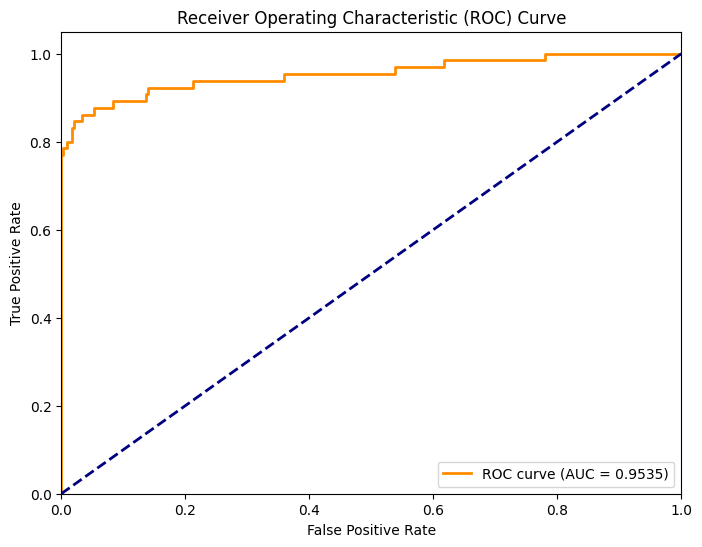

AUC: 0.9535


In [ ]:
# @title
from sklearn.metrics import roc_curve, auc # Import roc_curve and auc

# Calculate ROC curve and AUC
# The calculate_ROC function returns all_true_labels and all_probabilities
all_true_labels, all_probabilities = calculate_ROC(trained_model, test_paired_loader, device)

fpr, tpr, thresholds = roc_curve(all_true_labels, all_probabilities)
roc_auc = auc(fpr, tpr)

# Plot the ROC curve
plt.figure(figsize=(8, 6))
plt.plot(fpr, tpr, color='darkorange', lw=2, label=f'ROC curve (AUC = {roc_auc:.4f})')
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc="lower right")
plt.show()

print(f"AUC: {roc_auc:.4f}")

Generate predictions, attention weights, and Grad-CAM heatmaps for the selected sample paired images. This involves iterating through the sample images, predicting the class label, and then generating Grad-CAM heatmaps for both the CT and MRI images based on the predicted class. Finally, visualize the original images overlaid with attention maps and Grad-CAM heatmaps.

In [ ]:
# @title
import torch
import torch.nn as nn
import torch.nn.functional as F

class GradCAM:
    def __init__(self, model, target_layer):
        self.model = model
        self.target_layer = target_layer
        self.gradients = None
        self.activations = None

        # Register hooks
        self.target_layer.register_forward_hook(self._save_activation)
        self.target_layer.register_full_backward_hook(self._save_gradient)

    def _save_activation(self, module, input, output):
        self.activations = output.detach()

    def _save_gradient(self, module, grad_input, grad_output):
        # grad_output is a tuple, we need the gradient with respect to the output of the layer
        self.gradients = grad_output[0].detach()

    def __call__(self, inputs, target_category=None):
        # Clear previous gradients
        if hasattr(self.model, 'zero_grad'):
            self.model.zero_grad()
        else:
             # cases where the model might not have a zero_grad method directly
             for param in self.model.parameters():
                  if param.grad is not None:
                      param.grad.zero_()

        # Ensure inputs is a tuple even for single modality models for consistency
        if not isinstance(inputs, tuple):
             inputs = (inputs,)

        # Forward pass
        # Pass inputs to the model depending on how many inputs it expects
        if len(inputs) == 2:
             outputs = self.model(inputs[0], inputs[1])
        elif len(inputs) == 1:
             outputs = self.model(inputs[0])
        else:
             raise ValueError(f"Model expects 1 or 2 inputs, but received {len(inputs)}")


        # Assuming the model returns logits as the first element if it's a tuple
        if isinstance(outputs, tuple):
            logits = outputs[0]
        else:
            logits = outputs # Assume the output is logits if not a tuple

        # Get the predicted category if target_category is not specified
        if target_category is None:
            target_category = torch.argmax(logits, dim=1)
        else:
            # Convert target_category to a tensor if it's not already
            if not isinstance(target_category, torch.Tensor):
                target_category = torch.tensor(target_category, device=logits.device) # Ensure device matches logits

        # Handle potential multiple batch items for target_category
        if target_category.ndim == 0:
             target_category = target_category.unsqueeze(0) # Add batch dim if missing

        # Compute the loss for the target category
        # We need to select the score for the target class and backpropagate
        loss = torch.sum(logits * F.one_hot(target_category, num_classes=logits.size(-1)).float())

        # Backward pass
        loss.backward()

        # Check if gradients and activations were captured
        if self.gradients is None or self.activations is None:
             print("Error: Gradients or activations were not captured. Check if the target_layer is correctly registered and part of the computation graph.")
             return None, None # Return None heatmaps if capture failed

        # Get the gradients and activations
        gradients = self.gradients
        activations = self.activations

        # Handle potential batch size mismatch if gradients or activations have different batch sizes than inputs
        if gradients.size(0) != inputs[0].size(0) or activations.size(0) != inputs[0].size(0):
             print(f"Warning: Batch size mismatch between inputs ({inputs[0].size(0)}), gradients ({gradients.size(0)}), and activations ({activations.size(0)}).")
             # Attempt to proceed with the smallest batch size, or handle as an error
             min_batch_size = min(inputs[0].size(0), gradients.size(0), activations.size(0))
             gradients = gradients[:min_batch_size]
             activations = activations[:min_batch_size]
             # Adjust target_category if needed
             target_category = target_category[:min_batch_size]

        # Global Average Pooling of gradients
        # Average across spatial dimensions (assuming [B, C, H, W])
        # If gradients are [B, N_patches, D], average over N_patches
        if gradients.ndim == 4: # Standard CNN output
             pooled_gradients = torch.mean(gradients, dim=[2, 3], keepdim=True) # Shape [B, C, 1, 1]
        elif gradients.ndim == 3: # Transformer patch embeddings [B, N_patches, D]
             # Need to reshape gradients to spatial dimensions based on patch/grid size
             # A simpler approach for transformer patch gradients is to average over patches
             print("Warning: Gradients from transformer patches (3D). Averaging over patches instead of spatial pooling.")
             pooled_gradients = torch.mean(gradients, dim=1, keepdim=True) # Shape [B, 1, D] - This is not typical for GradCAM on spatial features
             # Reshape gradients to spatial
             # Let's assume the CNNEncoder output before flatten was [B, C, H', W']
             # N_patches = H' * W'
             # D = embed_dim
             # The gradients from the transformer layer are [B, N_patches, D]
             # We need to reshape these gradients back to [B, C, H', W'] where C is the last CNN channel count (embed_dim)
             # And H', W' are the spatial dimensions after the last conv layer.
             # From CNNEncoder definition: 3 conv layers with stride 2. Image size 128x128.
             # 128 -> 64 -> 32 -> 16
             # So H'=16, W'=16. Number of patches = 16*16 = 256. embed_dim = 64
             # Reshape gradients from [B, 256, embed_dim] to [B, embed_dim, 16, 16]
             B, N_patches, D = gradients.shape
             H_prime = W_prime = int(N_patches**0.5) # Assuming square grid
             if H_prime * W_prime == N_patches and D == activations.size(1): # Verify dimensions match expected
                  # Reshape gradients from [B, N_patches, D] to [B, D, H', W']
                  gradients_spatial = gradients.transpose(1, 2).reshape(B, D, H_prime, W_prime)
                  # Activations from Conv[-1] are already spatial [B, C, H', W']
                  activations_spatial = activations

                  # Recompute pooled_gradients using spatial gradients
                  pooled_gradients = torch.mean(gradients_spatial, dim=[2, 3], keepdim=True) # Shape [B, D, 1, 1]

                  # Update variables to use spatial versions for the next steps
                  gradients = gradients_spatial
                  activations = activations_spatial

                  # print("Reshaped gradients and activations to spatial for GradCAM.")

             else:
                 print("Could not reshape gradients and activations to spatial for standard GradCAM calculation.")
                 # Fallback: use the non-spatial average pooled gradients if reshaping failed
                 pass


        # Compute the weighted combination of activations
        # If pooled_gradients is [B, C, 1, 1] and activations is [B, C, H, W], broadcasting works.
        # We'll assume the spatial reshape was successful if gradients were 3D and dimensions matched.

        # using spatial gradients/activations:
        if gradients.ndim == 4 and activations.ndim == 4:
             weighted_activations = activations * pooled_gradients # Shape [B, C, H', W']
             # Apply ReLU to the weighted activations
             cam = F.relu(torch.sum(weighted_activations, dim=1, keepdim=True)) # Shape [B, 1, H', W']

             # Normalize the heatmap
             # Avoid division by zero
             cam_min = torch.min(cam.view(cam.size(0), -1), dim=1, keepdim=True)[0].unsqueeze(-1).unsqueeze(-1) # Shape [B, 1, 1, 1]
             cam_max = torch.max(cam.view(cam.size(0), -1), dim=1, keepdim=True)[0].unsqueeze(-1).unsqueeze(-1) # Shape [B, 1, 1, 1]

             # Add a small epsilon to avoid division by zero if max == min
             epsilon = 1e-8
             normalized_cam = (cam - cam_min) / (cam_max - cam_min + epsilon) # Shape [B, 1, H', W']

             # Resize heatmap to the original image size (or the size used for model input)
             # Assuming img_size was (128, 128) for the model input
             img_height, img_width = inputs[0].size(-2), inputs[0].size(-1) # Get height and width from input tensor
             heatmaps = F.interpolate(normalized_cam, size=(img_height, img_width), mode='bilinear', align_corners=False)

             # Return heatmaps for each image in the batch
             # Squeeze the channel dimension (from [B, 1, H, W] to [B, H, W]) and convert to numpy
             heatmaps_np = heatmaps.squeeze(1).cpu().numpy() # Shape [B, H, W]

             # Return raw cam before normalization and resizing as well (optional)
             # raw_cams = cam.squeeze(1).cpu().numpy() # Shape [B, H', W'] # Uncomment if needed

             return heatmaps_np, heatmaps # Return numpy array of heatmaps and tensor heatmaps

        else:
             print("Could not perform standard GradCAM calculation due to incompatible gradient/activation shapes.")
             return None, None

Generate count of paramters of the model

In [ ]:
# @title
import torch

def count_parameters(model):
    """
    Counts the number of trainable parameters in a PyTorch model.
    """
    return sum(p.numel() for p in model.parameters() if p.requires_grad)

if 'trained_model' in globals() and trained_model is not None:
    num_params = count_parameters(trained_model)
    print(f"The LightweightDualCrossModalTransformer model has {num_params:,} trainable parameters.")
else:
    print("Error: trained_final_model is not defined. Please ensure the model is instantiated and trained or loaded.")



The LightweightDualCrossModalTransformer model has 371,074 trainable parameters.


Cross- Attention Statistics for the sample pairs

In [ ]:
# @title
import torch
import numpy as np
import os # Import os module
import torch.nn as nn

#
model_params = {
    'embed_dim': 32,
    'num_heads': 2,
    'num_classes': 2
}

# Define the device
device = "cuda" if torch.cuda.is_available() else "cpu"
print(f"Using device: {device}")

# Instantiate the model
loaded_model = LightweightDualCrossModalTransformer(**model_params).to(device)

# Define the path to the saved model state dictionary
model_path = 'Initial_model_final_state.pth'

# Load the saved state dictionary
try:
    loaded_model.load_state_dict(torch.load(model_path, map_location=device))
    print(f"Successfully loaded model state from '{model_path}'")

    # Set the model to evaluation mode
    loaded_model.eval()
    print("Model set to evaluation mode.")

except FileNotFoundError:
    print(f"Error: Model file not found at '{model_path}'")
except Exception as e:
    print(f"An error occurred while loading the model: {e}")

sample_attention_stats = []


if loaded_model is not None:
    print("\nCalculating attention statistics for sample images...")
    # Ensure sample_ct_image_paths_viz and sample_mri_image_paths_viz are available
    if 'sample_ct_image_paths_viz' in globals() and 'sample_mri_image_paths_viz' in globals() and \
       'predict_image_pair_with_attention' in globals() and 'categories' in globals() and \
       'test_paired_df' in globals(): # Ensure test_paired_df is available

        for i in range(len(sample_ct_image_paths_viz)):
            ct_path = sample_ct_image_paths_viz[i]
            mri_path = sample_mri_image_paths_viz[i]

            # Get predicted label and attention weights using the helper function
            # Pass the dataframe to the function
            predicted_label, ct_mri_attn, mri_ct_attn, true_label_from_func = predict_image_pair_with_attention(
                loaded_model, test_paired_df, ct_path, mri_path, device=device
            )

            stats = {}
            # Check if image loading and prediction were successful (predicted_label is not None)
            # and if attention weights were returned and are tensors with expected dimensions
            if predicted_label is not None:
                print(f"\n--- Sample {i+1} ---")
                if ct_mri_attn is not None and torch.is_tensor(ct_mri_attn) and ct_mri_attn.ndim == 4 and ct_mri_attn.size(0) == 1:
                    # Assuming ct_mri_attn shape is [1, num_heads, seq_len_ct, seq_len_mri]
                    # Squeeze batch dimension for calculating stats
                    ct_mri_attn_squeezed = ct_mri_attn.squeeze(0) # Shape [num_heads, seq_len_ct, seq_len_mri]
                    num_heads = ct_mri_attn_squeezed.size(0)

                    print("  CT Attending to MRI Attention Stats:")
                    for head in range(num_heads):
                         attn_head = ct_mri_attn_squeezed[head] # Shape [seq_len_ct, seq_len_mri]
                         mean_attn = torch.mean(attn_head).item()
                         max_attn = torch.max(attn_head).item()
                         min_attn = torch.min(attn_head).item()
                         print(f"    Head {head+1}: Mean={mean_attn:.6f}, Max={max_attn:.6f}, Min={min_attn:.6f}")


                    # Overall stats across all heads
                    mean_attn_overall = torch.mean(ct_mri_attn_squeezed).item()
                    max_attn_overall = torch.max(ct_mri_attn_squeezed).item()
                    min_attn_overall = torch.min(ct_mri_attn_squeezed).item()
                    print(f"    Overall: Mean={mean_attn_overall:.6f}, Max={max_attn_overall:.6f}, Min={min_attn_overall:.6f}")

                    stats['ct_mri'] = {'mean': mean_attn_overall, 'max': max_attn_overall, 'min': min_attn_overall}

                else:
                    print("  CT Attending to MRI Attention Weights not available or not in expected tensor format.")
                    stats['ct_mri'] = None


                if mri_ct_attn is not None and torch.is_tensor(mri_ct_attn) and mri_ct_attn.ndim == 4 and mri_ct_attn.size(0) == 1:
                    # Assuming mri_ct_attn shape is [1, num_heads, seq_len_mri, seq_len_ct]
                    mri_ct_attn_squeezed = mri_ct_attn.squeeze(0) # Shape [num_heads, seq_len_mri, seq_len_ct]
                    num_heads = mri_ct_attn_squeezed.size(0)

                    print("  MRI Attending to CT Attention Stats:")
                    for head in range(num_heads):
                         attn_head = mri_ct_attn_squeezed[head] # Shape [seq_len_mri, seq_len_ct]
                         mean_attn = torch.mean(attn_head).item()
                         max_attn = torch.max(attn_head).item()
                         min_attn = torch.min(attn_head).item()
                         print(f"    Head {head+1}: Mean={mean_attn:.6f}, Max={max_attn:.6f}, Min={min_attn:.6f}")

                    # Overall stats across all heads
                    mean_attn_overall = torch.mean(mri_ct_attn_squeezed).item()
                    max_attn_overall = torch.max(mri_ct_attn_squeezed).item()
                    min_attn_overall = torch.min(mri_ct_attn_squeezed).item()
                    print(f"    Overall: Mean={mean_attn_overall:.6f}, Max={max_attn_overall:.6f}, Min={min_attn_overall:.6f}")

                    stats['mri_ct'] = {'mean': mean_attn_overall, 'max': max_attn_overall, 'min': min_attn_overall}
                else:
                    print("  MRI Attending to CT Attention Weights not available or not in expected tensor format.")
                    stats['mri_ct'] = None

            else:
                print(f"\n--- Sample {i+1} ---")
                print("  Could not process sample (image loading failed or prediction error).")
                stats['ct_mri'] = None
                stats['mri_ct'] = None

            sample_attention_stats.append(stats)
    else:
        print("Error: Required variables/functions (sample_ct_image_paths_viz, sample_mri_image_paths_viz, predict_image_pair_with_attention, categories, test_paired_df) are not defined.")


else:
    print("\nSkipping attention statistics calculation due to model loading error.")


print("\nFinished calculating attention statistics for sample images.")

Using device: cuda
Successfully loaded model state from 'Initial_model_final_state.pth'
Model set to evaluation mode.

Calculating attention statistics for sample images...
Attention Weights Shape: torch.Size([1, 2, 256, 256])
Attention Weights Shape: torch.Size([1, 2, 256, 256])
CT-MRI Attention Weights Shape: torch.Size([1, 2, 256, 256])
MRI-CT Attention Weights Shape: torch.Size([1, 2, 256, 256])

--- Sample 1 ---
  CT Attending to MRI Attention Stats:
    Head 1: Mean=0.003906, Max=0.017718, Min=0.000308
    Head 2: Mean=0.003906, Max=0.008543, Min=0.000677
    Overall: Mean=0.003906, Max=0.017718, Min=0.000308
  MRI Attending to CT Attention Stats:
    Head 1: Mean=0.003906, Max=0.015485, Min=0.002783
    Head 2: Mean=0.003906, Max=0.016296, Min=0.002177
    Overall: Mean=0.003906, Max=0.016296, Min=0.002177
Attention Weights Shape: torch.Size([1, 2, 256, 256])
Attention Weights Shape: torch.Size([1, 2, 256, 256])
CT-MRI Attention Weights Shape: torch.Size([1, 2, 256, 256])
MRI-CT

Cross-Attention Statistics

In [ ]:
# @title
import numpy as np


print("\nComparing average attention statistics across sample classes:")

# Initialize dictionaries to store statistics per class
class_attention_stats = {0: {'ct_mri': [], 'mri_ct': []},
                         1: {'ct_mri': [], 'mri_ct': []}}

# Group attention statistics by true class label
for i, stats in enumerate(sample_attention_stats):
    true_label = sample_true_labels_viz[i]
    if stats['ct_mri'] is not None:
        class_attention_stats[true_label]['ct_mri'].append(stats['ct_mri'])
    if stats['mri_ct'] is not None:
        class_attention_stats[true_label]['mri_ct'].append(stats['mri_ct'])

# Calculate average statistics for each class
average_class_stats = {}

for class_label, modalities in class_attention_stats.items():
    class_name = categories[class_label]
    average_class_stats[class_name] = {}

    for modality_pair, stats_list in modalities.items():
        if stats_list:
            # Calculate the average of the 'mean', 'max', and 'min' across samples in this class
            avg_mean = np.mean([s['mean'] for s in stats_list])
            avg_max = np.mean([s['max'] for s in stats_list])
            avg_min = np.mean([s['min'] for s in stats_list])
            average_class_stats[class_name][modality_pair] = {
                'avg_mean': avg_mean,
                'avg_max': avg_max,
                'avg_min': avg_min
            }
        else:
             average_class_stats[class_name][modality_pair] = None # No data for this class/modality pair

# Display the average class statistics
print("\nAverage Cross-Attention Statistics per Class:")
for class_name, modalities in average_class_stats.items():
    print(f"\n--- Class: {class_name} ---")
    for modality_pair, stats in modalities.items():
        if stats:
            print(f"  Modality Pair: {modality_pair.upper()}")
            print(f"    Average Mean: {stats['avg_mean']:.6f}")
            print(f"    Average Max:  {stats['avg_max']:.6f}")
            print(f"    Average Min:  {stats['avg_min']:.6f}")
        else:
            print(f"  Modality Pair: {modality_pair.upper()} - No data available")

print("\nFinished comparing average attention statistics.")


Comparing average attention statistics across sample classes:

Average Cross-Attention Statistics per Class:

--- Class: Healthy ---
  Modality Pair: CT_MRI
    Average Mean: 0.003906
    Average Max:  0.016485
    Average Min:  0.000269
  Modality Pair: MRI_CT
    Average Mean: 0.003906
    Average Max:  0.012332
    Average Min:  0.001612

--- Class: Tumor ---
  Modality Pair: CT_MRI
    Average Mean: 0.003906
    Average Max:  0.020112
    Average Min:  0.000213
  Modality Pair: MRI_CT
    Average Mean: 0.003906
    Average Max:  0.013338
    Average Min:  0.001934

Finished comparing average attention statistics.


### Subtask:
Task   Attention maps

Attention sketch maps and heatmaps

In [ ]:
# @title
import matplotlib.pyplot as plt
import numpy as np
import cv2
import torch

def visualize_attention_sketch_map(original_image_path, attention_weights, patch_size=16, img_size=(128, 128), title="Attention Sketch Map", top_k=5):
    """
    Visualizes attention weights as a sketch map overlaid on the original image.
    Connects each query patch to its top-K most attended key patches.

    Args:
        original_image_path (str): Path to the original image file (for background).
        attention_weights (torch.Tensor): Attention weights for a single image pair.
                                         Expected shape: [B=1, num_heads, seq_len_query, seq_len_key].
        patch_size (int): Size of the square patches used in the CNN.
        img_size (tuple): Size of the input image (width, height).
        title (str): Title for the plot.
        top_k (int): Number of top attended key patches to connect for each query patch.
    """
    print(f"--- Generating Sketch Map for: {title} ---")
    print(f"Received attention_weights shape: {attention_weights.shape if attention_weights is not None else 'None'}")

    original_image = cv2.imread(original_image_path, cv2.IMREAD_GRAYSCALE)
    if original_image is None:
        print(f"Warning: Could not load image for visualization at {original_image_path}")
        return

    original_image = cv2.resize(original_image, img_size)
    original_image = cv2.cvtColor(original_image, cv2.COLOR_GRAY2RGB) # Convert to RGB for drawing lines

    if attention_weights is None or attention_weights.ndim != 4 or attention_weights.size(0) != 1:
         print(f"Error: Attention weights are not in the expected shape [1, num_heads, seq_len_query, seq_len_key]. Shape: {attention_weights.shape if attention_weights is not None else 'None'}")
         return

    # Squeeze batch dimension
    attention_weights_squeezed = attention_weights.squeeze(0) # Shape [num_heads, seq_len_query, seq_len_key]

    # Aggregate across heads (mean)
    attention = torch.mean(attention_weights_squeezed, dim=0) # Shape [seq_len_query, seq_len_key]
    print(f"Shape after averaging heads: {attention.shape}")

    seq_len_query, seq_len_key = attention.shape

    # Infer grid size from the number of patches (assuming square grids)
    grid_size_query = int(round(np.sqrt(seq_len_query)))
    grid_size_key = int(round(np.sqrt(seq_len_key)))

    if grid_size_query * grid_size_query != seq_len_query or grid_size_key * grid_size_key != seq_len_key:
         print(f"Warning: Number of query patches ({seq_len_query}) or key patches ({seq_len_key}) is not a perfect square. Cannot create grid mapping.")
         return

    # Normalize weights (optional for line thickness/color, but useful for top-K selection)
    # Normalize per query patch or globally? Let's normalize globally for intensity comparison
    attention_normalized = (attention - attention.min()) / (attention.max() - attention.min() + 1e-8)


    # Create a copy of the image to draw on
    sketch_img = original_image.copy()

    # Calculate patch centers
    patch_centers_query = []
    for i in range(grid_size_query):
        for j in range(grid_size_query):
            center_x = j * patch_size + patch_size // 2
            center_y = i * patch_size + patch_size // 2
            patch_centers_query.append((center_x, center_y))

    patch_centers_key = []
    for i in range(grid_size_key):
        for j in range(grid_size_key):
            center_x = j * patch_size + patch_size // 2
            center_y = i * patch_size + patch_size // 2
            patch_centers_key.append((center_x, center_y))


    # Draw connections for each query patch to its top-K key patches
    for query_patch_idx in range(seq_len_query):
        # Get attention weights from this query patch to all key patches
        attention_to_key_patches = attention_normalized[query_patch_idx, :] # Shape [seq_len_key]

        # Find indices of top-K key patches with strongest attention
        topk_values, topk_indices = torch.topk(attention_to_key_patches, k=min(top_k, seq_len_key))

        query_center = patch_centers_query[query_patch_idx]

        for k_idx in range(topk_values.size(0)):
            key_patch_idx = topk_indices[k_idx].item()
            attention_strength = topk_values[k_idx].item()
            key_center = patch_centers_key[key_patch_idx]

            # Map attention strength to line thickness or color intensity
            # Let's use line thickness for simplicity
            line_thickness = int(1 + attention_strength * 3) # Thickness from 1 to 4

            # Draw a line from query_center to key_center on the sketch image
            cv2.line(sketch_img, query_center, key_center, (0, 255, 0), thickness=line_thickness) # Green lines


    plt.figure(figsize=(8, 8))
    plt.imshow(sketch_img)
    plt.title(title)
    plt.axis('off')
    plt.show()

In [ ]:
# @title
def visualize_attention_sketch_map(
    original_image_path, attention_weights, patch_size=16, img_size=(128, 128),
    title="Attention Sketch Map", top_k=5
):
    """
    Visualizes attention weights as a sketch map overlaid on the original image.
    Connects each query patch to its top-K most attended key patches with transparency.
    """
    print(f"--- Generating Sketch Map for: {title} ---")
    print(f"Received attention_weights shape: {attention_weights.shape if attention_weights is not None else 'None'}")

    # Load background image
    original_image = cv2.imread(original_image_path, cv2.IMREAD_GRAYSCALE)
    if original_image is None:
        print(f"Warning: Could not load image for visualization at {original_image_path}")
        return

    original_image = cv2.resize(original_image, img_size)
    original_image_rgb = cv2.cvtColor(original_image, cv2.COLOR_GRAY2RGB)

    # Validate shape
    if attention_weights is None or attention_weights.ndim != 4 or attention_weights.size(0) != 1:
        print(f"Error: Attention weights are not in the expected shape [1, num_heads, seq_len_query, seq_len_key]. Shape: {attention_weights.shape if attention_weights is not None else 'None'}")
        return

    # Squeeze batch and average over heads
    attention = attention_weights.squeeze(0).mean(0)  # [seq_len_query, seq_len_key]
    print(f"Shape after averaging heads: {attention.shape}")

    seq_len_query, seq_len_key = attention.shape

    # Grid size
    grid_size_query = int(round(np.sqrt(seq_len_query)))
    grid_size_key = int(round(np.sqrt(seq_len_key)))
    if grid_size_query * grid_size_query != seq_len_query:
        print("Error: Seq_len_query is not a perfect square.")
        return

    # Normalize attention globally
    attn_norm = (attention - attention.min()) / (attention.max() - attention.min() + 1e-8)

    # Rank query patches by their max attention strength
    query_strength = attn_norm.max(dim=1).values  # [seq_len_query]
    top_queries = torch.topk(query_strength, k=20).indices  # take top 20 patches

    # Patch centers
    patch_centers_query = [(j * patch_size + patch_size // 2, i * patch_size + patch_size // 2)
                           for i in range(grid_size_query) for j in range(grid_size_query)]
    patch_centers_key = [(j * patch_size + patch_size // 2, i * patch_size + patch_size // 2)
                         for i in range(grid_size_key) for j in range(grid_size_key)]

    # Draw attention lines
    sketch_img = original_image_rgb.copy()
    overlay = sketch_img.copy()

    for query_patch_idx in top_queries:
        attn_to_keys = attn_norm[query_patch_idx, :]
        topk_vals, topk_idx = torch.topk(attn_to_keys, k=min(top_k, seq_len_key))

        query_center = patch_centers_query[query_patch_idx]

        for k_idx in range(topk_vals.size(0)):
            key_patch_idx = topk_idx[k_idx].item()
            attn_strength = topk_vals[k_idx].item()
            key_center = patch_centers_key[key_patch_idx]

            # Map strength → color
            color_val = plt.cm.jet(attn_strength)  # RGBA
            color_bgr = (int(color_val[2]*255), int(color_val[1]*255), int(color_val[0]*255))

            # Line thickness small
            cv2.line(overlay, query_center, key_center, color_bgr, thickness=1)

    # Blend overlay with transparency
    blended = cv2.addWeighted(overlay, 0.4, sketch_img, 0.6, 0)

    # Plot
    plt.figure(figsize=(7, 7))
    plt.imshow(blended)
    plt.title(title)
    plt.axis("off")
    plt.show()



Generating and visualizing Attention Sketch Maps for sample images...

--- Sample 1: True Label: Tumor, Predicted Label: Tumor ---
--- Generating Sketch Map for: Sample 1 CT Attending to MRI Sketch (Tumor) ---
Received attention_weights shape: torch.Size([1, 2, 256, 256])
Shape after averaging heads: torch.Size([256, 256])


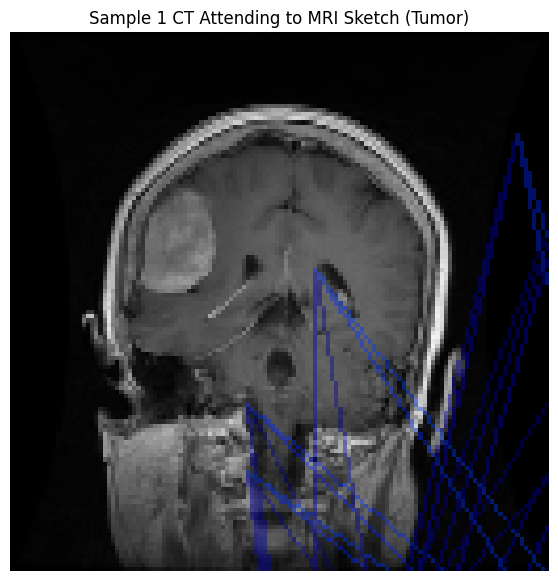

--- Generating Sketch Map for: Sample 1 MRI Attending to CT Sketch (Tumor) ---
Received attention_weights shape: torch.Size([1, 2, 256, 256])
Shape after averaging heads: torch.Size([256, 256])


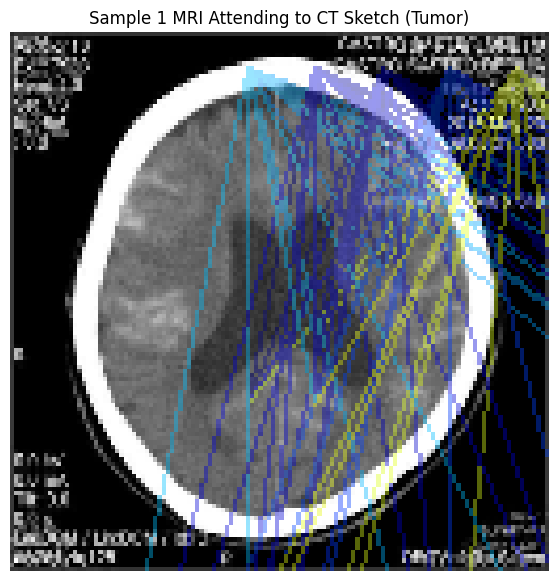


--- Sample 2: True Label: Healthy, Predicted Label: Tumor ---
--- Generating Sketch Map for: Sample 2 CT Attending to MRI Sketch (Tumor) ---
Received attention_weights shape: torch.Size([1, 2, 256, 256])
Shape after averaging heads: torch.Size([256, 256])


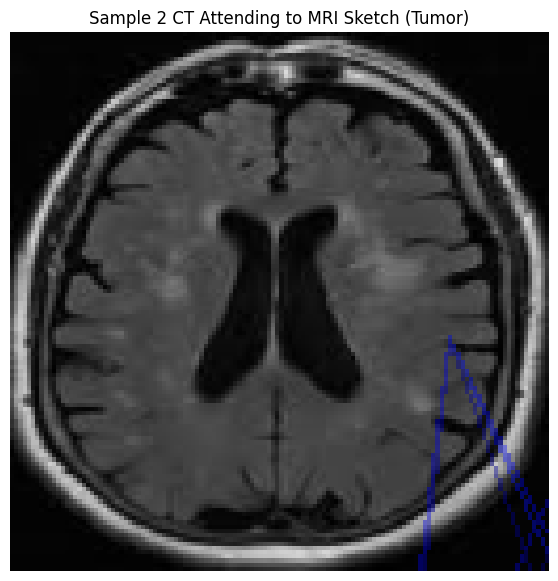

--- Generating Sketch Map for: Sample 2 MRI Attending to CT Sketch (Tumor) ---
Received attention_weights shape: torch.Size([1, 2, 256, 256])
Shape after averaging heads: torch.Size([256, 256])


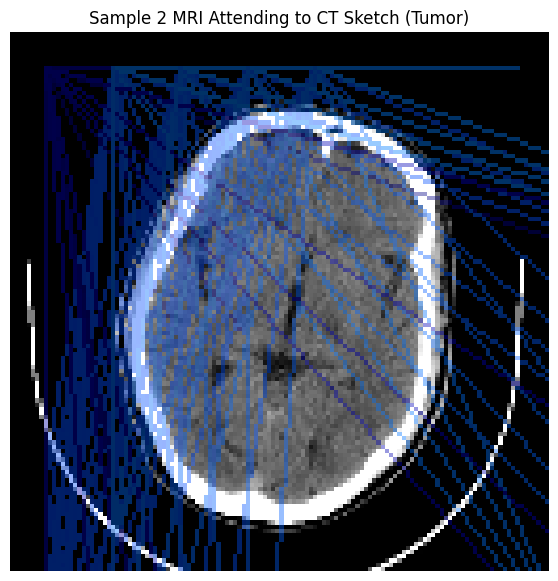


--- Sample 3: True Label: Tumor, Predicted Label: Tumor ---
--- Generating Sketch Map for: Sample 3 CT Attending to MRI Sketch (Tumor) ---
Received attention_weights shape: torch.Size([1, 2, 256, 256])
Shape after averaging heads: torch.Size([256, 256])


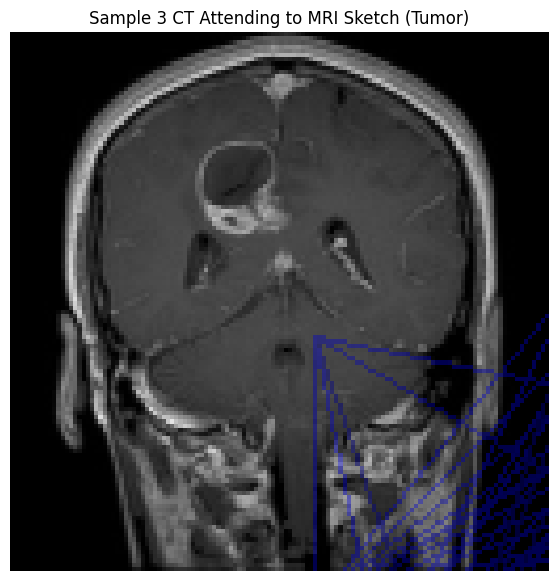

--- Generating Sketch Map for: Sample 3 MRI Attending to CT Sketch (Tumor) ---
Received attention_weights shape: torch.Size([1, 2, 256, 256])
Shape after averaging heads: torch.Size([256, 256])


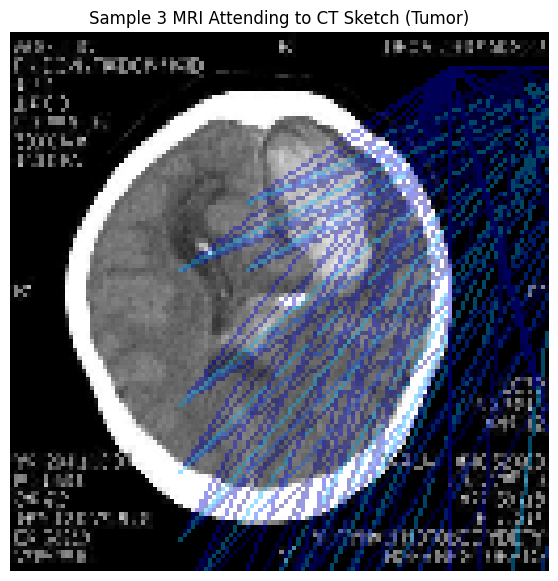


--- Sample 4: True Label: Healthy, Predicted Label: Tumor ---
--- Generating Sketch Map for: Sample 4 CT Attending to MRI Sketch (Tumor) ---
Received attention_weights shape: torch.Size([1, 2, 256, 256])
Shape after averaging heads: torch.Size([256, 256])


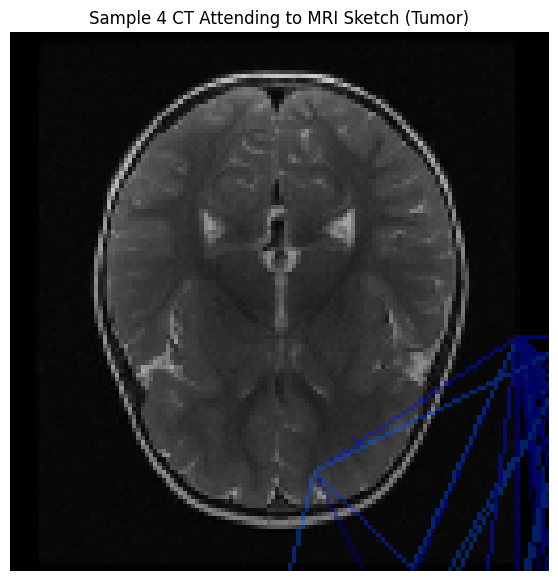

--- Generating Sketch Map for: Sample 4 MRI Attending to CT Sketch (Tumor) ---
Received attention_weights shape: torch.Size([1, 2, 256, 256])
Shape after averaging heads: torch.Size([256, 256])


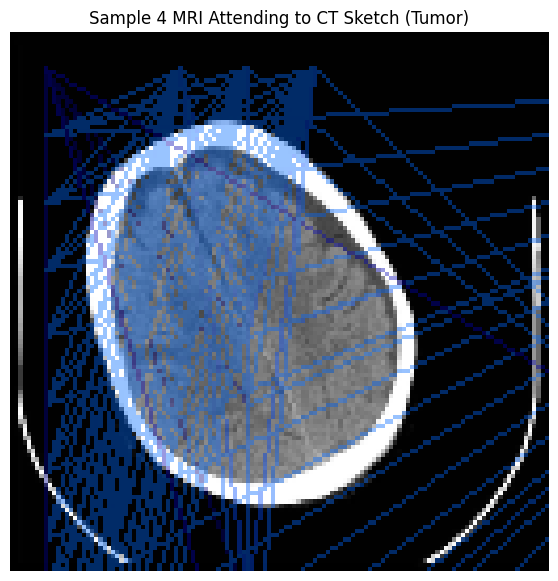


--- Sample 5: True Label: Healthy, Predicted Label: Tumor ---
--- Generating Sketch Map for: Sample 5 CT Attending to MRI Sketch (Tumor) ---
Received attention_weights shape: torch.Size([1, 2, 256, 256])
Shape after averaging heads: torch.Size([256, 256])


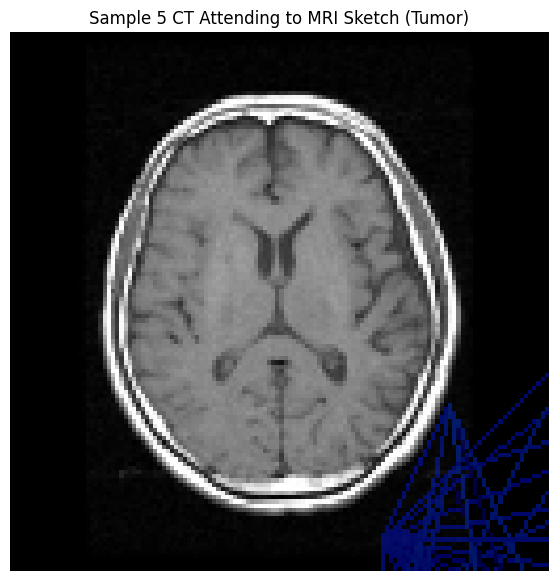

--- Generating Sketch Map for: Sample 5 MRI Attending to CT Sketch (Tumor) ---
Received attention_weights shape: torch.Size([1, 2, 256, 256])
Shape after averaging heads: torch.Size([256, 256])


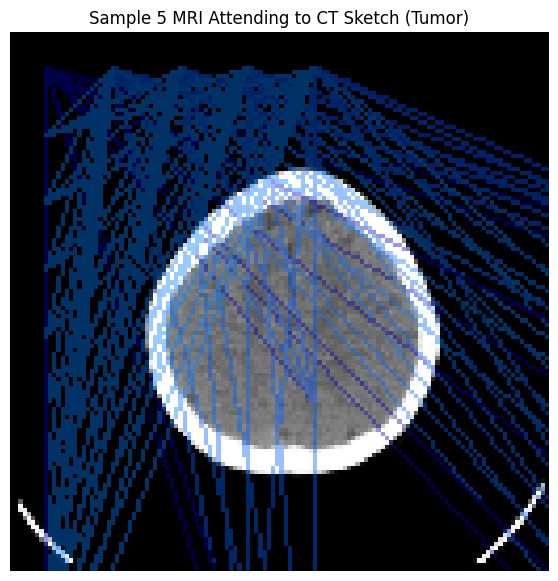


--- Sample 6: True Label: Healthy, Predicted Label: Tumor ---
--- Generating Sketch Map for: Sample 6 CT Attending to MRI Sketch (Tumor) ---
Received attention_weights shape: torch.Size([1, 2, 256, 256])
Shape after averaging heads: torch.Size([256, 256])


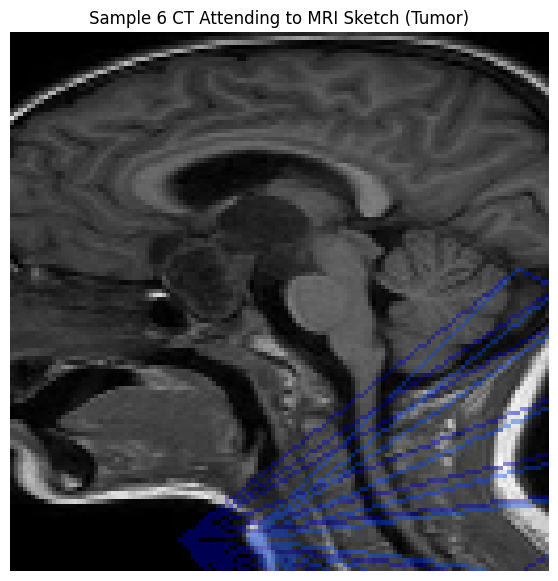

--- Generating Sketch Map for: Sample 6 MRI Attending to CT Sketch (Tumor) ---
Received attention_weights shape: torch.Size([1, 2, 256, 256])
Shape after averaging heads: torch.Size([256, 256])


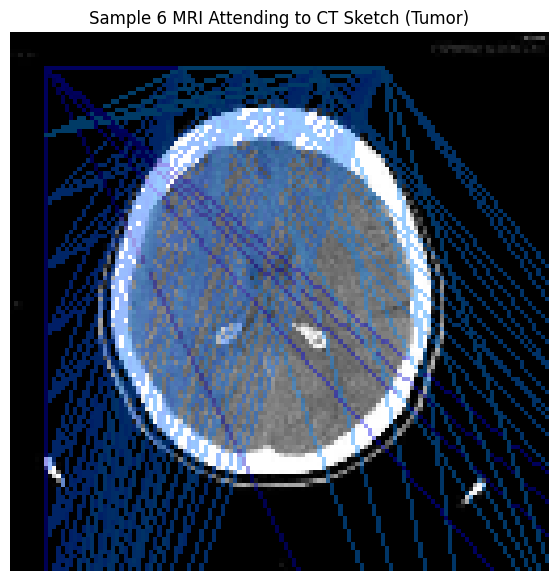


--- Sample 7: True Label: Healthy, Predicted Label: Healthy ---
--- Generating Sketch Map for: Sample 7 CT Attending to MRI Sketch (Healthy) ---
Received attention_weights shape: torch.Size([1, 2, 256, 256])
Shape after averaging heads: torch.Size([256, 256])


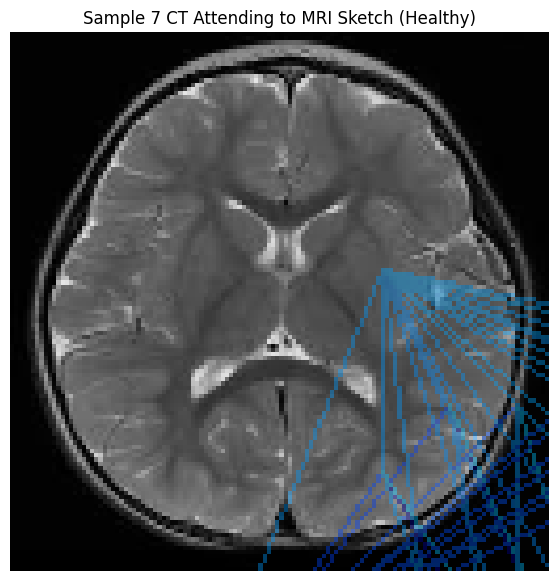

--- Generating Sketch Map for: Sample 7 MRI Attending to CT Sketch (Healthy) ---
Received attention_weights shape: torch.Size([1, 2, 256, 256])
Shape after averaging heads: torch.Size([256, 256])


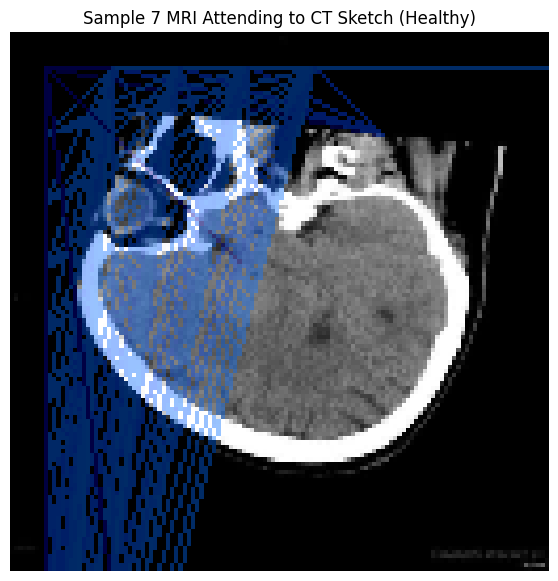


--- Sample 8: True Label: Healthy, Predicted Label: Tumor ---
--- Generating Sketch Map for: Sample 8 CT Attending to MRI Sketch (Tumor) ---
Received attention_weights shape: torch.Size([1, 2, 256, 256])
Shape after averaging heads: torch.Size([256, 256])


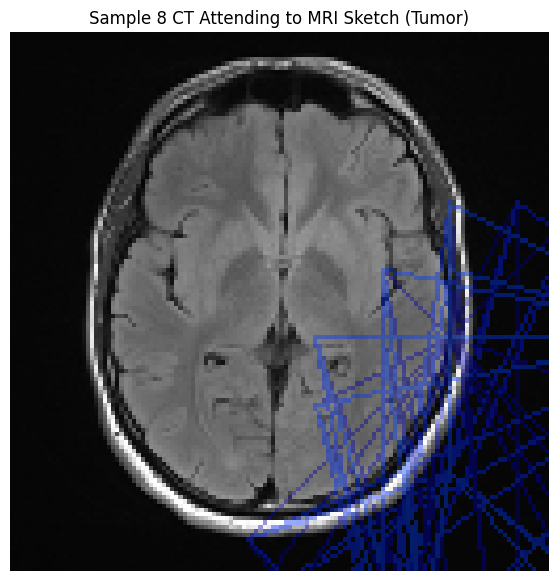

--- Generating Sketch Map for: Sample 8 MRI Attending to CT Sketch (Tumor) ---
Received attention_weights shape: torch.Size([1, 2, 256, 256])
Shape after averaging heads: torch.Size([256, 256])


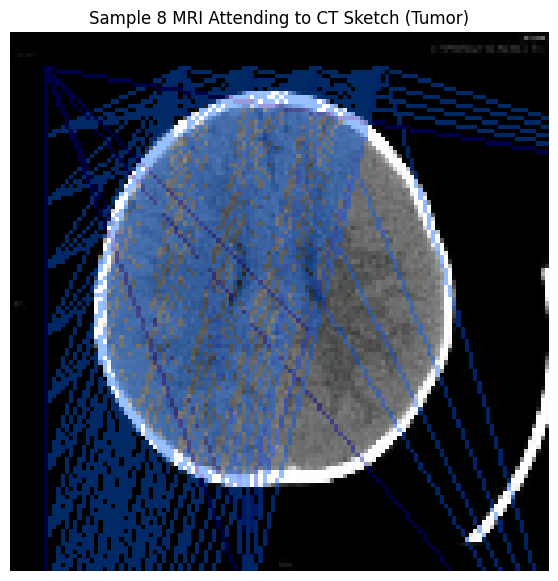


--- Sample 9: True Label: Healthy, Predicted Label: Tumor ---
--- Generating Sketch Map for: Sample 9 CT Attending to MRI Sketch (Tumor) ---
Received attention_weights shape: torch.Size([1, 2, 256, 256])
Shape after averaging heads: torch.Size([256, 256])


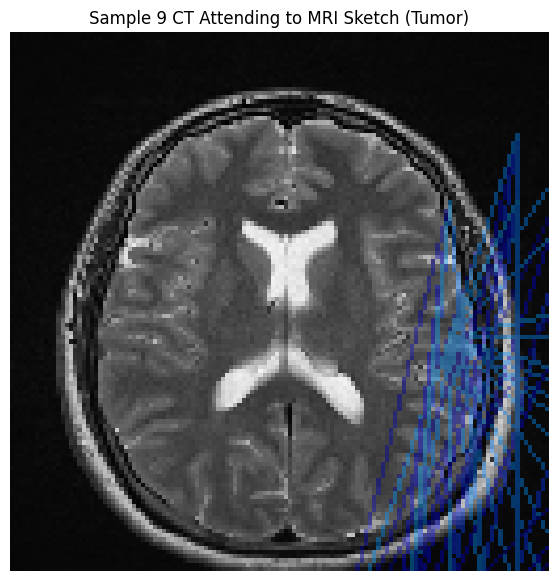

--- Generating Sketch Map for: Sample 9 MRI Attending to CT Sketch (Tumor) ---
Received attention_weights shape: torch.Size([1, 2, 256, 256])
Shape after averaging heads: torch.Size([256, 256])


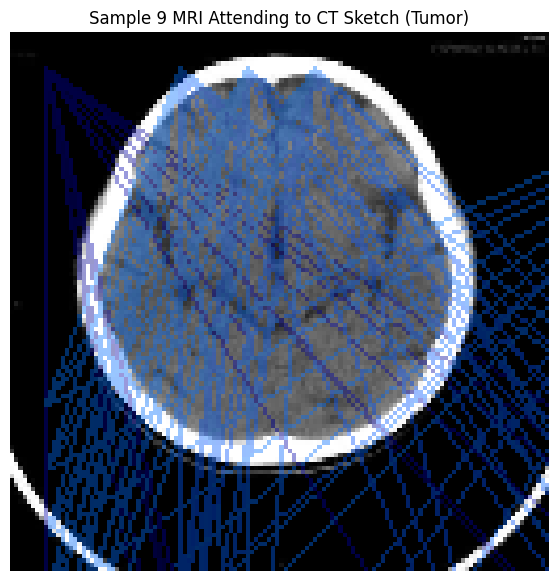


--- Sample 10: True Label: Healthy, Predicted Label: Tumor ---
--- Generating Sketch Map for: Sample 10 CT Attending to MRI Sketch (Tumor) ---
Received attention_weights shape: torch.Size([1, 2, 256, 256])
Shape after averaging heads: torch.Size([256, 256])


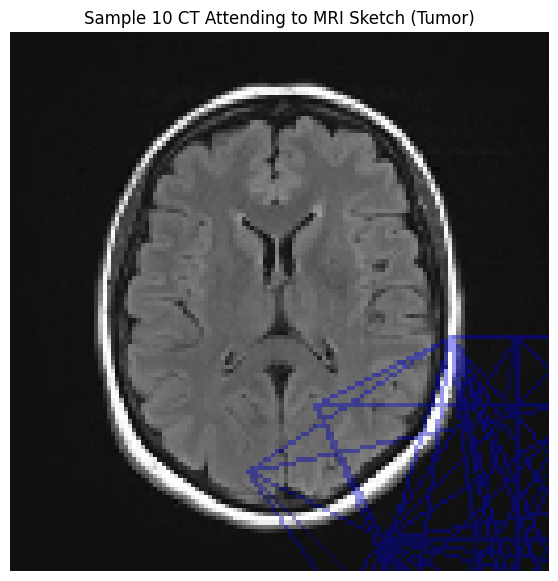

--- Generating Sketch Map for: Sample 10 MRI Attending to CT Sketch (Tumor) ---
Received attention_weights shape: torch.Size([1, 2, 256, 256])
Shape after averaging heads: torch.Size([256, 256])


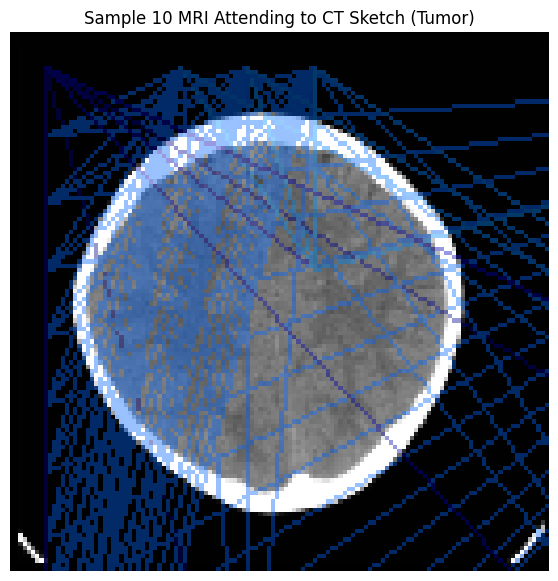


--- Sample 11: True Label: Healthy, Predicted Label: Tumor ---
--- Generating Sketch Map for: Sample 11 CT Attending to MRI Sketch (Tumor) ---
Received attention_weights shape: torch.Size([1, 2, 256, 256])
Shape after averaging heads: torch.Size([256, 256])


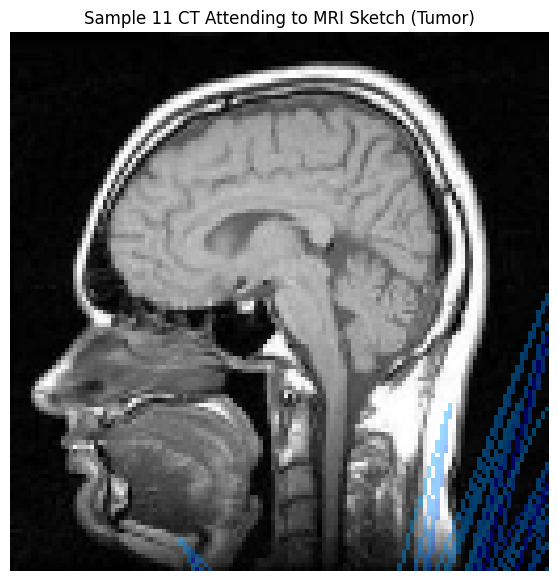

--- Generating Sketch Map for: Sample 11 MRI Attending to CT Sketch (Tumor) ---
Received attention_weights shape: torch.Size([1, 2, 256, 256])
Shape after averaging heads: torch.Size([256, 256])


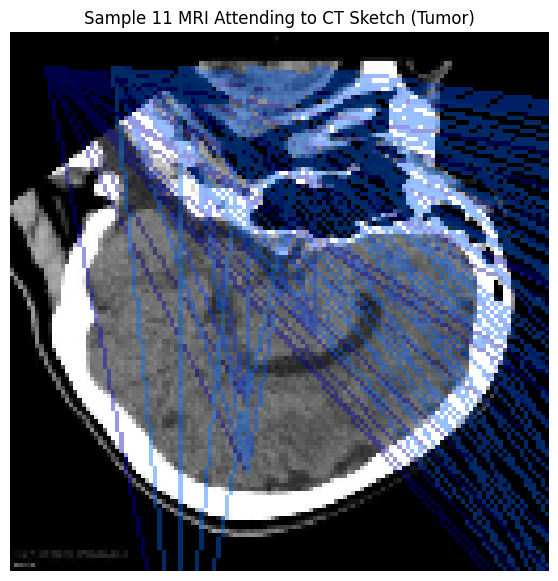


--- Sample 12: True Label: Tumor, Predicted Label: Tumor ---
--- Generating Sketch Map for: Sample 12 CT Attending to MRI Sketch (Tumor) ---
Received attention_weights shape: torch.Size([1, 2, 256, 256])
Shape after averaging heads: torch.Size([256, 256])


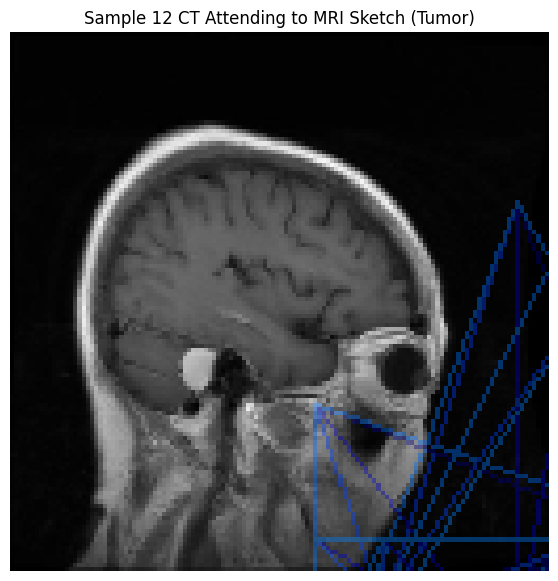

--- Generating Sketch Map for: Sample 12 MRI Attending to CT Sketch (Tumor) ---
Received attention_weights shape: torch.Size([1, 2, 256, 256])
Shape after averaging heads: torch.Size([256, 256])


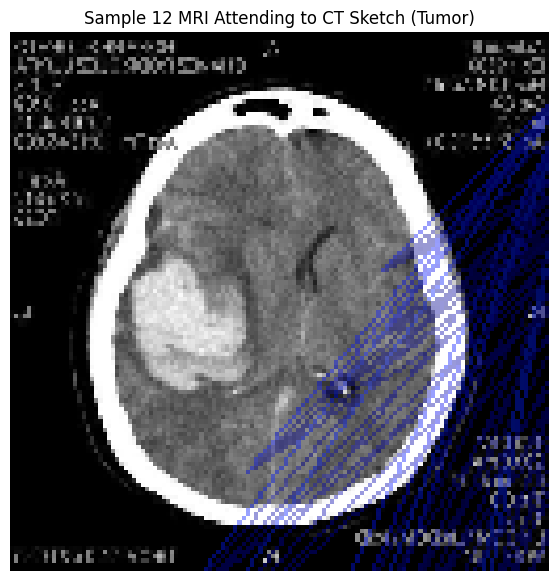


--- Sample 13: True Label: Healthy, Predicted Label: Tumor ---
--- Generating Sketch Map for: Sample 13 CT Attending to MRI Sketch (Tumor) ---
Received attention_weights shape: torch.Size([1, 2, 256, 256])
Shape after averaging heads: torch.Size([256, 256])


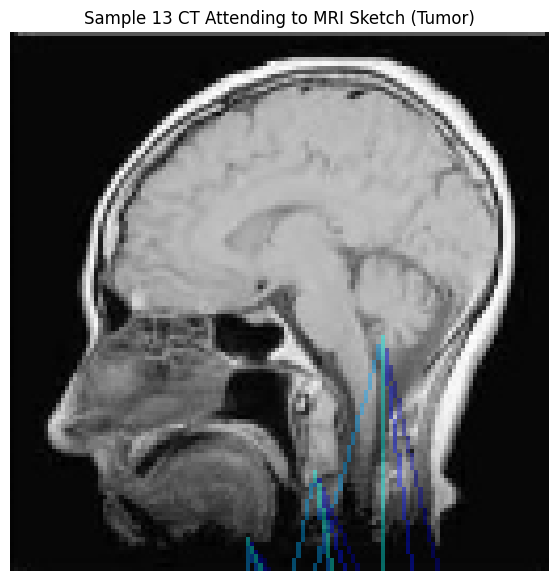

--- Generating Sketch Map for: Sample 13 MRI Attending to CT Sketch (Tumor) ---
Received attention_weights shape: torch.Size([1, 2, 256, 256])
Shape after averaging heads: torch.Size([256, 256])


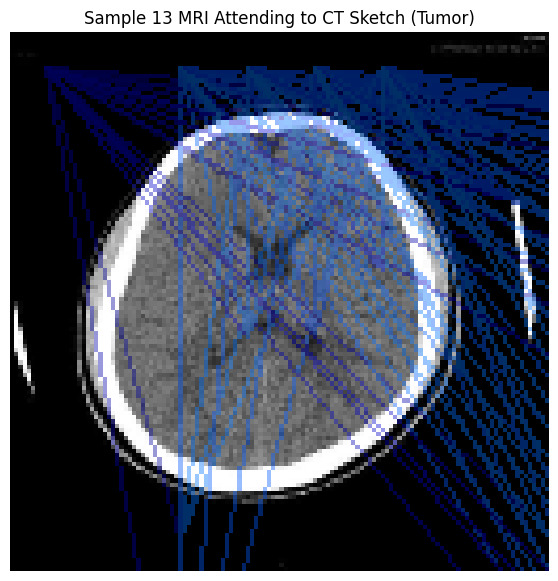


--- Sample 14: True Label: Tumor, Predicted Label: Tumor ---
--- Generating Sketch Map for: Sample 14 CT Attending to MRI Sketch (Tumor) ---
Received attention_weights shape: torch.Size([1, 2, 256, 256])
Shape after averaging heads: torch.Size([256, 256])


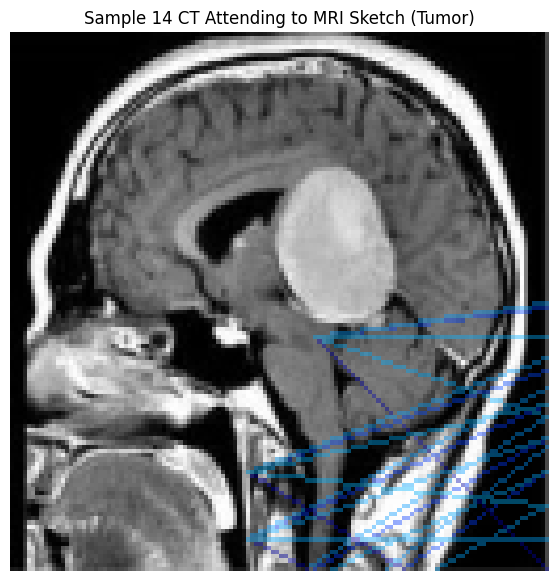

--- Generating Sketch Map for: Sample 14 MRI Attending to CT Sketch (Tumor) ---
Received attention_weights shape: torch.Size([1, 2, 256, 256])
Shape after averaging heads: torch.Size([256, 256])


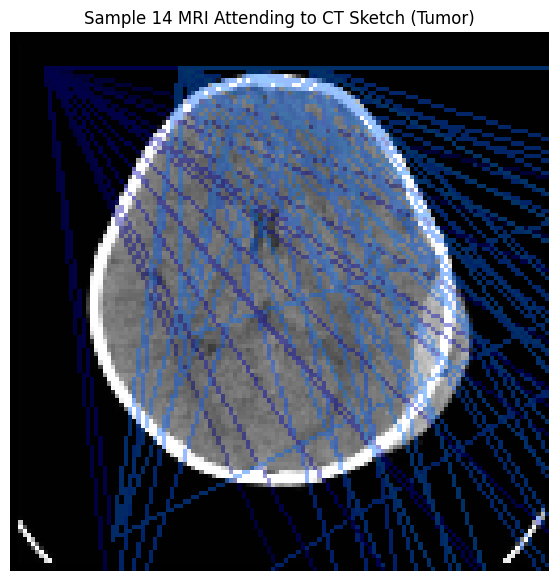


--- Sample 15: True Label: Healthy, Predicted Label: Tumor ---
--- Generating Sketch Map for: Sample 15 CT Attending to MRI Sketch (Tumor) ---
Received attention_weights shape: torch.Size([1, 2, 256, 256])
Shape after averaging heads: torch.Size([256, 256])


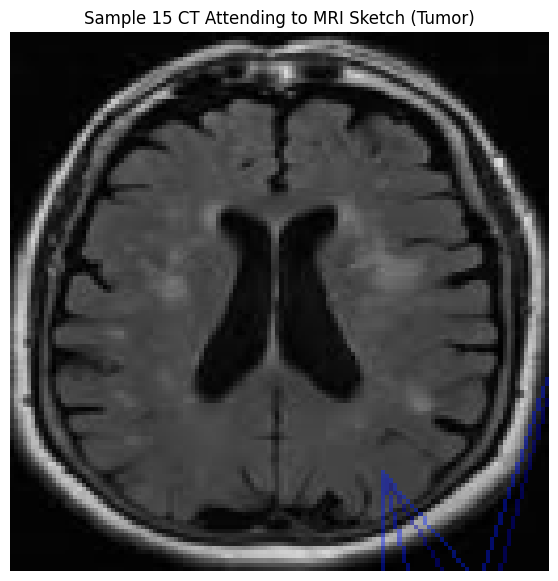

--- Generating Sketch Map for: Sample 15 MRI Attending to CT Sketch (Tumor) ---
Received attention_weights shape: torch.Size([1, 2, 256, 256])
Shape after averaging heads: torch.Size([256, 256])


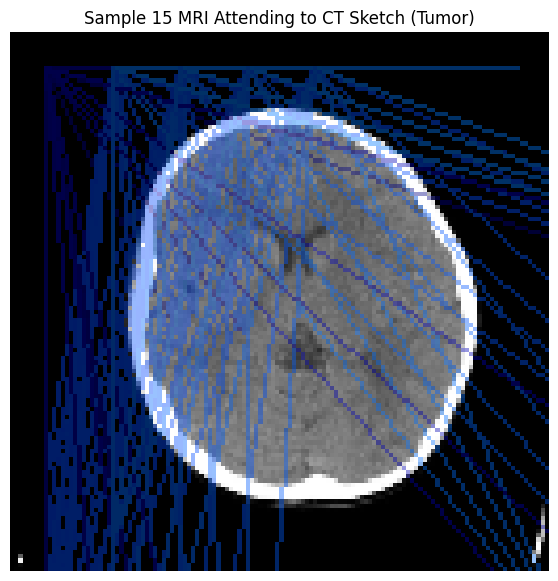


--- Sample 16: True Label: Healthy, Predicted Label: Tumor ---
--- Generating Sketch Map for: Sample 16 CT Attending to MRI Sketch (Tumor) ---
Received attention_weights shape: torch.Size([1, 2, 256, 256])
Shape after averaging heads: torch.Size([256, 256])


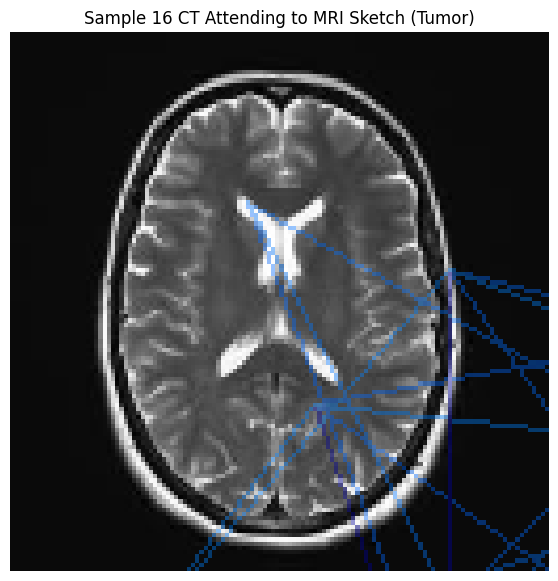

--- Generating Sketch Map for: Sample 16 MRI Attending to CT Sketch (Tumor) ---
Received attention_weights shape: torch.Size([1, 2, 256, 256])
Shape after averaging heads: torch.Size([256, 256])


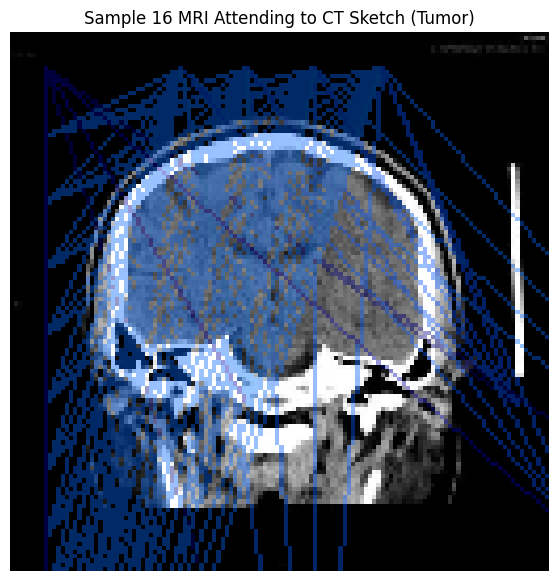


--- Sample 17: True Label: Healthy, Predicted Label: Tumor ---
--- Generating Sketch Map for: Sample 17 CT Attending to MRI Sketch (Tumor) ---
Received attention_weights shape: torch.Size([1, 2, 256, 256])
Shape after averaging heads: torch.Size([256, 256])


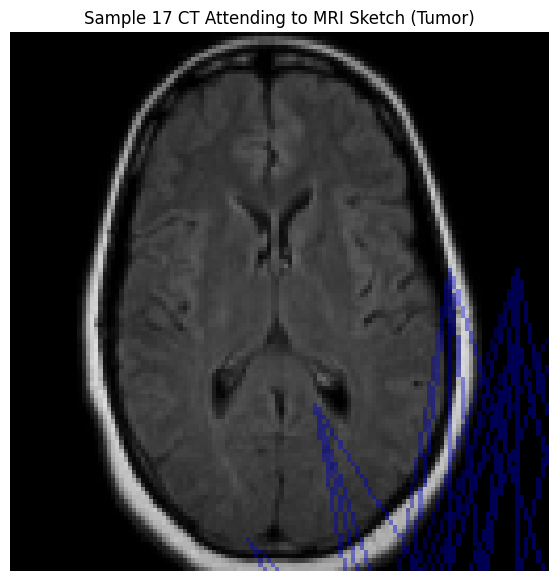

--- Generating Sketch Map for: Sample 17 MRI Attending to CT Sketch (Tumor) ---
Received attention_weights shape: torch.Size([1, 2, 256, 256])
Shape after averaging heads: torch.Size([256, 256])


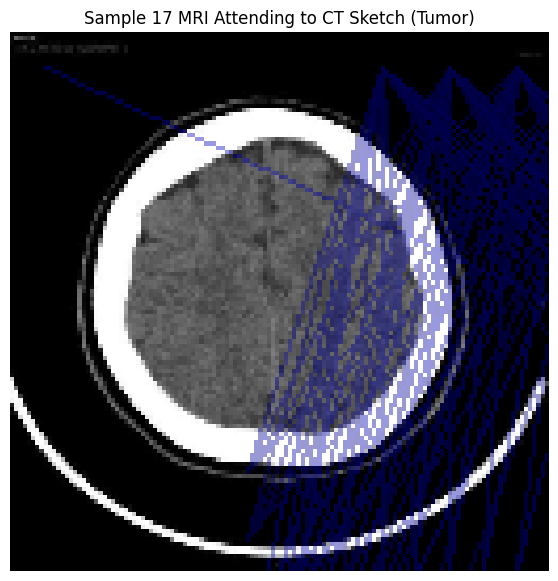


--- Sample 18: True Label: Healthy, Predicted Label: Tumor ---
--- Generating Sketch Map for: Sample 18 CT Attending to MRI Sketch (Tumor) ---
Received attention_weights shape: torch.Size([1, 2, 256, 256])
Shape after averaging heads: torch.Size([256, 256])


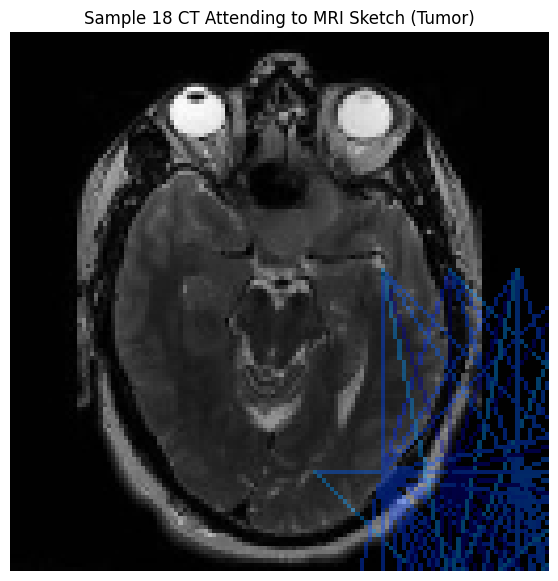

--- Generating Sketch Map for: Sample 18 MRI Attending to CT Sketch (Tumor) ---
Received attention_weights shape: torch.Size([1, 2, 256, 256])
Shape after averaging heads: torch.Size([256, 256])


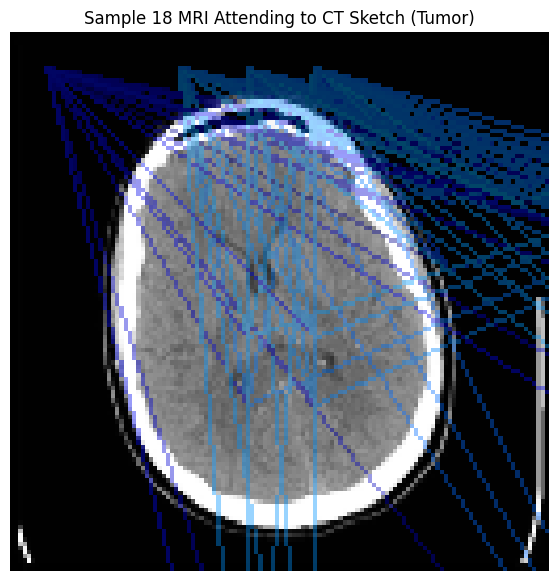


--- Sample 19: True Label: Healthy, Predicted Label: Tumor ---
--- Generating Sketch Map for: Sample 19 CT Attending to MRI Sketch (Tumor) ---
Received attention_weights shape: torch.Size([1, 2, 256, 256])
Shape after averaging heads: torch.Size([256, 256])


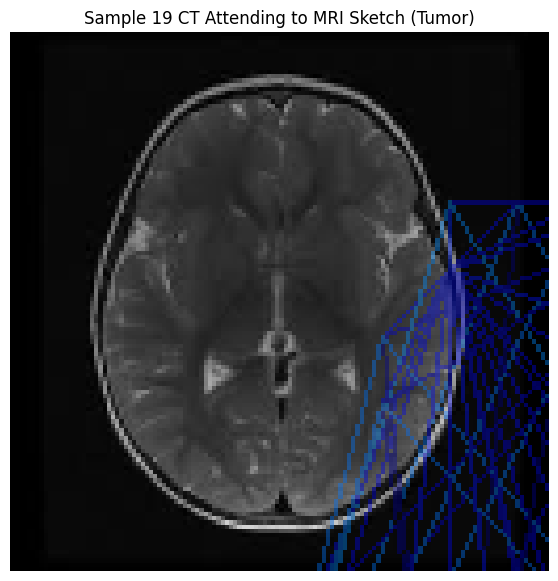

--- Generating Sketch Map for: Sample 19 MRI Attending to CT Sketch (Tumor) ---
Received attention_weights shape: torch.Size([1, 2, 256, 256])
Shape after averaging heads: torch.Size([256, 256])


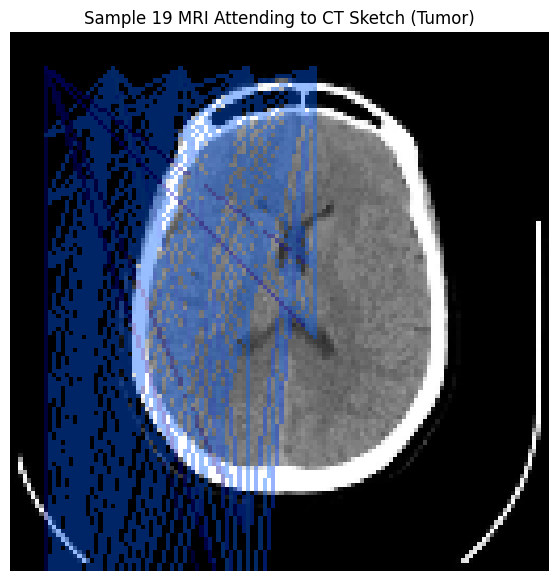


--- Sample 20: True Label: Healthy, Predicted Label: Tumor ---
--- Generating Sketch Map for: Sample 20 CT Attending to MRI Sketch (Tumor) ---
Received attention_weights shape: torch.Size([1, 2, 256, 256])
Shape after averaging heads: torch.Size([256, 256])


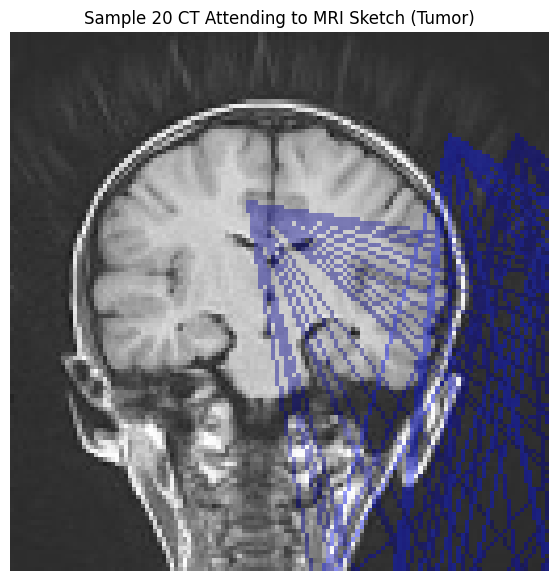

--- Generating Sketch Map for: Sample 20 MRI Attending to CT Sketch (Tumor) ---
Received attention_weights shape: torch.Size([1, 2, 256, 256])
Shape after averaging heads: torch.Size([256, 256])


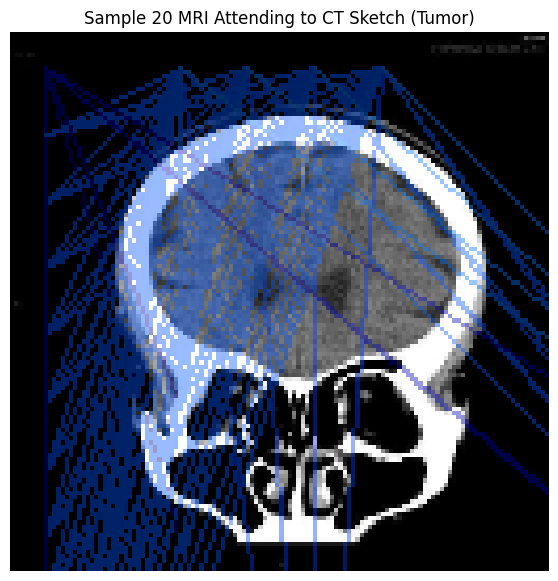

In [ ]:
# @title
# --- Generate and Visualize Sketch Maps for Sample Images ---
# Assuming sample_results list is available from cell ce40c3a8 or d7d61b1a
# Ensure categories list is available
categories = ["Healthy", "Tumor"]

if 'sample_results' in globals() and sample_results:
    print("\nGenerating and visualizing Attention Sketch Maps for sample images...")

    for i, result in enumerate(sample_results):
        ct_path = result['ct_path']
        mri_path = result['mri_path']
        ct_mri_attn = result['ct_mri_attention']
        mri_ct_attn = result['mri_ct_attention']
        true_label = result['true_label']
        predicted_label = result['predicted_label']

        if predicted_label is not None:
            predicted_label_name = categories[predicted_label]
        else:
            predicted_label_name = "N/A (Image Load Error)"

        print(f"\n--- Sample {i+1}: True Label: {categories[true_label]}, Predicted Label: {predicted_label_name} ---")

        # Visualize CT Attending to MRI (Overlay on MRI image)
        if ct_mri_attn is not None and torch.is_tensor(ct_mri_attn) and ct_mri_attn.ndim == 4 and ct_mri_attn.size(0) == 1:
            visualize_attention_sketch_map(
                mri_path, # Overlay on MRI image
                ct_mri_attn,
                patch_size=16, img_size=(128, 128),
                title=f"Sample {i+1} CT Attending to MRI Sketch ({predicted_label_name})",
                top_k=5 # Connect to top 5 key patches
            )
        else:
            print(f"Skipping CT Attending to MRI Sketch Map for Sample {i+1} due to unexpected attention shape: {ct_mri_attn.shape if ct_mri_attn is not None and torch.is_tensor(ct_mri_attn) else 'None'}")


        # Visualize MRI Attending to CT (Overlay on CT image)
        if mri_ct_attn is not None and torch.is_tensor(mri_ct_attn) and mri_ct_attn.ndim == 4 and mri_ct_attn.size(0) == 1:
            visualize_attention_sketch_map(
                ct_path, # Overlay on CT image
                mri_ct_attn,
                patch_size=16, img_size=(128, 128),
                title=f"Sample {i+1} MRI Attending to CT Sketch ({predicted_label_name})",
                top_k=5 # Connect to top 5 key patches
            )
        else:
            print(f"Skipping MRI Attending to CT Sketch Map for Sample {i+1} due to unexpected attention shape: {mri_ct_attn.shape if mri_ct_attn is not None and torch.is_tensor(mri_ct_attn) else 'None'}")

else:
    print("Sample results ('sample_results') not available. Please run the previous cells to generate predictions and attention weights.")

In [ ]:
# @title
import torch
import cv2
import numpy as np
import matplotlib.pyplot as plt

def visualize_attention_heatmap(original_image_path, attention_weights,
                                img_size=(128, 128), title="Attention Heatmap"):
    """
    Visualizes attention weights as a heatmap overlay on the original image.

    Args:
        original_image_path (str): Path to the original image file (for background).
        attention_weights (torch.Tensor): Attention weights for a single image pair.
                                          Expected shape: [1, num_heads, seq_len_query, seq_len_key].
        img_size (tuple): Size of the input image (width, height).
        title (str): Title for the plot.
    """
    print(f"--- Generating Heatmap for: {title} ---")
    print(f"Received attention_weights shape: {attention_weights.shape if attention_weights is not None else 'None'}")

    original_image = cv2.imread(original_image_path, cv2.IMREAD_GRAYSCALE)
    if original_image is None:
        print(f"Warning: Could not load image at {original_image_path}")
        return

    original_image = cv2.resize(original_image, img_size)

    if attention_weights is None or attention_weights.ndim != 4 or attention_weights.size(0) != 1:
        print(f"Error: Attention weights must be [1, num_heads, seq_len_query, seq_len_key]. Got {attention_weights.shape}")
        return

    # Squeeze batch dimension
    attn = attention_weights.squeeze(0)  # [num_heads, seq_len_query, seq_len_key]

    # Average across heads and queries → focus on "where CT attends in MRI"
    attn_mean = attn.mean(dim=0).mean(dim=0)  # [seq_len_key]

    # Infer grid size (square patches assumed)
    seq_len_key = attn_mean.shape[0]
    grid_size = int(round(np.sqrt(seq_len_key)))
    if grid_size * grid_size != seq_len_key:
        print(f"Error: seq_len_key={seq_len_key} is not a perfect square.")
        return

    # Reshape into patch grid
    attn_map = attn_mean.view(grid_size, grid_size).cpu().detach().numpy()

    # Normalize 0–1
    attn_map = (attn_map - attn_map.min()) / (attn_map.max() - attn_map.min() + 1e-8)

    # Resize to match image
    attn_map_resized = cv2.resize(attn_map, img_size)

    # Plot overlay
    plt.figure(figsize=(6, 6))
    plt.imshow(original_image, cmap="gray")
    plt.imshow(attn_map_resized, cmap="jet", alpha=0.5)  # heatmap overlay
    plt.title(title)
    plt.axis("off")
    plt.show()



Generating and visualizing Attention Sketch Maps for sample images...

--- Sample 1: True Label: Tumor, Predicted Label: Tumor ---
--- Generating Heatmap for: Sample 1 CT Attending to MRI Sketch (Tumor) ---
Received attention_weights shape: torch.Size([1, 2, 256, 256])


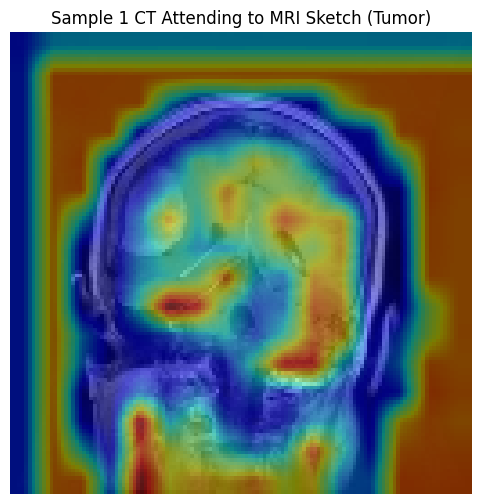

--- Generating Heatmap for: Sample 1 MRI Attending to CT Sketch (Tumor) ---
Received attention_weights shape: torch.Size([1, 2, 256, 256])


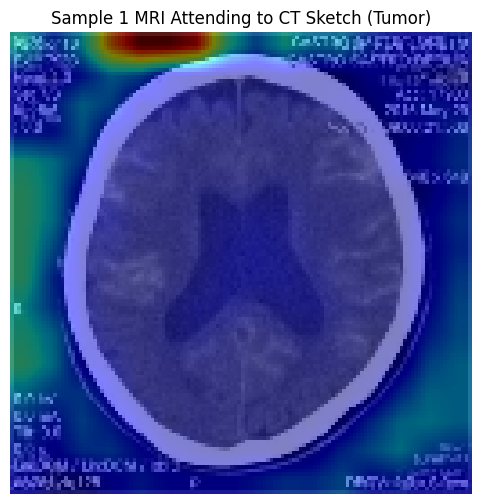


--- Sample 2: True Label: Healthy, Predicted Label: Tumor ---
--- Generating Heatmap for: Sample 2 CT Attending to MRI Sketch (Tumor) ---
Received attention_weights shape: torch.Size([1, 2, 256, 256])


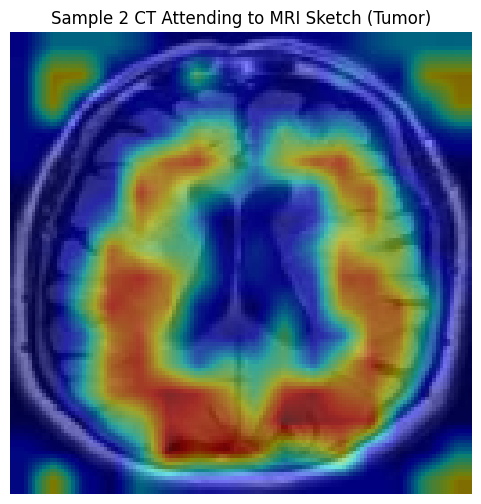

--- Generating Heatmap for: Sample 2 MRI Attending to CT Sketch (Tumor) ---
Received attention_weights shape: torch.Size([1, 2, 256, 256])


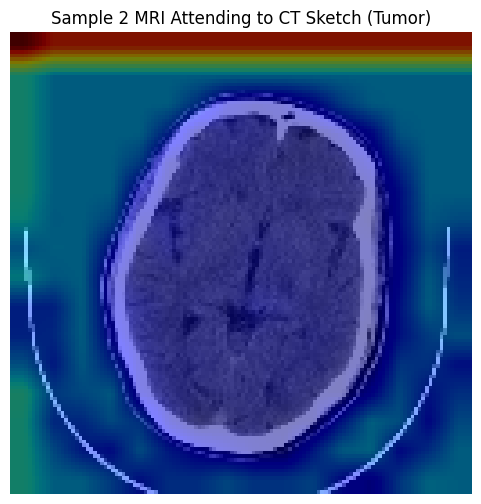


--- Sample 3: True Label: Tumor, Predicted Label: Tumor ---
--- Generating Heatmap for: Sample 3 CT Attending to MRI Sketch (Tumor) ---
Received attention_weights shape: torch.Size([1, 2, 256, 256])


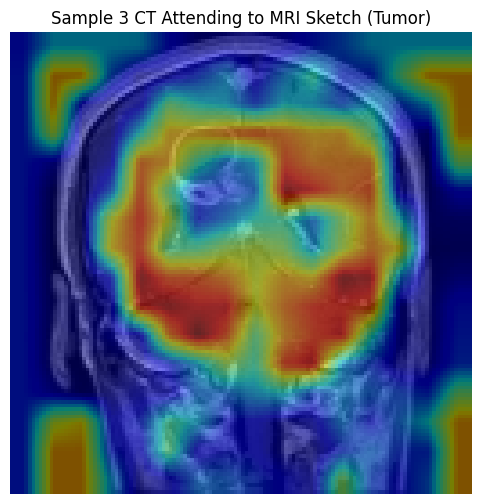

--- Generating Heatmap for: Sample 3 MRI Attending to CT Sketch (Tumor) ---
Received attention_weights shape: torch.Size([1, 2, 256, 256])


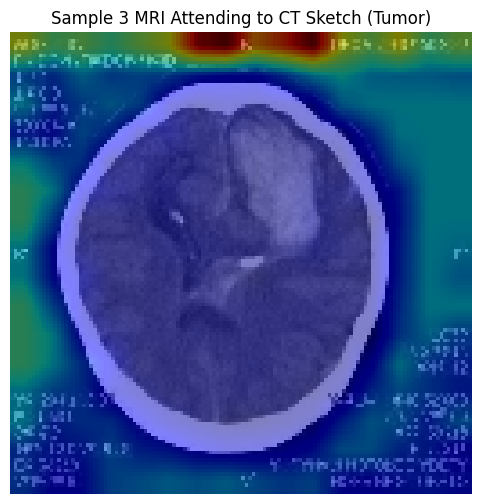


--- Sample 4: True Label: Healthy, Predicted Label: Tumor ---
--- Generating Heatmap for: Sample 4 CT Attending to MRI Sketch (Tumor) ---
Received attention_weights shape: torch.Size([1, 2, 256, 256])


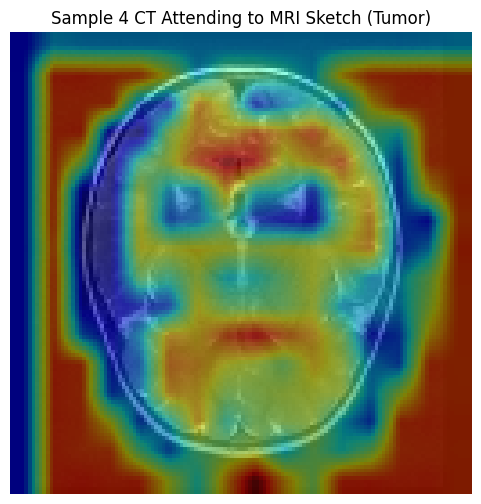

--- Generating Heatmap for: Sample 4 MRI Attending to CT Sketch (Tumor) ---
Received attention_weights shape: torch.Size([1, 2, 256, 256])


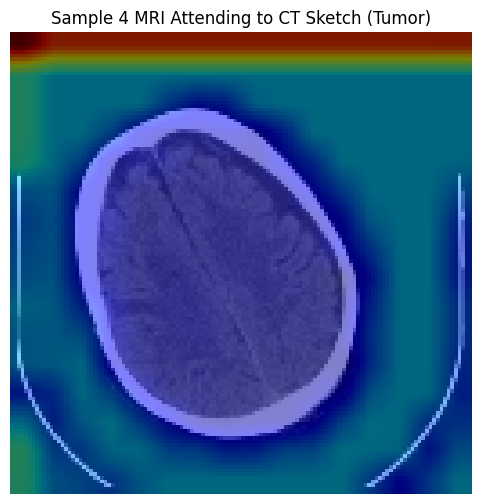


--- Sample 5: True Label: Healthy, Predicted Label: Tumor ---
--- Generating Heatmap for: Sample 5 CT Attending to MRI Sketch (Tumor) ---
Received attention_weights shape: torch.Size([1, 2, 256, 256])


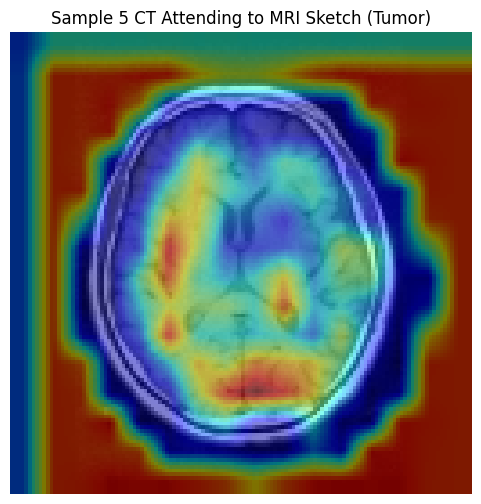

--- Generating Heatmap for: Sample 5 MRI Attending to CT Sketch (Tumor) ---
Received attention_weights shape: torch.Size([1, 2, 256, 256])


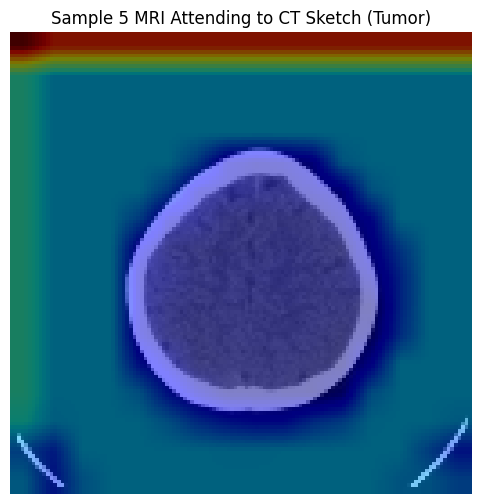


--- Sample 6: True Label: Healthy, Predicted Label: Tumor ---
--- Generating Heatmap for: Sample 6 CT Attending to MRI Sketch (Tumor) ---
Received attention_weights shape: torch.Size([1, 2, 256, 256])


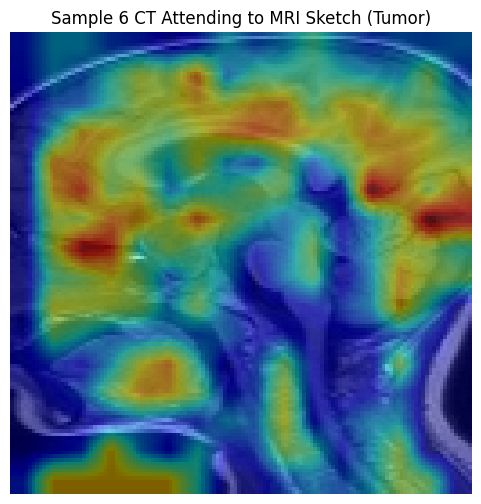

--- Generating Heatmap for: Sample 6 MRI Attending to CT Sketch (Tumor) ---
Received attention_weights shape: torch.Size([1, 2, 256, 256])


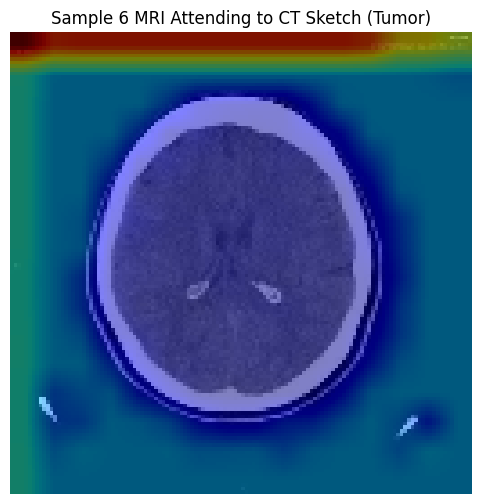


--- Sample 7: True Label: Healthy, Predicted Label: Healthy ---
--- Generating Heatmap for: Sample 7 CT Attending to MRI Sketch (Healthy) ---
Received attention_weights shape: torch.Size([1, 2, 256, 256])


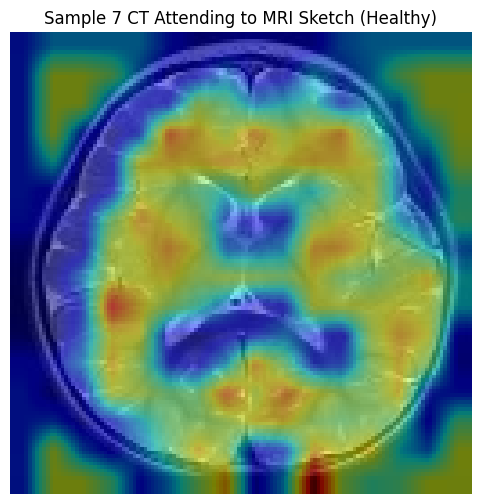

--- Generating Heatmap for: Sample 7 MRI Attending to CT Sketch (Healthy) ---
Received attention_weights shape: torch.Size([1, 2, 256, 256])


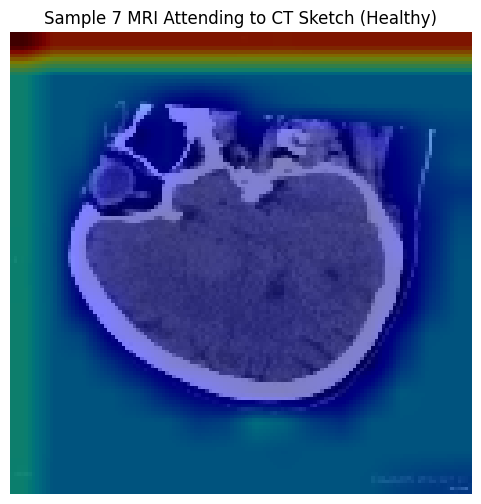


--- Sample 8: True Label: Healthy, Predicted Label: Tumor ---
--- Generating Heatmap for: Sample 8 CT Attending to MRI Sketch (Tumor) ---
Received attention_weights shape: torch.Size([1, 2, 256, 256])


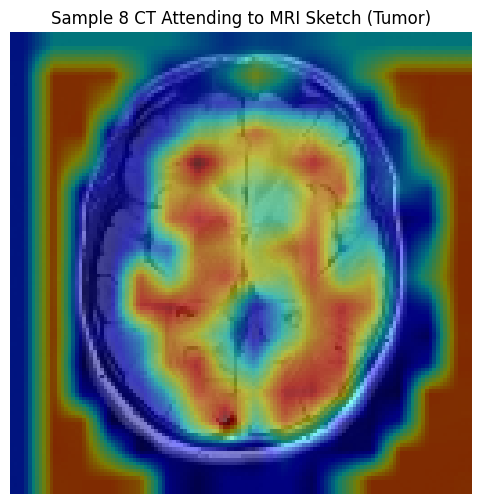

--- Generating Heatmap for: Sample 8 MRI Attending to CT Sketch (Tumor) ---
Received attention_weights shape: torch.Size([1, 2, 256, 256])


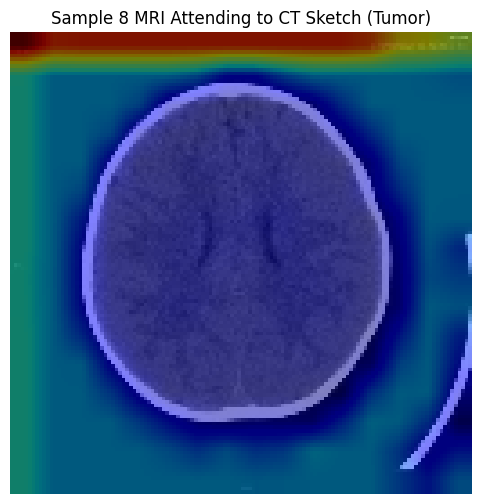


--- Sample 9: True Label: Healthy, Predicted Label: Tumor ---
--- Generating Heatmap for: Sample 9 CT Attending to MRI Sketch (Tumor) ---
Received attention_weights shape: torch.Size([1, 2, 256, 256])


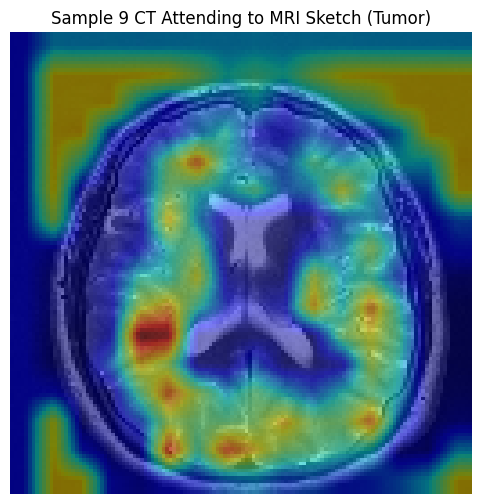

--- Generating Heatmap for: Sample 9 MRI Attending to CT Sketch (Tumor) ---
Received attention_weights shape: torch.Size([1, 2, 256, 256])


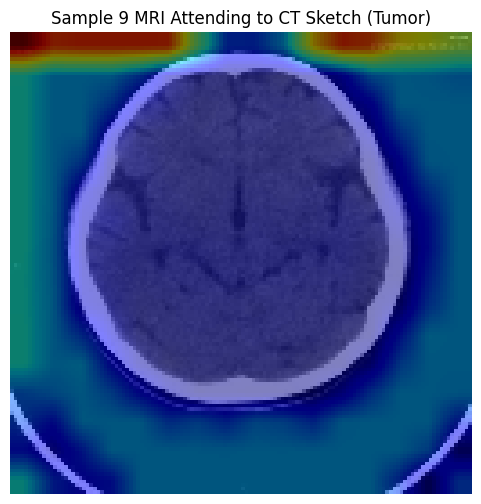


--- Sample 10: True Label: Healthy, Predicted Label: Tumor ---
--- Generating Heatmap for: Sample 10 CT Attending to MRI Sketch (Tumor) ---
Received attention_weights shape: torch.Size([1, 2, 256, 256])


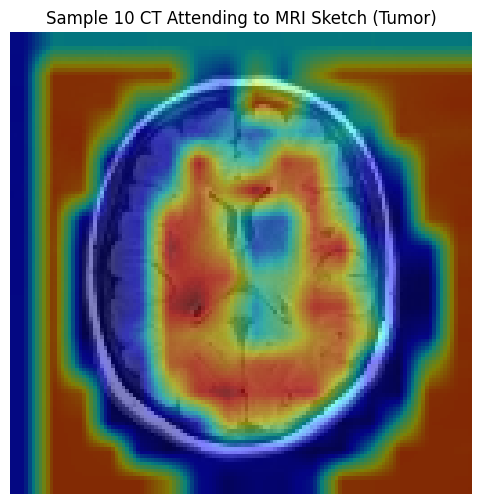

--- Generating Heatmap for: Sample 10 MRI Attending to CT Sketch (Tumor) ---
Received attention_weights shape: torch.Size([1, 2, 256, 256])


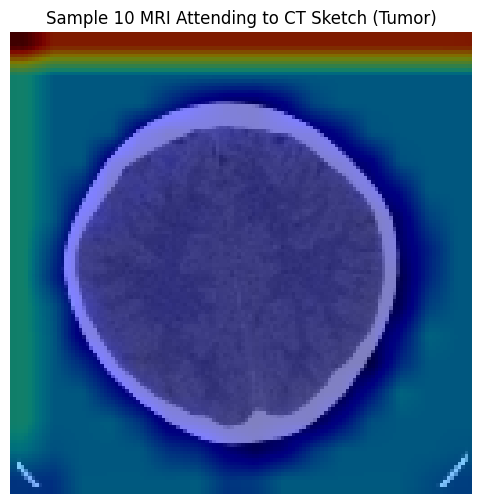


--- Sample 11: True Label: Healthy, Predicted Label: Tumor ---
--- Generating Heatmap for: Sample 11 CT Attending to MRI Sketch (Tumor) ---
Received attention_weights shape: torch.Size([1, 2, 256, 256])


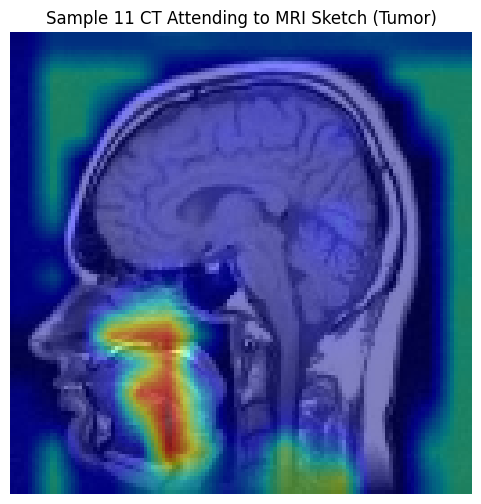

--- Generating Heatmap for: Sample 11 MRI Attending to CT Sketch (Tumor) ---
Received attention_weights shape: torch.Size([1, 2, 256, 256])


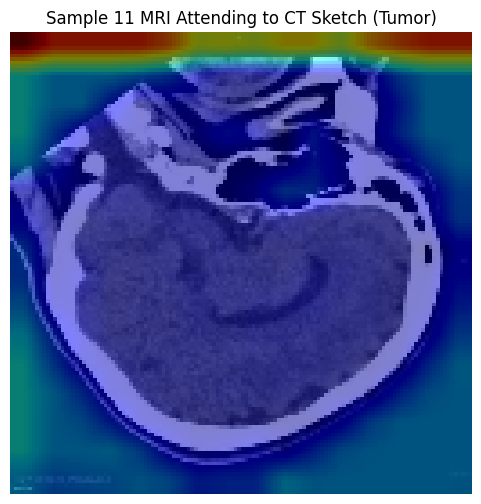


--- Sample 12: True Label: Tumor, Predicted Label: Tumor ---
--- Generating Heatmap for: Sample 12 CT Attending to MRI Sketch (Tumor) ---
Received attention_weights shape: torch.Size([1, 2, 256, 256])


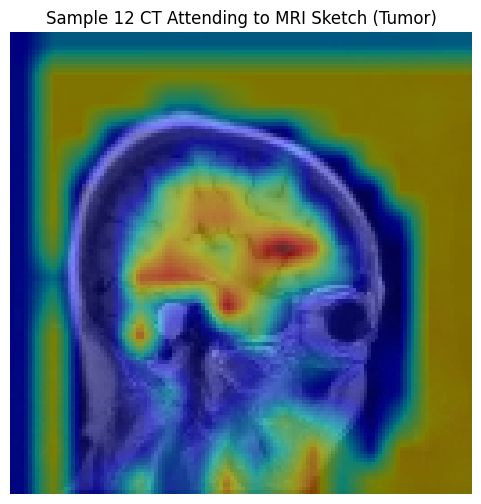

--- Generating Heatmap for: Sample 12 MRI Attending to CT Sketch (Tumor) ---
Received attention_weights shape: torch.Size([1, 2, 256, 256])


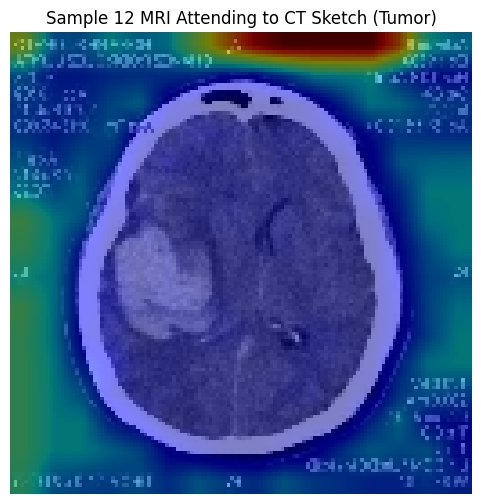


--- Sample 13: True Label: Healthy, Predicted Label: Tumor ---
--- Generating Heatmap for: Sample 13 CT Attending to MRI Sketch (Tumor) ---
Received attention_weights shape: torch.Size([1, 2, 256, 256])


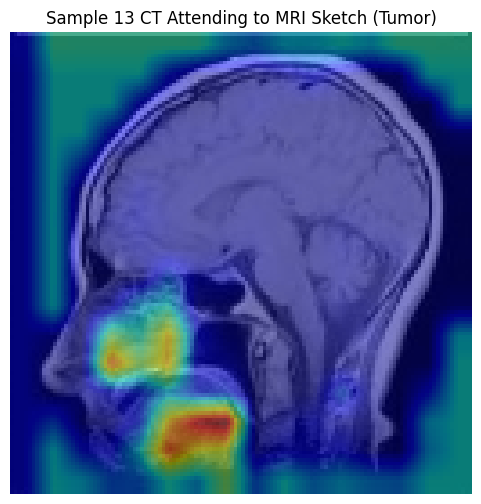

--- Generating Heatmap for: Sample 13 MRI Attending to CT Sketch (Tumor) ---
Received attention_weights shape: torch.Size([1, 2, 256, 256])


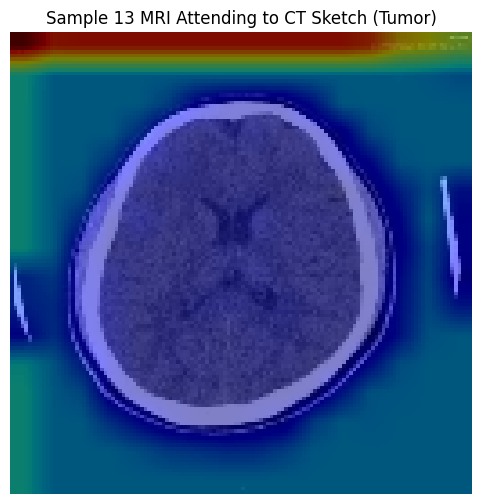


--- Sample 14: True Label: Tumor, Predicted Label: Tumor ---
--- Generating Heatmap for: Sample 14 CT Attending to MRI Sketch (Tumor) ---
Received attention_weights shape: torch.Size([1, 2, 256, 256])


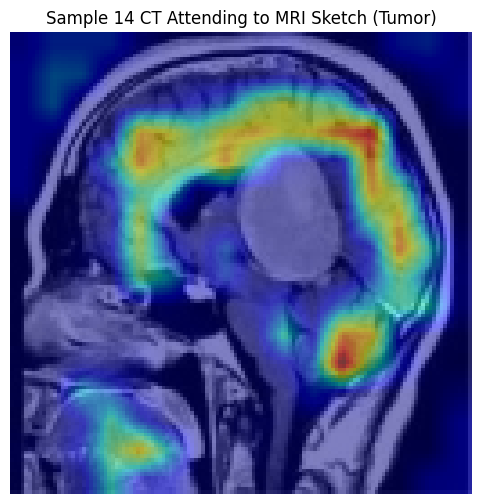

--- Generating Heatmap for: Sample 14 MRI Attending to CT Sketch (Tumor) ---
Received attention_weights shape: torch.Size([1, 2, 256, 256])


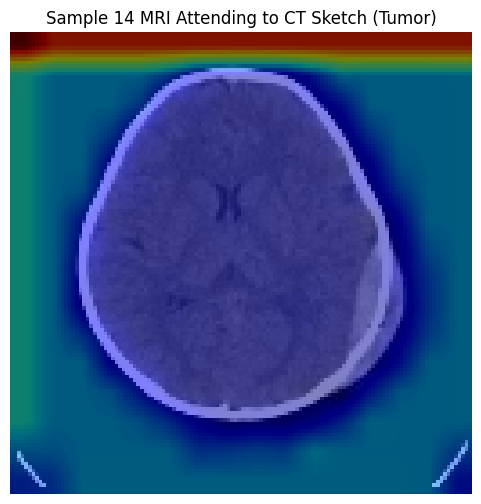


--- Sample 15: True Label: Healthy, Predicted Label: Tumor ---
--- Generating Heatmap for: Sample 15 CT Attending to MRI Sketch (Tumor) ---
Received attention_weights shape: torch.Size([1, 2, 256, 256])


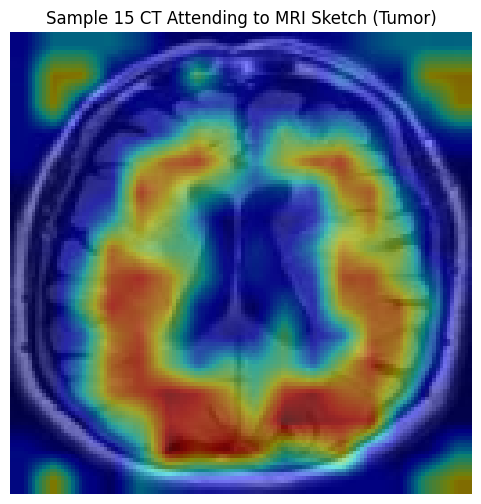

--- Generating Heatmap for: Sample 15 MRI Attending to CT Sketch (Tumor) ---
Received attention_weights shape: torch.Size([1, 2, 256, 256])


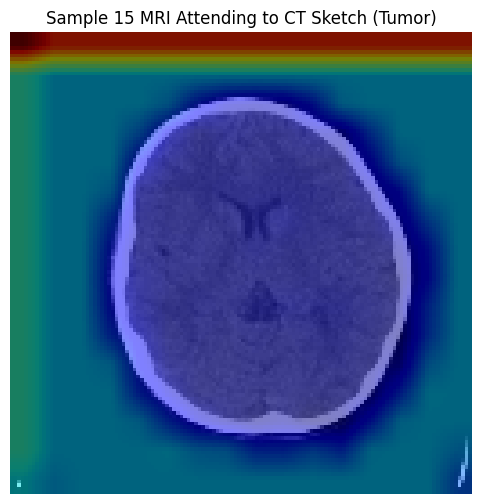


--- Sample 16: True Label: Healthy, Predicted Label: Tumor ---
--- Generating Heatmap for: Sample 16 CT Attending to MRI Sketch (Tumor) ---
Received attention_weights shape: torch.Size([1, 2, 256, 256])


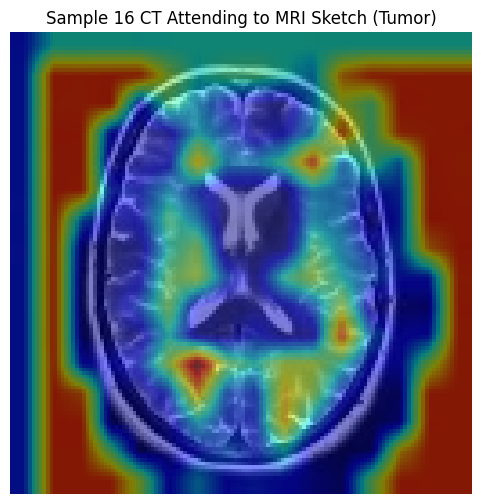

--- Generating Heatmap for: Sample 16 MRI Attending to CT Sketch (Tumor) ---
Received attention_weights shape: torch.Size([1, 2, 256, 256])


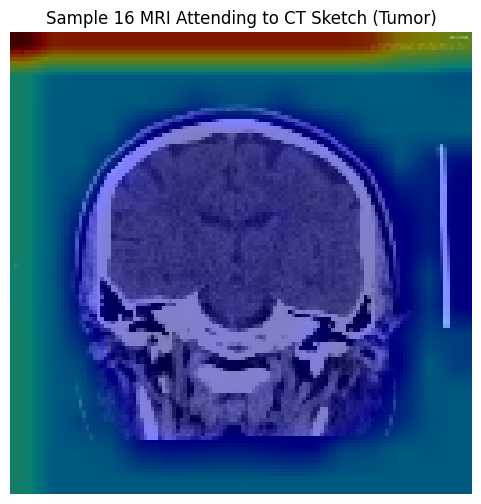


--- Sample 17: True Label: Healthy, Predicted Label: Tumor ---
--- Generating Heatmap for: Sample 17 CT Attending to MRI Sketch (Tumor) ---
Received attention_weights shape: torch.Size([1, 2, 256, 256])


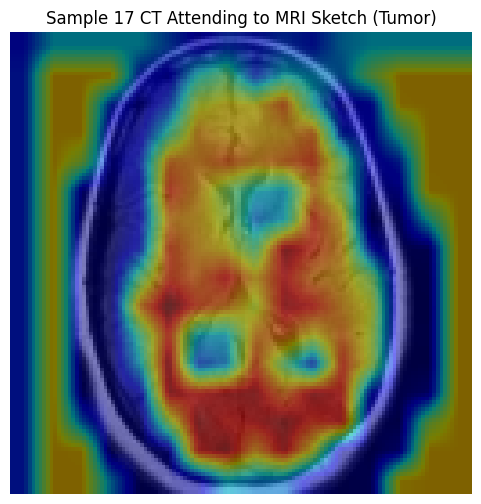

--- Generating Heatmap for: Sample 17 MRI Attending to CT Sketch (Tumor) ---
Received attention_weights shape: torch.Size([1, 2, 256, 256])


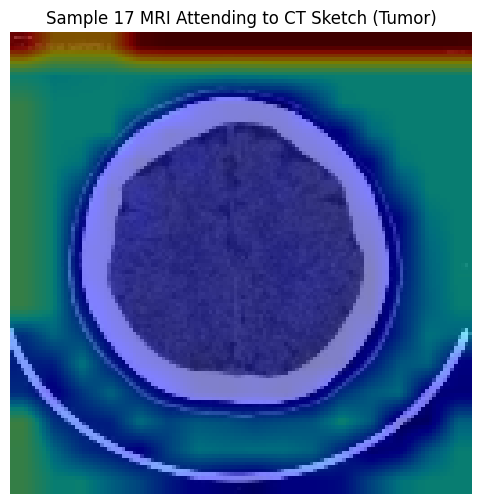


--- Sample 18: True Label: Healthy, Predicted Label: Tumor ---
--- Generating Heatmap for: Sample 18 CT Attending to MRI Sketch (Tumor) ---
Received attention_weights shape: torch.Size([1, 2, 256, 256])


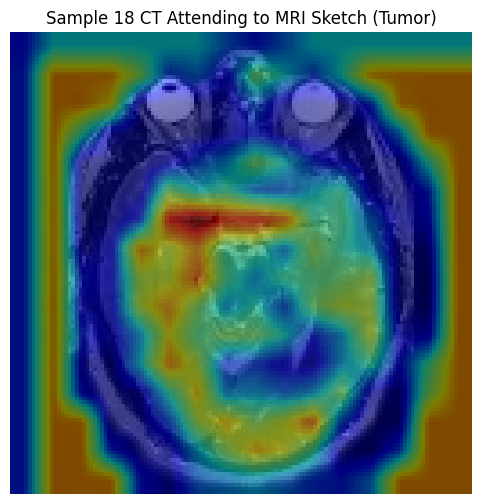

--- Generating Heatmap for: Sample 18 MRI Attending to CT Sketch (Tumor) ---
Received attention_weights shape: torch.Size([1, 2, 256, 256])


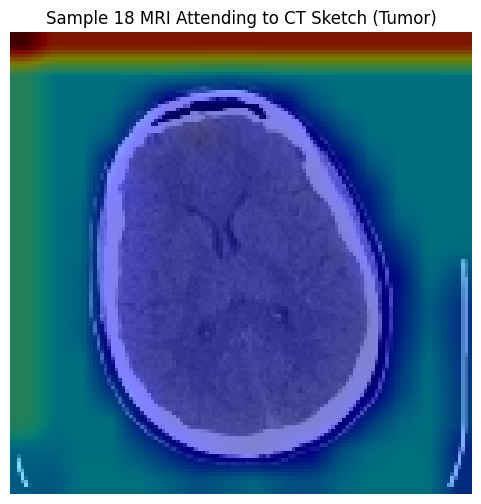


--- Sample 19: True Label: Healthy, Predicted Label: Tumor ---
--- Generating Heatmap for: Sample 19 CT Attending to MRI Sketch (Tumor) ---
Received attention_weights shape: torch.Size([1, 2, 256, 256])


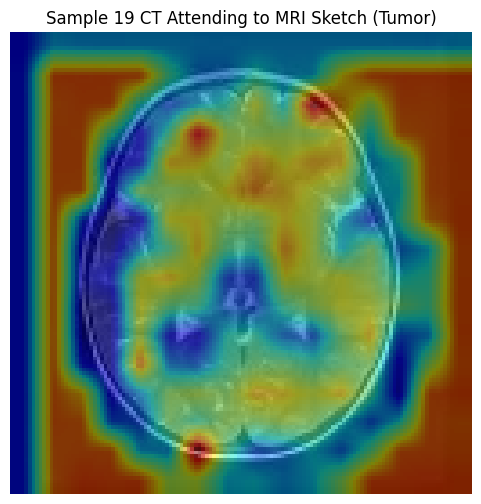

--- Generating Heatmap for: Sample 19 MRI Attending to CT Sketch (Tumor) ---
Received attention_weights shape: torch.Size([1, 2, 256, 256])


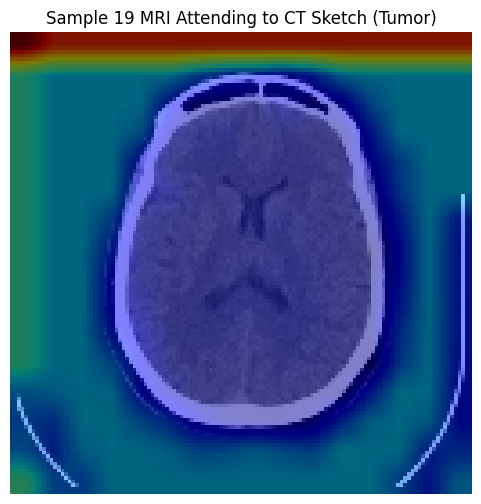


--- Sample 20: True Label: Healthy, Predicted Label: Tumor ---
--- Generating Heatmap for: Sample 20 CT Attending to MRI Sketch (Tumor) ---
Received attention_weights shape: torch.Size([1, 2, 256, 256])


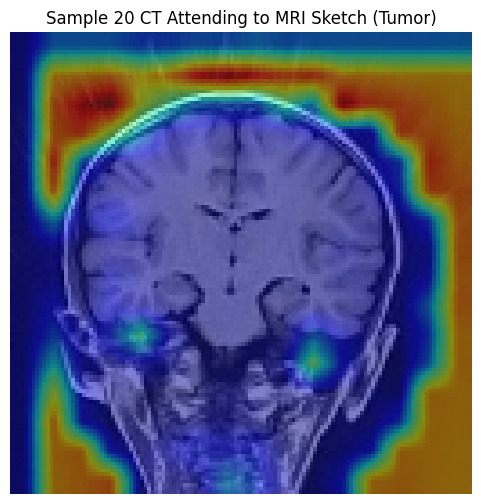

--- Generating Heatmap for: Sample 20 MRI Attending to CT Sketch (Tumor) ---
Received attention_weights shape: torch.Size([1, 2, 256, 256])


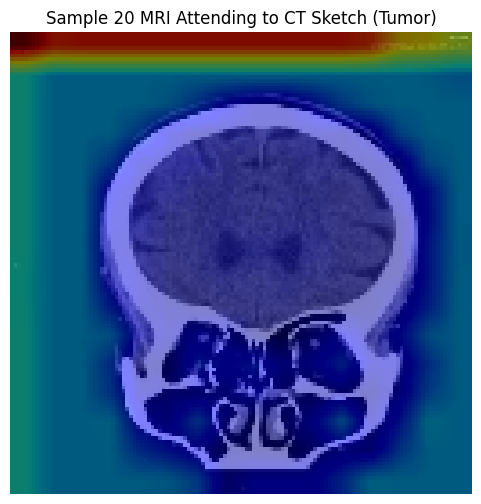

In [ ]:
# @title

# --- Generate and Visualize Sketch Maps for Sample Images ---
# Assuming sample_results list is available
# Ensure categories list is available
categories = ["Healthy", "Tumor"]

if 'sample_results' in globals() and sample_results:
    print("\nGenerating and visualizing Attention Sketch Maps for sample images...")

    for i, result in enumerate(sample_results):
        ct_path = result['ct_path']
        mri_path = result['mri_path']
        ct_mri_attn = result['ct_mri_attention']
        mri_ct_attn = result['mri_ct_attention']
        true_label = result['true_label']
        predicted_label = result['predicted_label']

        if predicted_label is not None:
            predicted_label_name = categories[predicted_label]
        else:
            predicted_label_name = "N/A (Image Load Error)"

        print(f"\n--- Sample {i+1}: True Label: {categories[true_label]}, Predicted Label: {predicted_label_name} ---")

        # Visualize CT Attending to MRI (Overlay on MRI image)
        if ct_mri_attn is not None and torch.is_tensor(ct_mri_attn) and ct_mri_attn.ndim == 4 and ct_mri_attn.size(0) == 1:
            visualize_attention_heatmap(
                mri_path, # Overlay on MRI image
                ct_mri_attn,
                img_size=(128, 128),
                title=f"Sample {i+1} CT Attending to MRI Sketch ({predicted_label_name})",
                            )
        else:
            print(f"Skipping CT Attending to MRI Sketch Map for Sample {i+1} due to unexpected attention shape: {ct_mri_attn.shape if ct_mri_attn is not None and torch.is_tensor(ct_mri_attn) else 'None'}")


        # Visualize MRI Attending to CT (Overlay on CT image)
        if mri_ct_attn is not None and torch.is_tensor(mri_ct_attn) and mri_ct_attn.ndim == 4 and mri_ct_attn.size(0) == 1:
            visualize_attention_heatmap(
                ct_path, # Overlay on CT image
                mri_ct_attn,
                img_size=(128, 128),
                title=f"Sample {i+1} MRI Attending to CT Sketch ({predicted_label_name})",
                            )
        else:
            print(f"Skipping MRI Attending to CT Sketch Map for Sample {i+1} due to unexpected attention shape: {mri_ct_attn.shape if mri_ct_attn is not None and torch.is_tensor(mri_ct_attn) else 'None'}")

else:
    print("Sample results ('sample_results') not available. Please run the previous cells to generate predictions and attention weights.")